# Analyzing NYC's 311 Street Flooding Complaints from 2010 to 2020

Mark Bauer

# Goal
In this notebook, we analyze NYC's 311 Street Flooding Complaints data from 2010 to 2020. Specifically, I attempt to answer the following questions:

- What is the distribution of street flooding complaints by neighborhood?
- How have street flooding complaints changed over time?

# Main Python Libraries:
[pandas](https://pandas.pydata.org/) is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool, built on top of the Python programming language.

[GeoPandas](https://geopandas.org/index.html) is an open source project to make working with geospatial data in python easier. GeoPandas extends the datatypes used by pandas to allow spatial operations on geometric types. Geometric operations are performed by shapely. Geopandas further depends on fiona for file access and descartes and matplotlib for plotting.

[Matplotlib](https://matplotlib.org/3.1.1/index.html#) is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments across platforms.

[Seaborn](https://seaborn.pydata.org/index.html) is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

[geoplot](https://residentmario.github.io/geoplot/index.html#) is a high-level Python geospatial plotting library. It’s an extension to cartopy and matplotlib which makes mapping easy: like seaborn for geospatial.

[fiona](https://github.com/Toblerity/Fiona) is a geospatial library that reads and writes geographical data files.

# Datasets

## 311 Service Requests from 2010 to Present  
Website: https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9

311's data dictionary can be found in the data folder. 



![311](images/nyc-311-screenshot.png)

## Neighborhood Tabulation Areas (NTA)  
Website: https://data.cityofnewyork.us/City-Government/Neighborhood-Tabulation-Areas-NTA-/cpf4-rkhq

![nta](images/nyc-nta-screenshot.png)

Table of Contents
=================

   * [1. Importing Libraries](#1-Importing-Libraries)
       
       
   * [2. Loading Data](#2-Loading-Data)
       
       
   * [3. Data Inspection](#3-Data-Inspection)
       * [3.1 Basic Data Inspection](#31-Basic-Data-Inspection)
       * [3.2 Calculating Summary Statistics](#32-Calculating-Summary-Statistics)
       * [3.3 Identifying Null/NA Values](#33-Identifying-Null/NA-Values)
   
   
   * [4. Data Wrangling](#4-Data-Wrangling)
       * [4.1 Converting date column to Python's datetime64[ns] data type](#41-Converting-date-column-to-Pythons-datetime64[ns]-data-type)
       * [4.2 Dropping null values in our x, y coordinate columns](#42-Dropping-null-values-in-our-x-y-coordinate-columns)
       * [4.3 Creating a GeoDataframe from x,y coordinates](#43-Creating-a-GeoDataframe-from-x-y-coordinates)
       

   * [5. Mapping](#5-Mapping)
       * [5.1 Citywide](#51-Citywide)
       * [5.2 By Borough](#52-By-Borough)
       * [5.3 Bar Charts by Neighborhood Tabulation Areas (NTA)](#53-Bar-Charts-by-Neighborhood-Tabulation-Areas-(NTA))

      
   * [6. Time Series Analysis](#6-Time-Series-Analysis)
       * [6.1 By Year and Borough](#61-By-Year-and-Borough)
       * [6.2 Frequencies](#62-Frequencies)
       * [6.3 Resampling](#63-Resampling)
       * [6.4 Seasonality](#64-Seasonality)
       * [6.5 Resampling for Frequency Average](#65-Resampling-for-Frequency-Average)
       * [6.6 Rolling Averages](66-Rolling-Averages)
       * [6.7 Additional Time Series Analysis](#67-Additional-Time-Series-Analysis)
   
          
   * [7. Anomoly Detection](#7-Anomoly-Detection)
   
          
   * [8. Manually Formatting Date Tick Labels](#8-Manually-Formatting-Date-Tick-Labels)
   
   
   * [9. Timedelta of Complaints](#9-Timedelta-of-Complaints)
   
          
   * [10. Conclusion](#10-Conclusion)

# 1. Importing Libraries

In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import geopandas as gpd
import fiona
from fiona.crs import from_epsg
import geoplot
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.rcParams['savefig.facecolor'] = 'white'
%matplotlib inline

Printing versions of Python modules and packages with **watermark** - the IPython magic extension.

In [2]:
%load_ext watermark

In [3]:
%watermark -v -p numpy,pandas,geopandas,geoplot,fiona,matplotlib.pyplot,seaborn

Python implementation: CPython
Python version       : 3.9.1
IPython version      : 7.19.0

numpy            : 1.19.5
pandas           : 1.2.0
geopandas        : 0.8.1
geoplot          : 0.4.1
fiona            : 1.8.18
matplotlib.pyplot: unknown
seaborn          : 0.11.1



Documention for installing watermark: https://github.com/rasbt/watermark

# 2. Loading Data

### Mac

In [4]:
# list items in data folder
%ls data-raw/

Invalid switch - "".


### Windows

In [5]:
os.listdir('data-raw/')

['raw-street-flooding-data.csv', 'raw-streets-clipped.json']

In [6]:
# read data as a dataframe
flooding_311 = pd.read_csv('data-raw/raw-street-flooding-data.csv', \
                          low_memory = False)

# previewing first five rows in data
print(flooding_311.shape)
flooding_311.head()

(27906, 38)


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,cross_street_1,cross_street_2,intersection_street_1,...,location_type,incident_address,street_name,landmark,bbl,due_date,bridge_highway_name,bridge_highway_direction,road_ramp,bridge_highway_segment
0,45989680,2020-04-12T14:14:00.000,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),BEMENT AVE,N BURGHER AVE,NaN,...,NaN,204 MORRISON AVENUE,MORRISON AVENUE,NaN,5.003000e+09,NaN,NaN,NaN,NaN,NaN
1,45178597,2019-12-16T07:48:00.000,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),NaN,NaN,WILLIAMS AVENUE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,47428465,2020-09-01T09:58:00.000,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),HILLSIDE AVE,E WILLISTON AVE,NaN,...,NaN,84-17 265 STREET,265 STREET,NaN,4.087950e+09,NaN,NaN,NaN,NaN,NaN
3,48133312,2020-11-12T16:23:00.000,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),E 85 ST,E 86 ST,NaN,...,NaN,8518 AVENUE N,AVENUE N,NaN,3.080820e+09,NaN,NaN,NaN,NaN,NaN
4,48135671,2020-11-12T14:19:00.000,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),NaN,NaN,SAPPHIRE STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# previewing the last five rows of our dataframe
flooding_311.tail()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,cross_street_1,cross_street_2,intersection_street_1,...,location_type,incident_address,street_name,landmark,bbl,due_date,bridge_highway_name,bridge_highway_direction,road_ramp,bridge_highway_segment
27901,44965364,2019-11-19T09:59:00.000,2019-12-15T10:00:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),NaN,NaN,VAN SICKLEN STREET,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27902,48037294,2020-11-01T19:49:00.000,2020-11-01T21:25:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),BEND,BEND,NaN,...,NaN,1 ORCHARD BEACH ROAD,ORCHARD BEACH ROAD,NaN,2.056500e+09,NaN,NaN,NaN,NaN,NaN
27903,48039076,2020-11-01T18:17:00.000,2020-11-01T21:00:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),BEACH ST,CROSS ST,NaN,...,NaN,533 MINNIEFORD AVENUE,MINNIEFORD AVENUE,NaN,2.056350e+09,NaN,NaN,NaN,NaN,NaN
27904,48043652,2020-11-01T16:52:00.000,2020-11-02T01:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),230 PL,231 ST,NaN,...,NaN,230-48 148 AVENUE,148 AVENUE,NaN,4.137190e+09,NaN,NaN,NaN,NaN,NaN
27905,48047404,2020-11-02T10:27:00.000,2020-11-02T11:15:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),CO-OP CITY BLVD,BROUN PL,NaN,...,NaN,100 BELLAMY LOOP,BELLAMY LOOP,NaN,2.051410e+09,NaN,NaN,NaN,NaN,NaN


# 3. Data Inspection

## 3.1 Basic Data Inspection

In [8]:
# the object's type
type(flooding_311)

pandas.core.frame.DataFrame

In [9]:
# printing the columns of our dataframe
flooding_311.columns

Index(['unique_key', 'created_date', 'closed_date', 'agency', 'agency_name',
       'complaint_type', 'descriptor', 'cross_street_1', 'cross_street_2',
       'intersection_street_1', 'intersection_street_2', 'status',
       'resolution_description', 'resolution_action_updated_date',
       'community_board', 'borough', 'open_data_channel_type',
       'park_facility_name', 'park_borough', 'incident_zip', 'address_type',
       'city', 'facility_type', 'x_coordinate_state_plane',
       'y_coordinate_state_plane', 'latitude', 'longitude', 'location',
       'location_type', 'incident_address', 'street_name', 'landmark', 'bbl',
       'due_date', 'bridge_highway_name', 'bridge_highway_direction',
       'road_ramp', 'bridge_highway_segment'],
      dtype='object')

In [10]:
# printing the data types of our columns
flooding_311.dtypes

unique_key                          int64
created_date                       object
closed_date                        object
agency                             object
agency_name                        object
complaint_type                     object
descriptor                         object
cross_street_1                     object
cross_street_2                     object
intersection_street_1              object
intersection_street_2              object
status                             object
resolution_description             object
resolution_action_updated_date     object
community_board                    object
borough                            object
open_data_channel_type             object
park_facility_name                 object
park_borough                       object
incident_zip                      float64
address_type                       object
city                               object
facility_type                     float64
x_coordinate_state_plane          

In [11]:
# printing the column names, non-null counts, and data types of our columns
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27906 entries, 0 to 27905
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   unique_key                      27906 non-null  int64  
 1   created_date                    27906 non-null  object 
 2   closed_date                     27895 non-null  object 
 3   agency                          27906 non-null  object 
 4   agency_name                     27906 non-null  object 
 5   complaint_type                  27906 non-null  object 
 6   descriptor                      27906 non-null  object 
 7   cross_street_1                  24144 non-null  object 
 8   cross_street_2                  24133 non-null  object 
 9   intersection_street_1           10098 non-null  object 
 10  intersection_street_2           10098 non-null  object 
 11  status                          27906 non-null  object 
 12  resolution_description          

In [12]:
# printing the columns of our dataframe
flooding_311.columns

Index(['unique_key', 'created_date', 'closed_date', 'agency', 'agency_name',
       'complaint_type', 'descriptor', 'cross_street_1', 'cross_street_2',
       'intersection_street_1', 'intersection_street_2', 'status',
       'resolution_description', 'resolution_action_updated_date',
       'community_board', 'borough', 'open_data_channel_type',
       'park_facility_name', 'park_borough', 'incident_zip', 'address_type',
       'city', 'facility_type', 'x_coordinate_state_plane',
       'y_coordinate_state_plane', 'latitude', 'longitude', 'location',
       'location_type', 'incident_address', 'street_name', 'landmark', 'bbl',
       'due_date', 'bridge_highway_name', 'bridge_highway_direction',
       'road_ramp', 'bridge_highway_segment'],
      dtype='object')

In [13]:
flooding_311 = flooding_311[['unique_key', 'created_date', 'closed_date', 'agency', 'agency_name',
                           'complaint_type', 'descriptor', 'incident_zip', 'intersection_street_1',
                           'intersection_street_2', 'address_type', 'city', 'status',
                           'resolution_description', 'resolution_action_updated_date',
                           'community_board', 'borough', 'x_coordinate_state_plane',
                           'y_coordinate_state_plane', 'open_data_channel_type',
                           'park_facility_name', 'park_borough', 'latitude', 'longitude',
                           'location', 'incident_address', 'street_name', 'cross_street_1',
                           'cross_street_2', 'bbl']]

In [14]:
# printing the column names, non-null counts, and data types of our columns
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27906 entries, 0 to 27905
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   unique_key                      27906 non-null  int64  
 1   created_date                    27906 non-null  object 
 2   closed_date                     27895 non-null  object 
 3   agency                          27906 non-null  object 
 4   agency_name                     27906 non-null  object 
 5   complaint_type                  27906 non-null  object 
 6   descriptor                      27906 non-null  object 
 7   incident_zip                    27048 non-null  float64
 8   intersection_street_1           10098 non-null  object 
 9   intersection_street_2           10098 non-null  object 
 10  address_type                    27900 non-null  object 
 11  city                            27049 non-null  object 
 12  status                          

In [15]:
# counts of unique values of our datatypes 
flooding_311.dtypes.value_counts()

object     23
float64     6
int64       1
dtype: int64

In [16]:
# printing index type
flooding_311.index

RangeIndex(start=0, stop=27906, step=1)

In [17]:
cols_unique = flooding_311.columns

print('Inpecting data for unique columns (True/False)\n' + \
     ('-' * 46))

for i in cols_unique:
    print(str(i) + ':', flooding_311[i].is_unique)

Inpecting data for unique columns (True/False)
----------------------------------------------
unique_key: True
created_date: False
closed_date: False
agency: False
agency_name: False
complaint_type: False
descriptor: False
incident_zip: False
intersection_street_1: False
intersection_street_2: False
address_type: False
city: False
status: False
resolution_description: False
resolution_action_updated_date: False
community_board: False
borough: False
x_coordinate_state_plane: False
y_coordinate_state_plane: False
open_data_channel_type: False
park_facility_name: False
park_borough: False
latitude: False
longitude: False
location: False
incident_address: False
street_name: False
cross_street_1: False
cross_street_2: False
bbl: False


In [18]:
# printing True/False if column is unique on our unique key (DOITT_ID)
flooding_311['unique_key'].is_unique

True

In [19]:
# printing descriptive statistics of our numeric columns in our data
all_columns = flooding_311.columns
flooding_311[all_columns].astype(str).describe(include='all')[:2].T.sort_values(by='unique', 
                                                                                ascending=False)

,count,unique
unique_key,27906,27906
created_date,27906,26397
closed_date,27906,25420
resolution_action_updated_date,27906,25411
location,27906,15919
longitude,27906,15836
latitude,27906,15834
x_coordinate_state_plane,27906,15675
y_coordinate_state_plane,27906,15632
incident_address,27906,12448


In [20]:
flooding_311['descriptor'].value_counts()

Street Flooding (SJ)    27906
Name: descriptor, dtype: int64

In [21]:
flooding_311['agency'].value_counts()

DEP    27906
Name: agency, dtype: int64

In [22]:
flooding_311['agency_name'].value_counts()

Department of Environmental Protection    27906
Name: agency_name, dtype: int64

In [23]:
flooding_311['complaint_type'].value_counts()

Sewer    27906
Name: complaint_type, dtype: int64

In [24]:
flooding_311['status'].value_counts()

Closed      27891
Open            8
Pending         4
Started         2
Assigned        1
Name: status, dtype: int64

In [25]:
flooding_311['resolution_description'].value_counts().reset_index().head()

,index,resolution_description
0,The Department of Environment Protection inspe...,11543
1,The Department of Environmental Protection has...,4036
2,The Department of Environmental Protection ins...,3507
3,The Department of Environmental Protection inv...,2919
4,The Department of Environmental Protection ins...,1276


In [26]:
print('Top 10 Resolution Descriptions in Descending Order:\n')

for i in range(10):
    print(str(i + 1) + '.', \
          flooding_311['resolution_description'].value_counts().index[i], \
          '\nCount: ' \
          f"{flooding_311['resolution_description'].value_counts()[i]:,}" + \
          '\n')

Top 10 Resolution Descriptions in Descending Order:

1. The Department of Environment Protection inspected your complaint but could not find the problem you reported. If the condition persists, please call 311 (or 212-639-9675 if calling from a non-New York City area code) with more detailed information to submit a new complaint. 
Count: 11,543

2. The Department of Environmental Protection has determined that this issue was previously reported by another customer The original complaint is being addressed. If the condition persists, please call 311 (or 212-639-9675 if calling from a non-New York City area code) to submit a new complaint. 
Count: 4,036

3. The Department of Environmental Protection inspected your complaint and referred it to the Department of Transportation for further action. If the problem persists, please call 311 (or 212-639-9675 if calling from a non-New York City area code) to submit a new complaint. 
Count: 3,507

4. The Department of Environmental Protection inv

In [27]:
flooding_311.created_date.min()

'2010-01-02T08:26:00.000'

In [28]:
flooding_311.created_date.max()

'2021-01-08T18:50:00.000'

In [29]:
print('This dataset is from', \
      flooding_311.created_date.min()[0:10], \
      'to', \
      flooding_311.created_date.max()[0:10] + \
      '.')

This dataset is from 2010-01-02 to 2021-01-08.


## 3.2 Calcualting Summary Statistics

In [30]:
# display floats up to three decimals
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [31]:
# printing descriptive statistics of our numeric columns in our data
flooding_311.describe()

,unique_key,incident_zip,x_coordinate_state_plane,y_coordinate_state_plane,latitude,longitude,bbl
count,27906.00,27048.00,26962.00,26962.00,24463.00,24463.00,16162.00
mean,32437036.56,10969.21,1005501.57,186179.32,40.68,-73.92,3699927573.33
std,9189637.08,536.21,35051.50,30569.78,0.08,0.13,1075574858.08
min,15639934.00,10001.00,913357.00,121032.00,40.50,-74.25,0.00
25%,24290245.50,10312.00,986881.50,161259.00,40.61,-73.99,3060247507.50
50%,32763447.50,11220.00,1007480.00,183607.00,40.67,-73.92,4067968765.50
75%,40396623.50,11385.00,1033988.25,206461.00,40.73,-73.82,4156275008.50
max,48597523.00,11697.00,1067279.00,271876.00,40.91,-73.70,5080500078.00


In [32]:
flooding_311.describe(include=['O']).T

,count,unique,top,freq
created_date,27906,26397,2011-08-28T00:00:00.000,13
closed_date,27895,25419,2017-05-06T08:30:00.000,36
agency,27906,1,DEP,27906
agency_name,27906,1,Department of Environmental Protection,27906
complaint_type,27906,1,Sewer,27906
descriptor,27906,1,Street Flooding (SJ),27906
intersection_street_1,10098,2819,BROADWAY,98
intersection_street_2,10098,2842,BROADWAY,169
address_type,27900,3,ADDRESS,16737
city,27049,87,BROOKLYN,6979


In [33]:
# printing descriptive statistics of our numeric columns in our data
flooding_311.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
unique_key,27906.0,NaN,NaN,NaN,32437036.56,9189637.08,15639934.00,24290245.50,32763447.50,40396623.50,48597523.00
created_date,27906,26397,2011-08-28T00:00:00.000,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
closed_date,27895,25419,2017-05-06T08:30:00.000,36,NaN,NaN,NaN,NaN,NaN,NaN,NaN
agency,27906,1,DEP,27906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
agency_name,27906,1,Department of Environmental Protection,27906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
complaint_type,27906,1,Sewer,27906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
descriptor,27906,1,Street Flooding (SJ),27906,NaN,NaN,NaN,NaN,NaN,NaN,NaN
incident_zip,27048.0,NaN,NaN,NaN,10969.21,536.21,10001.00,10312.00,11220.00,11385.00,11697.00
intersection_street_1,10098,2819,BROADWAY,98,NaN,NaN,NaN,NaN,NaN,NaN,NaN
intersection_street_2,10098,2842,BROADWAY,169,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
# returning the mode of our numeric columns (excluding our unique key = 'DOITT_ID') as 'mode'
mode = flooding_311.loc[:, flooding_311.columns != 'unique_key'].mode(numeric_only=False)

# renaming index to 'mode'
mode.rename(index={0: "mode"}, inplace=True)
mode

,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,address_type,...,park_facility_name,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl
mode,2011-08-28T00:00:00.000,2017-05-06T08:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10306.00,BROADWAY,BROADWAY,ADDRESS,...,Unspecified,QUEENS,40.68,-73.74,"{'latitude': '40.676373', 'longitude': '-73.73...",133-25 FRANCIS LEWIS BOULEVARD,BROADWAY,BEND,DEAD END,4129700015.00


In [35]:
# transposing and printing the mode ofour numeric columns (excluding our unique key = 'DOITT_ID')
mode.T

,mode
created_date,2011-08-28T00:00:00.000
closed_date,2017-05-06T08:30:00.000
agency,DEP
agency_name,Department of Environmental Protection
complaint_type,Sewer
descriptor,Street Flooding (SJ)
incident_zip,10306.00
intersection_street_1,BROADWAY
intersection_street_2,BROADWAY
address_type,ADDRESS


In [36]:
flooding_311.iloc[:, -5:].head()

,incident_address,street_name,cross_street_1,cross_street_2,bbl
0,204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00
1,NaN,NaN,NaN,NaN,NaN
2,84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00
3,8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00
4,NaN,NaN,NaN,NaN,NaN


In [37]:
flooding_311.iloc[:, -5:].describe(include=['O']).T

,count,unique,top,freq
incident_address,17865,12447,133-25 FRANCIS LEWIS BOULEVARD,59
street_name,17865,4097,BROADWAY,116
cross_street_1,24144,4611,BEND,342
cross_street_2,24133,4687,DEAD END,494


In [38]:
# compute pairwise correlation of columns, excluding NA/null values
flooding_311.corr()

,unique_key,incident_zip,x_coordinate_state_plane,y_coordinate_state_plane,latitude,longitude,bbl
unique_key,1.00,0.03,0.02,0.03,0.04,0.02,-0.03
incident_zip,0.03,1.00,0.71,-0.10,-0.10,0.70,0.13
x_coordinate_state_plane,0.02,0.71,1.00,0.46,0.46,1.00,-0.20
y_coordinate_state_plane,0.03,-0.10,0.46,1.00,1.00,0.46,-0.58
latitude,0.04,-0.10,0.46,1.00,1.00,0.46,-0.58
longitude,0.02,0.70,1.00,0.46,0.46,1.00,-0.20
bbl,-0.03,0.13,-0.20,-0.58,-0.58,-0.20,1.00


<AxesSubplot:>

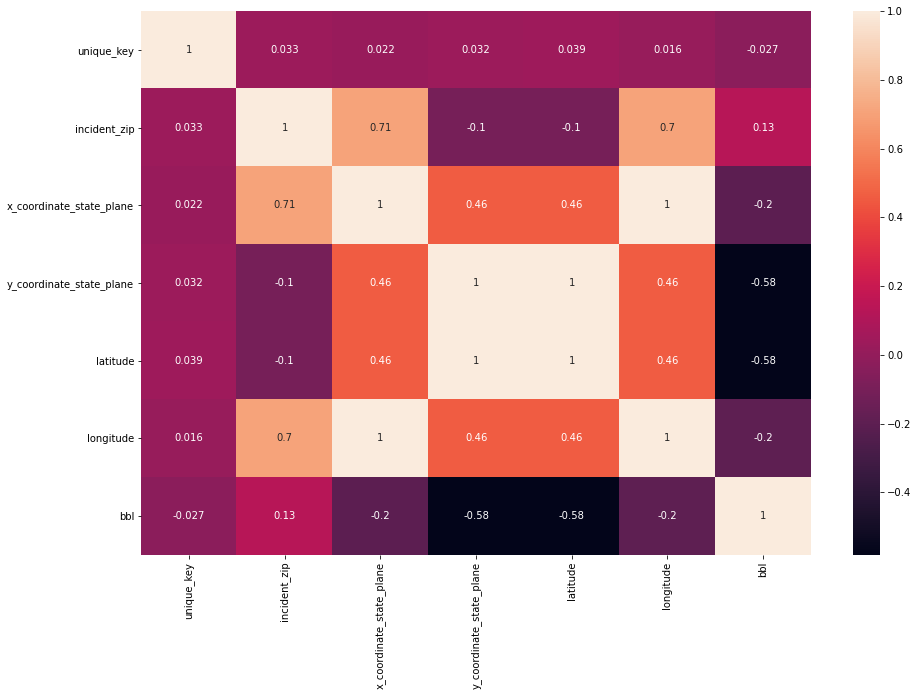

In [39]:
fig, ax = plt.subplots(figsize=(15,10))

sns.heatmap(flooding_311.corr(), 
            annot=True, 
            ax=ax)

## 3.3 Identifying Null/NA Values

In [40]:
print('Sum of nulls in column:')
flooding_311.isna().sum().sort_values(ascending=False)

Sum of nulls in column:


intersection_street_1             17808
intersection_street_2             17808
bbl                               11744
street_name                       10041
incident_address                  10041
cross_street_2                     3773
cross_street_1                     3762
location                           3443
longitude                          3443
latitude                           3443
x_coordinate_state_plane            944
y_coordinate_state_plane            944
incident_zip                        858
city                                857
resolution_description               15
closed_date                          11
resolution_action_updated_date        8
address_type                          6
park_facility_name                    0
park_borough                          0
unique_key                            0
open_data_channel_type                0
borough                               0
created_date                          0
status                                0


In [41]:
print('Sum of nulls in all columns:')
flooding_311.isna().sum().sum()

Sum of nulls in all columns:


88949

In [42]:
print('Identifying nulls in column (True/False):')
flooding_311.isna().head()

Identifying nulls in column (True/False):


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_facility_name,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl
0,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,True,True,True
2,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,True,True,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,True,True,True,True


In [43]:
print('Identifying any null values in column (True/False):')
flooding_311.isna().any().sort_values(ascending=False)

Identifying any null values in column (True/False):


bbl                                True
city                               True
y_coordinate_state_plane           True
x_coordinate_state_plane           True
latitude                           True
longitude                          True
resolution_action_updated_date     True
resolution_description             True
location                           True
address_type                       True
intersection_street_2              True
intersection_street_1              True
incident_zip                       True
incident_address                   True
street_name                        True
cross_street_1                     True
cross_street_2                     True
closed_date                        True
park_facility_name                False
park_borough                      False
unique_key                        False
open_data_channel_type            False
borough                           False
created_date                      False
status                            False


In [44]:
# return a boolean same-sized object indicating if any of the values are NA
flooding_311.isna().any().value_counts()

True     18
False    12
dtype: int64

In [45]:
# return descriptive statistics of boolean indicating if any of the values are NA
flooding_311.isna().any().describe()

count       30
unique       2
top       True
freq        18
dtype: object

In [46]:
# calculating a percentage of the number of nulls to total number of records of each column
missing_data = (flooding_311.isna().sum() / len(flooding_311)) * 100

# creating a dataframe
missing_data = pd.DataFrame({'Missing Ratio (%)' :missing_data}) 
missing_data.sort_values(by='Missing Ratio (%)', 
                         ascending=False, 
                         inplace=True)

missing_data.head(len(missing_data))

,Missing Ratio (%)
intersection_street_1,63.81
intersection_street_2,63.81
bbl,42.08
street_name,35.98
incident_address,35.98
cross_street_2,13.52
cross_street_1,13.48
location,12.34
longitude,12.34
latitude,12.34


In [47]:
len(flooding_311.columns)

30

In [48]:
flooding_311.iloc[:,:15].head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,address_type,city,status,resolution_description,resolution_action_updated_date
0,45989680,2020-04-12T14:14:00.000,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,ADDRESS,STATEN ISLAND,Closed,The Department of Environmental Protection ins...,2020-04-13T08:10:00.000
1,45178597,2019-12-16T07:48:00.000,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,INTERSECTION,BROOKLYN,Closed,The status of this Service Request is currentl...,2020-01-16T13:35:00.000
2,47428465,2020-09-01T09:58:00.000,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,ADDRESS,Floral Park,Closed,The Department of Environment Protection inspe...,2020-09-01T18:05:00.000
3,48133312,2020-11-12T16:23:00.000,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,ADDRESS,BROOKLYN,Closed,The Department of Environmental Protection ins...,2020-11-13T14:10:00.000
4,48135671,2020-11-12T14:19:00.000,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,INTERSECTION,BROOKLYN,Closed,The Department of Environment Protection inspe...,2020-11-16T08:35:00.000


In [49]:
flooding_311.iloc[:,15:30].head()

,community_board,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl
0,01 STATEN ISLAND,STATEN ISLAND,952928.00,168312.00,ONLINE,Unspecified,STATEN ISLAND,40.63,-74.11,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00
1,05 BROOKLYN,BROOKLYN,1011768.00,185786.00,PHONE,Unspecified,BROOKLYN,40.68,-73.90,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN
2,13 QUEENS,QUEENS,1066404.00,208228.00,PHONE,Unspecified,QUEENS,40.74,-73.70,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00
3,18 BROOKLYN,BROOKLYN,1011924.00,168751.00,ONLINE,Unspecified,BROOKLYN,40.63,-73.90,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00
4,05 BROOKLYN,BROOKLYN,1023962.00,182899.00,PHONE,Unspecified,BROOKLYN,40.67,-73.86,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN


# 4. Data Wrangling

## 4.1 Converting date column to Python's datetime64[ns] data type

In [50]:
flooding_311.created_date = pd.to_datetime(flooding_311.created_date)
flooding_311['year'] = flooding_311['created_date'].dt.year

print('Formatting our create_date column as', flooding_311.created_date.dtype, \
      'and extracting a year column.')

Formatting our create_date column as datetime64[ns] and extracting a year column.


In [51]:
flooding_311[['created_date']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27906 entries, 0 to 27905
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   created_date  27906 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 218.1 KB


In [52]:
print('Summary statistics on our date column.')

flooding_311[['created_date']].describe()

Summary statistics on our date column.


<ipython-input-52-2b53dd6b14e5>:3: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  flooding_311[['created_date']].describe()


,created_date
count,27906
unique,26397
top,2011-08-28 00:00:00
freq,13
first,2010-01-02 08:26:00
last,2021-01-08 18:50:00


In [53]:
print('Summary statistics on our year column.')

flooding_311[['year']].describe()

Summary statistics on our year column.


,year
count,27906.00
mean,2015.31
std,3.23
min,2010.00
25%,2012.00
50%,2016.00
75%,2018.00
max,2021.00


In [54]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,STATEN ISLAND,40.63,-74.11,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,BROOKLYN,40.68,-73.90,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,QUEENS,40.74,-73.70,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,BROOKLYN,40.63,-73.90,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,BROOKLYN,40.67,-73.86,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020


In [55]:
len(flooding_311)

27906

## 4.2 Dropping null values in our x, y coordinate columns

In [56]:
flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27906 entries, 0 to 27905
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   x_coordinate_state_plane  26962 non-null  float64
 1   y_coordinate_state_plane  26962 non-null  float64
dtypes: float64(2)
memory usage: 436.2 KB


In [57]:
print('Count of nulls:')

flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].isna().sum()

Count of nulls:


x_coordinate_state_plane    944
y_coordinate_state_plane    944
dtype: int64

In [58]:
print('% of nulls:')


flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].isna().sum() / len(flooding_311) * 100

% of nulls:


x_coordinate_state_plane   3.38
y_coordinate_state_plane   3.38
dtype: float64

In [59]:
flooding_311[['x_coordinate_state_plane', 'y_coordinate_state_plane']].head()

,x_coordinate_state_plane,y_coordinate_state_plane
0,952928.00,168312.00
1,1011768.00,185786.00
2,1066404.00,208228.00
3,1011924.00,168751.00
4,1023962.00,182899.00


In [60]:
flooding_311.sort_values(by='x_coordinate_state_plane', na_position='first').iloc[:, [17, 18]]

,x_coordinate_state_plane,y_coordinate_state_plane
44,NaN,NaN
48,NaN,NaN
51,NaN,NaN
59,NaN,NaN
61,NaN,NaN
...,...,...
23571,1066730.00,209229.00
15474,1066922.00,209281.00
17795,1067038.00,210697.00
17745,1067038.00,210697.00


In [61]:
len(flooding_311.loc[flooding_311.x_coordinate_state_plane.isnull()])

944

In [62]:
flooding_311.loc[flooding_311['x_coordinate_state_plane'].isnull()].head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
44,43008701,2019-06-18 18:18:00,2019-06-21T07:55:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11434.00,NaN,NaN,...,QUEENS,NaN,NaN,NaN,168 STREET,168 STREET,BEDELL STREET,BAISLEY BOULEVARD,NaN,2019
48,45183976,2019-12-17 08:19:00,2019-12-17T13:20:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),NaN,NaN,NaN,...,QUEENS,NaN,NaN,NaN,23 ST,23 ST,44 RD,NaN,NaN,2019
51,43351023,2019-07-22 22:12:00,2019-07-23T11:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),NaN,BROADWAY,NAGLE AVE,...,MANHATTAN,NaN,NaN,NaN,NaN,NaN,BROADWAY,NAGLE AVE,NaN,2019
59,43355077,2019-07-23 11:56:00,2019-07-23T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),NaN,NaN,NaN,...,MANHATTAN,NaN,NaN,NaN,GRAND CENTRAL TERMINAL,GRAND CENTRAL TERMINAL,VANDERBILT AVE,PARK AVE,NaN,2019
61,48157467,2020-11-15 21:30:00,2020-11-16T09:15:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11206.00,NaN,NaN,...,BROOKLYN,NaN,NaN,NaN,MARCY AVENUE,MARCY AVENUE,FLUSHING AVENUE,PARK AVENUE,NaN,2020


In [63]:
len(flooding_311.loc[flooding_311.x_coordinate_state_plane.notnull()])

26962

In [64]:
flooding_311.loc[flooding_311['x_coordinate_state_plane'].notnull()].head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,STATEN ISLAND,40.63,-74.11,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,BROOKLYN,40.68,-73.90,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,QUEENS,40.74,-73.70,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,BROOKLYN,40.63,-73.90,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,BROOKLYN,40.67,-73.86,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020


## 4.3 Creating a GeoDataframe from x,y coordinates

In [65]:
print('Dropping nulls in the x, y coordinate columns and creating a geodataframe.')

to_points = flooding_311.loc[flooding_311['x_coordinate_state_plane'].notnull()]

gdf = gpd.GeoDataFrame(to_points, 
                       geometry=gpd.points_from_xy(to_points.x_coordinate_state_plane, 
                                                   to_points.y_coordinate_state_plane))

gdf.head()

Dropping nulls in the x, y coordinate columns and creating a geodataframe.


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,geometry
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,40.63,-74.11,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020,POINT (952928.000 168312.000)
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,40.68,-73.90,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019,POINT (1011768.000 185786.000)
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,40.74,-73.70,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020,POINT (1066404.000 208228.000)
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,40.63,-73.90,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020,POINT (1011924.000 168751.000)
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,40.67,-73.86,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020,POINT (1023962.000 182899.000)


In [66]:
print('Our new dataframe contains ' + \
      f"{len(gdf):,}" + ' rows.\n')

print("We've dropped " + \
      f"{round((1 - len(gdf)/len(flooding_311)) * 100, 2):,}" + \
      ' percent of our data for mapping purposes.')

Our new dataframe contains 26,962 rows.

We've dropped 3.38 percent of our data for mapping purposes.


In [67]:
gdf[['geometry']].info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 26962 entries, 0 to 27905
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  26962 non-null  geometry
dtypes: geometry(1)
memory usage: 421.3 KB


In [68]:
print('Nulls in our new geometry column:')

gdf[['geometry']].isna().sum()

Nulls in our new geometry column:


geometry    0
dtype: int64

In [69]:
print('Nulls in our x, y coordinate columns:')

gdf[['x_coordinate_state_plane', 'y_coordinate_state_plane']].isna().sum()

Nulls in our x, y coordinate columns:


x_coordinate_state_plane    0
y_coordinate_state_plane    0
dtype: int64

In [70]:
gdf.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,geometry
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,40.63,-74.11,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020,POINT (952928.000 168312.000)
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,40.68,-73.90,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019,POINT (1011768.000 185786.000)
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,40.74,-73.70,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020,POINT (1066404.000 208228.000)
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,40.63,-73.90,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020,POINT (1011924.000 168751.000)
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,40.67,-73.86,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020,POINT (1023962.000 182899.000)


# 5. Mapping

In [71]:
print(type(gdf))

<class 'geopandas.geodataframe.GeoDataFrame'>


In [72]:
gdf.set_crs(epsg=2263, 
            inplace=True)

gdf.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

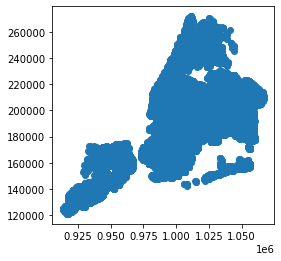

In [73]:
gdf.plot()

In [74]:
gdf.shape

(26962, 32)

In [75]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
nta_shape = gpd.read_file(url)

print(len(nta_shape))
nta_shape.head()

195


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((-73.97605 40.63128, -73.97717 ..."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((-73.80379 40.77561, -73.80099 ..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((-73.86110 40.76366, -73.85993 ..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((-73.94826 40.63861, -73.94923 ..."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((-73.75726 40.71814, -73.75589 ..."


In [76]:
nta_shape.to_crs(epsg=2263, 
                 inplace=True)

nta_shape.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

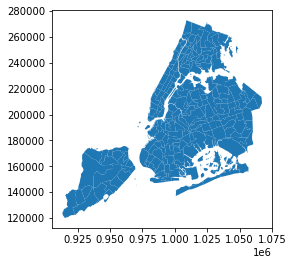

In [77]:
nta_shape.plot()

In [78]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 26962 entries, 0 to 27905
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      26962 non-null  int64         
 1   created_date                    26962 non-null  datetime64[ns]
 2   closed_date                     26951 non-null  object        
 3   agency                          26962 non-null  object        
 4   agency_name                     26962 non-null  object        
 5   complaint_type                  26962 non-null  object        
 6   descriptor                      26962 non-null  object        
 7   incident_zip                    26962 non-null  float64       
 8   intersection_street_1           9355 non-null   object        
 9   intersection_street_2           9355 non-null   object        
 10  address_type                    26962 non-null  object        

## 5.1 City-wide 

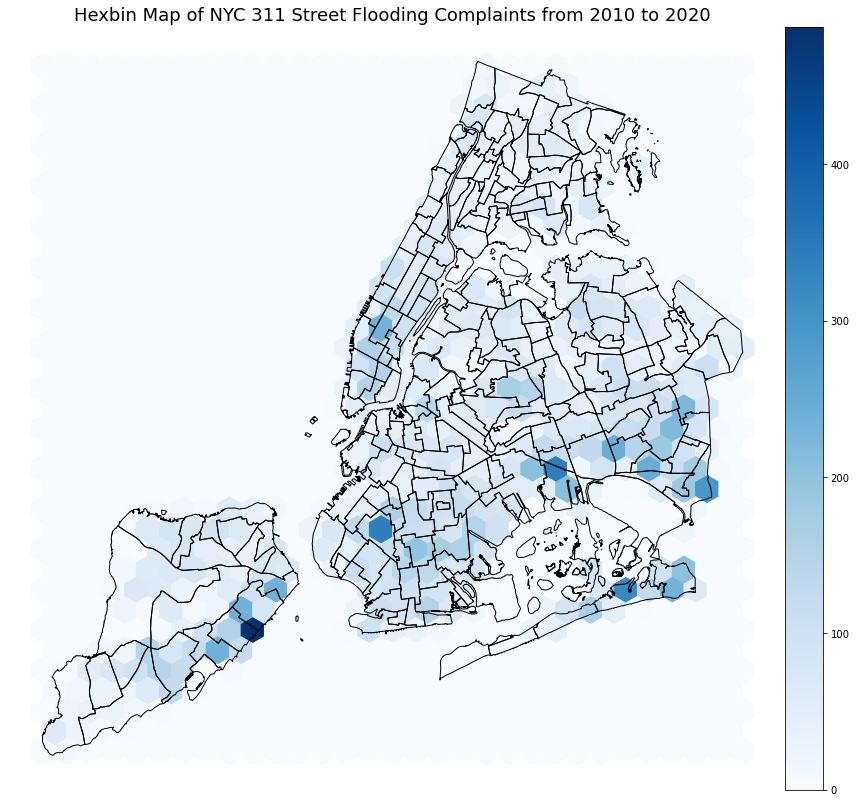

In [79]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(gdf['x_coordinate_state_plane'], 
               gdf['y_coordinate_state_plane'], 
               gridsize=30, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape.to_crs(2263).plot(facecolor="none", 
                            edgecolor="black", 
                            ax=ax)

ax.set_title("Hexbin Map of NYC 311 Street Flooding Complaints from 2010 to 2020", fontsize=18)
ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

C:\Users\datal\.conda\envs\mebauer-flood\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\datal\.conda\envs\mebauer-flood\lib\site-packages\seaborn\distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


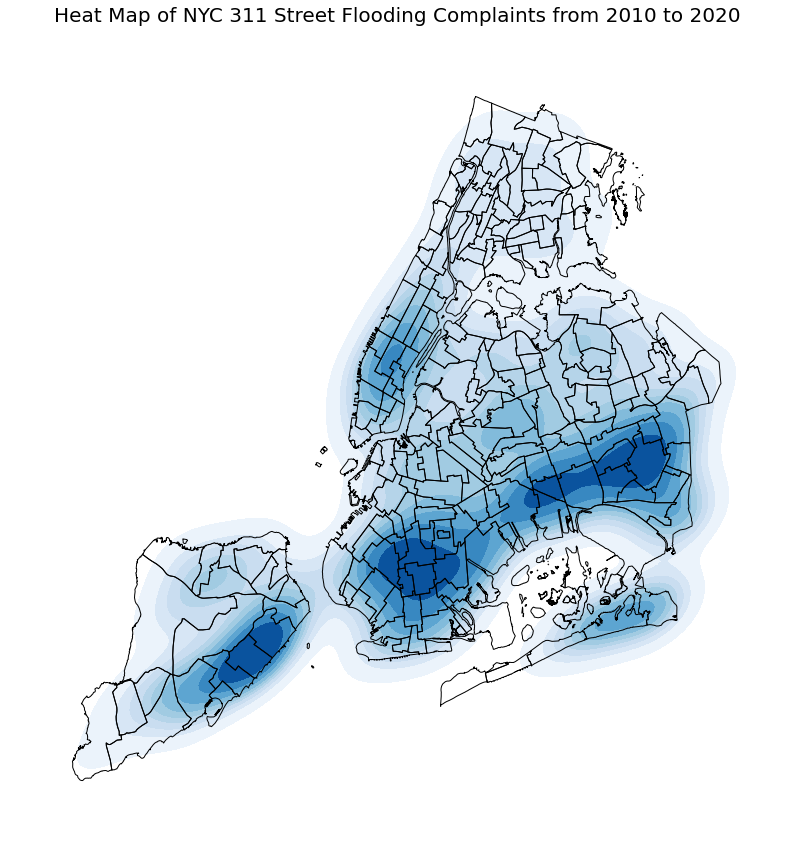

In [80]:
ax = geoplot.kdeplot(gdf.to_crs(4326),
                     shade=True, 
                     cmap='Blues',
                     projection=geoplot.crs.AlbersEqualArea(), 
                     figsize=(12, 12))

geoplot.polyplot(nta_shape.to_crs(4326), 
                 ax=ax, 
                 zorder=1)

ax.set_title('Heat Map of NYC 311 Street Flooding Complaints from 2010 to 2020', fontsize=20)
ax.set_aspect('equal', 'box')
plt.tight_layout()

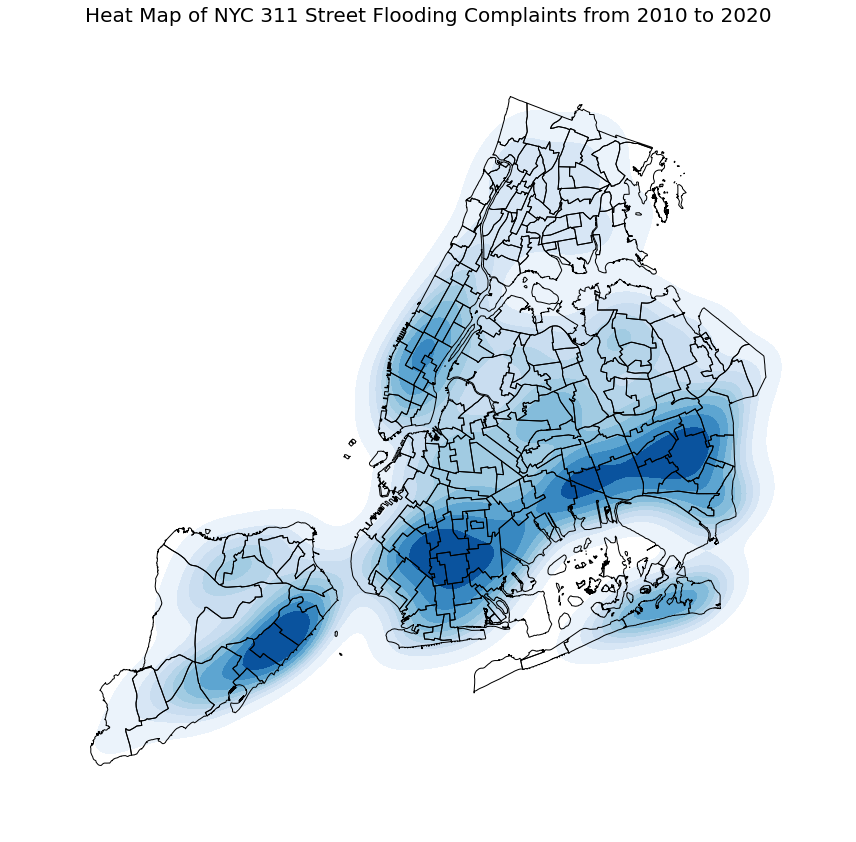

In [81]:
fig, ax = plt.subplots(figsize=(12, 12))

sns.kdeplot(data=gdf,
            x='x_coordinate_state_plane',
            y='y_coordinate_state_plane',
            fill=True,
            cmap='Blues',
            ax=ax)

nta_shape.plot(ax=ax, 
               color='None', 
               edgecolor='black', 
               zorder=1)

ax.set_title('Heat Map of NYC 311 Street Flooding Complaints from 2010 to 2020', fontsize=20)
ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()
plt.savefig('figures/cover-photo.png')

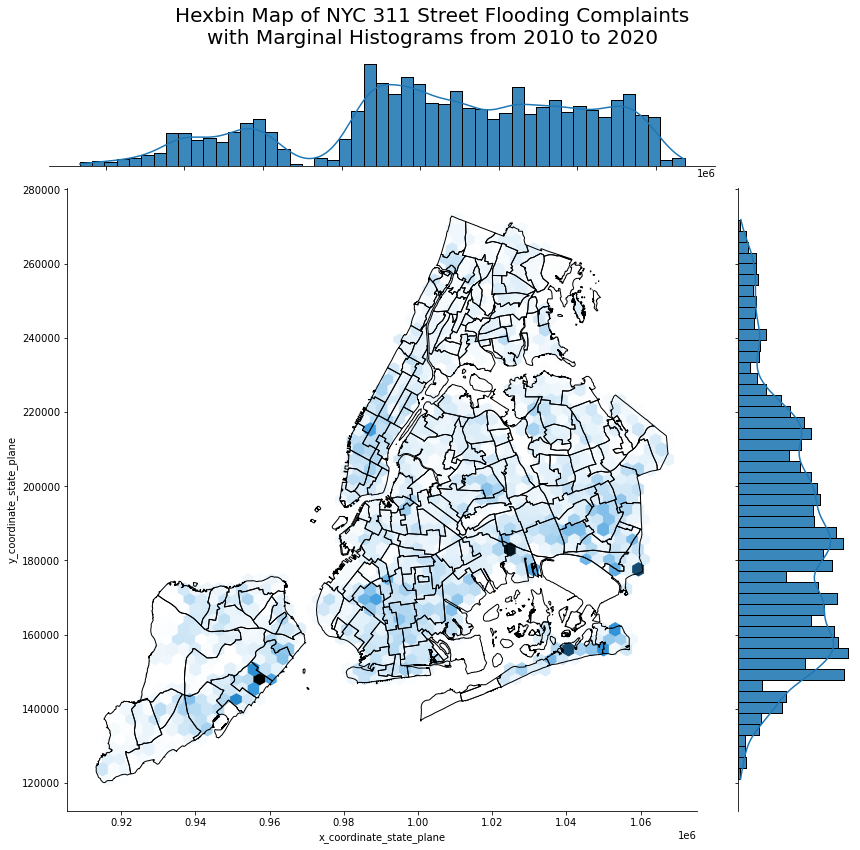

In [82]:
g = sns.jointplot(x='x_coordinate_state_plane',
                  y='y_coordinate_state_plane', 
                  data=gdf,
                  kind="hex", 
                  height=12) 

g.plot_marginals(sns.histplot, 
                 kde=True)


nta_shape.to_crs(epsg=2263).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')


g.fig.suptitle('Hexbin Map of NYC 311 Street Flooding Complaints\nwith Marginal ' + \
               'Histograms from 2010 to 2020\n', 
               fontsize=20)
g.fig.subplots_adjust(top=0.92)

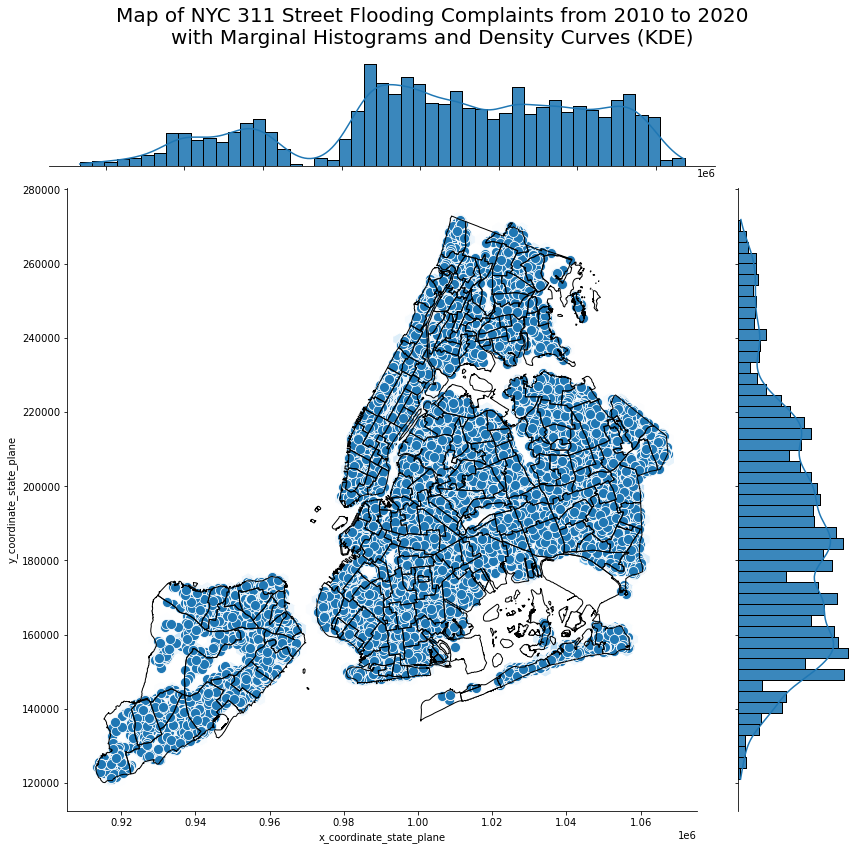

In [83]:
g = sns.jointplot(x='x_coordinate_state_plane',
                  y='y_coordinate_state_plane', 
                  data=gdf,
                  kind="hex", 
                  color='#1f77b4',
                  height=12) 

g.plot_joint(sns.scatterplot, 
             s=100)

g.plot_marginals(sns.histplot, 
                 kde=True)

nta_shape.to_crs(epsg=2263).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle('Map of NYC 311 Street Flooding Complaints from 2010 to 2020\n' + \
               'with Marginal Histograms and Density Curves (KDE)', 
               fontsize=20)
g.fig.subplots_adjust(top=0.92)

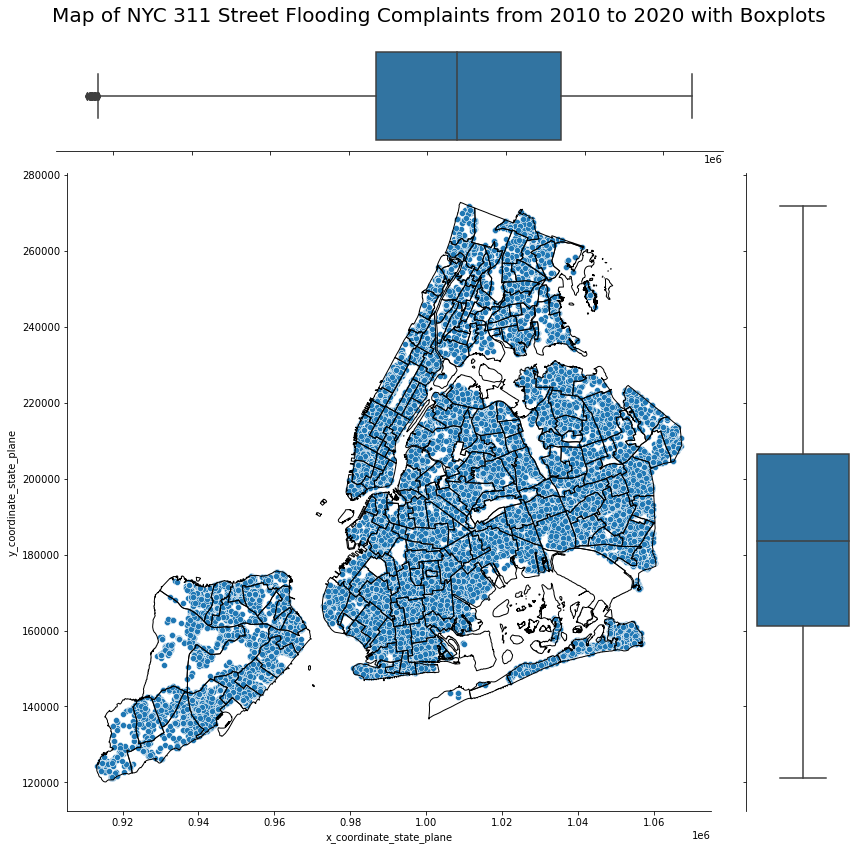

In [84]:
g = sns.JointGrid(x='x_coordinate_state_plane',
                  y='y_coordinate_state_plane', 
                  data=gdf,
                  height=12) 

g.plot(sns.scatterplot, 
       sns.boxplot)



nta_shape.to_crs(epsg=2263).plot(ax=g.ax_joint, 
                                 zorder=1, 
                                 color='none', 
                                 edgecolor='black')

g.fig.suptitle("Map of NYC 311 Street Flooding Complaints from 2010 to 2020 with Boxplots", 
               fontsize=20)
g.fig.subplots_adjust(top=0.94)
plt.savefig('figures/suptitle.png')

In [85]:
gdf.iloc[:, -4:]

,cross_street_2,bbl,year,geometry
0,N BURGHER AVE,5003000147.00,2020,POINT (952928.000 168312.000)
1,NaN,NaN,2019,POINT (1011768.000 185786.000)
2,E WILLISTON AVE,4087950010.00,2020,POINT (1066404.000 208228.000)
3,E 86 ST,3080820008.00,2020,POINT (1011924.000 168751.000)
4,NaN,NaN,2020,POINT (1023962.000 182899.000)
...,...,...,...,...
27901,NaN,NaN,2019,POINT (991182.000 156700.000)
27902,BEND,2056500001.00,2020,POINT (1038783.000 254540.000)
27903,CROSS ST,2056350024.00,2020,POINT (1042704.000 250109.000)
27904,231 ST,4137190009.00,2020,POINT (1053093.000 178349.000)


In [86]:
len(gdf)

26962

In [87]:
gdf[['geometry']].notnull().sum()

geometry    26962
dtype: int64

In [88]:
gdf[['geometry']].isnull().sum()

geometry    0
dtype: int64

In [89]:
flooding_complaints_with_nta = gpd.sjoin(gdf, 
                                         nta_shape, 
                                         how="inner", 
                                         op='within')

In [90]:
len(flooding_complaints_with_nta)

26959

In [91]:
print('Our new dataframe contains ' + \
      f"{len(flooding_complaints_with_nta):,}" + ' rows.\n')

print("We've dropped " + \
      f"{round((1 - len(flooding_complaints_with_nta)/len(gdf)) * 100, 2):,}" + \
      ' percent of our data in our spatial join process.')

Our new dataframe contains 26,959 rows.

We've dropped 0.01 percent of our data in our spatial join process.


In [92]:
flooding_complaints_with_nta.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020,POINT (952928.000 168312.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
66,45188341,2019-12-18 08:20:00,2019-12-20T09:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,BROADWAY,DELAFIELD AVENUE,...,2019,POINT (951912.000 169099.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
83,46379956,2020-06-04 07:24:00,2020-06-04T14:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020,POINT (954593.000 169517.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
185,46122447,2020-05-03 13:25:00,2020-05-03T14:20:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020,POINT (954095.000 168394.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
537,24452089,2012-11-21 09:58:00,2012-11-22T09:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2012,POINT (952928.000 168312.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5


In [93]:
flooding_complaints_with_nta.shape

(26959, 40)

In [94]:
flooding_complaints_with_nta['boro_name'].value_counts(dropna=False)

Queens           10629
Brooklyn          6951
Staten Island     4931
Manhattan         2550
Bronx             1898
Name: boro_name, dtype: int64

In [95]:
flooding_complaints_with_nta['ntaname'].value_counts(dropna=False)

New Dorp-Midland Beach             763
Hammels-Arverne-Edgemere           697
Lindenwood-Howard Beach            606
St. Albans                         581
Far Rockaway-Bayswater             540
                                  ... 
Fordham South                        8
Kingsbridge Heights                  8
Parkchester                          6
Airport                              6
park-cemetery-etc-Staten Island      5
Name: ntaname, Length: 194, dtype: int64

<AxesSubplot:>

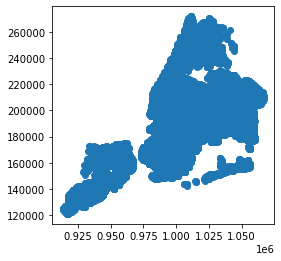

In [96]:
flooding_complaints_with_nta.plot()

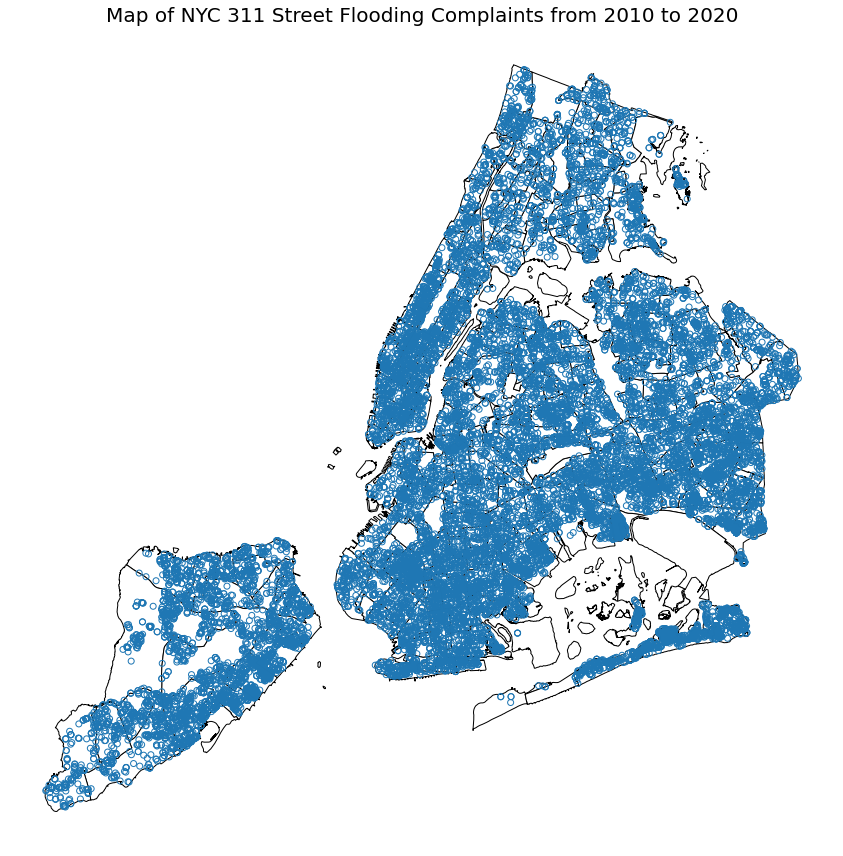

In [97]:
fig, ax = plt.subplots(figsize=(12,12))


nta_shape.plot(ax=ax, 
               color='white', 
               edgecolor='black', 
               zorder=0)

flooding_complaints_with_nta.plot(ax=ax, 
                                  color='None',
                                  edgecolor='#1f77b4')
ax.set_aspect('equal', 'box')
ax.set_title("Map of NYC 311 Street Flooding Complaints from 2010 to 2020", fontsize=20)
plt.axis('off')
plt.tight_layout()

In [98]:
flooding_complaints_with_nta = flooding_complaints_with_nta.groupby(by='ntaname')['unique_key'].count().reset_index()
flooding_complaints_with_nta.rename(columns={"unique_key": "count"}, 
                                    inplace=True)

flooding_complaints_with_nta.sort_values(by='count', 
                                         ascending=False).head()

,ntaname,count
116,New Dorp-Midland Beach,763
80,Hammels-Arverne-Edgemere,697
97,Lindenwood-Howard Beach,606
157,St. Albans,581
61,Far Rockaway-Bayswater,540


In [99]:
flooding_complaints_with_nta['count'].sum()

26959

In [100]:
flooding_complaints_with_nta = nta_shape.merge(flooding_complaints_with_nta, 
                                               left_on='ntaname', 
                                               right_on='ntaname')

In [101]:
flooding_complaints_with_nta.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,count
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",537
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.497 221913.624, 103936...",170
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.281 217531.059, 102305...",43
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.351 171942.592, 998339....",80
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.738 201007.310, 105192...",127


In [102]:
flooding_complaints_with_nta['count'].sum()

26959

In [103]:
flooding_complaints_with_nta[['ntaname', 'count']].sort_values(by='count', 
                                                               ascending=False).head()

,ntaname,count
94,New Dorp-Midland Beach,763
130,Hammels-Arverne-Edgemere,697
160,Lindenwood-Howard Beach,606
9,St. Albans,581
133,Far Rockaway-Bayswater,540


In [104]:
flooding_complaints_with_nta[['ntaname', 'count']].sort_values(by='count', 
                                                               ascending=True).head()

,ntaname,count
193,park-cemetery-etc-Staten Island,5
177,Airport,6
34,Parkchester,6
119,Kingsbridge Heights,8
86,Fordham South,8


In [105]:
flooding_complaints_with_nta.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 194 entries, 0 to 193
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ntacode      194 non-null    object  
 1   shape_area   194 non-null    object  
 2   county_fips  194 non-null    object  
 3   ntaname      194 non-null    object  
 4   shape_leng   194 non-null    object  
 5   boro_name    194 non-null    object  
 6   boro_code    194 non-null    object  
 7   geometry     194 non-null    geometry
 8   count        194 non-null    int64   
dtypes: geometry(1), int64(1), object(7)
memory usage: 15.2+ KB


In [106]:
flooding_complaints_with_nta['shape_area'] = flooding_complaints_with_nta['shape_area'].astype(float)
flooding_complaints_with_nta['shape_leng'] = flooding_complaints_with_nta['shape_leng'].astype(float)
                                                                          
flooding_complaints_with_nta.info()                                                                          

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 194 entries, 0 to 193
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   ntacode      194 non-null    object  
 1   shape_area   194 non-null    float64 
 2   county_fips  194 non-null    object  
 3   ntaname      194 non-null    object  
 4   shape_leng   194 non-null    float64 
 5   boro_name    194 non-null    object  
 6   boro_code    194 non-null    object  
 7   geometry     194 non-null    geometry
 8   count        194 non-null    int64   
dtypes: float64(2), geometry(1), int64(1), object(5)
memory usage: 15.2+ KB


In [107]:
flooding_complaints_with_nta['count_sq_mi'] = (flooding_complaints_with_nta['count'] / 
                                              ((flooding_complaints_with_nta['shape_area'] / 27878400)))

flooding_complaints_with_nta.head() 

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,count,count_sq_mi
0,BK88,54005019.05,047,Borough Park,39247.23,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",537,277.21
1,QN51,52488277.59,081,Murray Hill,33266.90,Queens,4,"MULTIPOLYGON (((1038593.497 221913.624, 103936...",170,90.29
2,QN27,19726845.59,081,East Elmhurst,19816.71,Queens,4,"MULTIPOLYGON (((1022728.281 217531.059, 102305...",43,60.77
3,BK95,14522603.59,047,Erasmus,18756.70,Brooklyn,3,"MULTIPOLYGON (((998608.351 171942.592, 998339....",80,153.57
4,QN07,22887772.81,081,Hollis,20976.34,Queens,4,"MULTIPOLYGON (((1051539.738 201007.310, 105192...",127,154.69


In [108]:
flooding_complaints_with_nta[['count', 'count_sq_mi']].describe()

,count,count_sq_mi
count,194.00,194.00
mean,138.96,98.76
std,135.47,61.71
min,5.00,0.73
25%,52.25,59.05
50%,92.50,84.14
75%,168.75,130.43
max,763.00,383.75


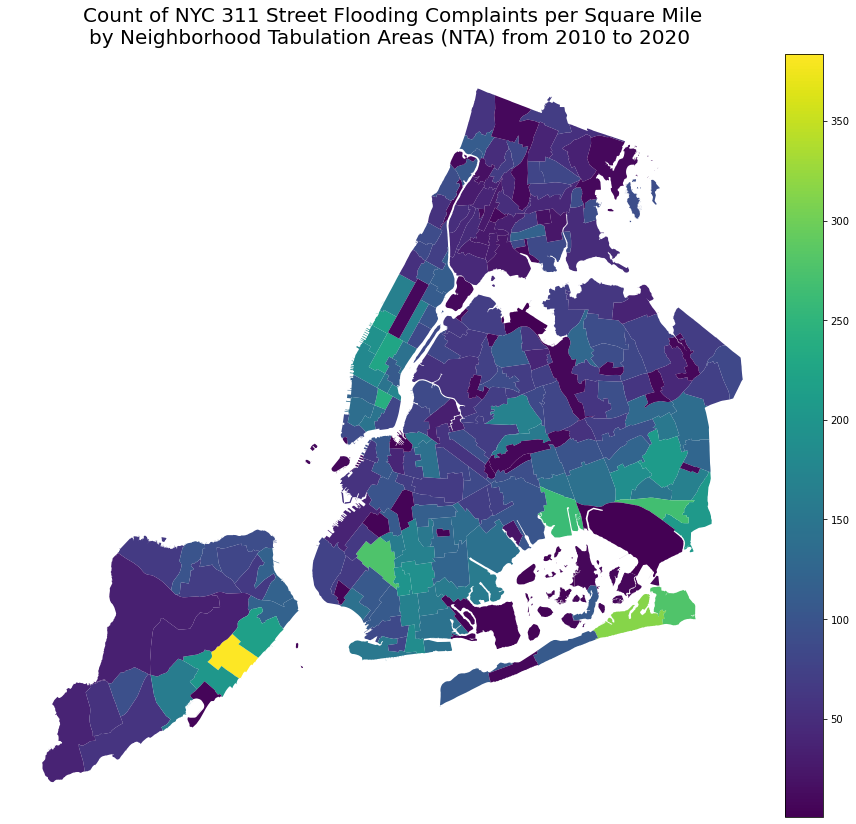

In [109]:
fig, ax = plt.subplots(figsize=(12,12))

comma_fmt = FuncFormatter(lambda x, p: format(int(x), ','))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

flooding_complaints_with_nta.plot(column='count_sq_mi', 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True,
                                  cax=cax,
                                  legend_kwds={'format':comma_fmt})

ax.set_title('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) from 2010 to 2020 ', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

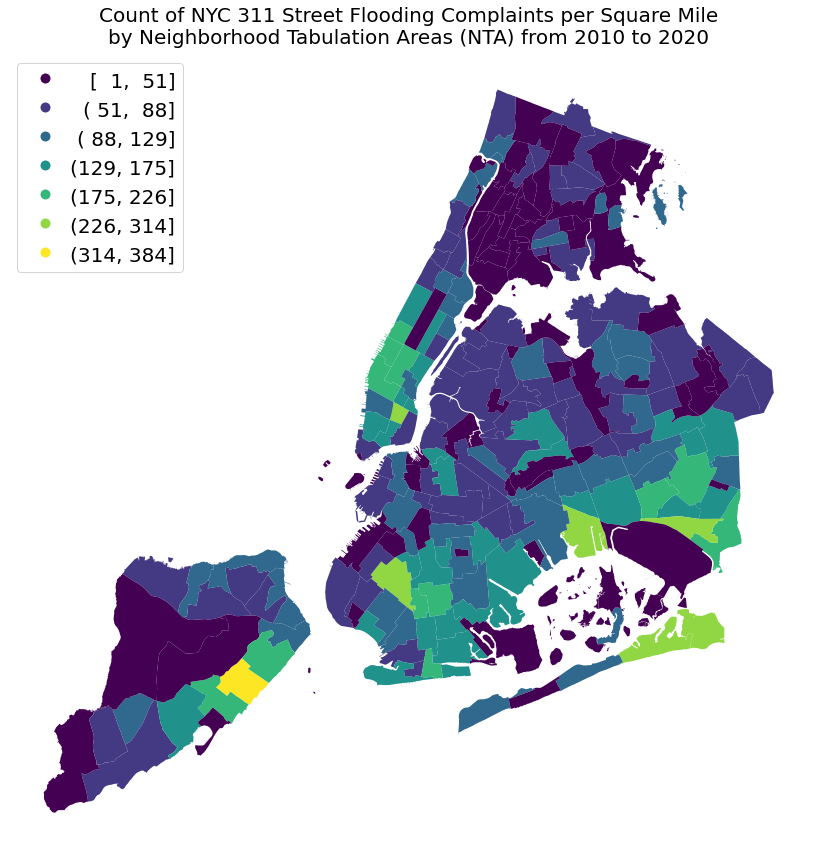

In [110]:
fig, ax = plt.subplots(figsize=(12,12))

flooding_complaints_with_nta.plot(column='count_sq_mi', 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.0f}",
                                              'fontsize': "20"})
leg = ax.get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(150) 
        row.mode= "expand"
        row.align="right" 

ax.set_title('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) from 2010 to 2020', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

In [111]:
flooding_complaints_with_nta.to_csv('data-output/count-complaints-by-nta.csv', index=False)

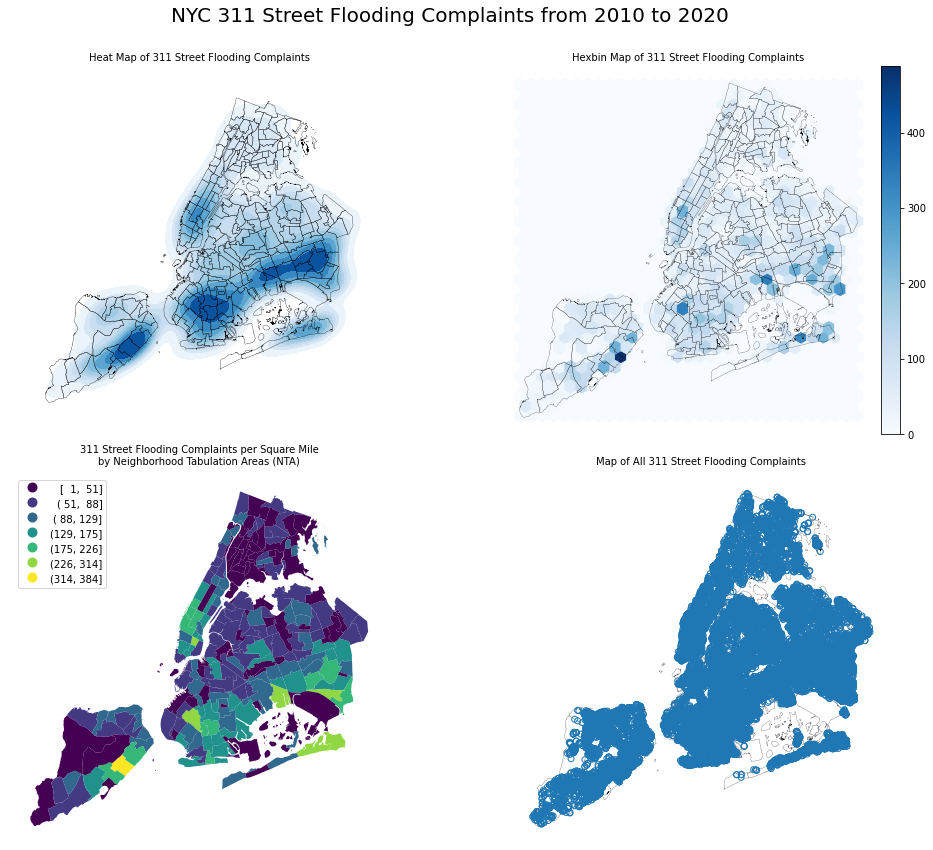

In [112]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))


# First Plot
sns.kdeplot(data=gdf,
            x='x_coordinate_state_plane',
            y='y_coordinate_state_plane',
            fill=True,
            cmap='Blues',
            ax=axs[0,0])

nta_shape.plot(ax=axs[0,0], 
               color='None', 
               edgecolor='black', 
               zorder=1,
               linewidth=.3)

axs[0,0].set_title("Heat Map of 311 Street Flooding Complaints", 
             fontsize=10)
axs[0,0].set_aspect('equal', 'box')
axs[0,0].axis('off')


# Second Plot
hb = axs[0,1].hexbin(flooding_311['x_coordinate_state_plane'], 
                               flooding_311['y_coordinate_state_plane'], 
                               gridsize=30, 
                               cmap='Blues')

divider = make_axes_locatable(axs[0,1])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape.to_crs(2263).plot(facecolor="none", 
                            edgecolor="black", 
                            linewidth=.2,
                            ax=axs[0,1])

axs[0,1].set_title("Hexbin Map of 311 Street Flooding Complaints", 
             fontsize=10)
axs[0,1].set_aspect('equal', 'box')
axs[0,1].axis('off')


# Third Plot
flooding_complaints_with_nta.plot(column='count_sq_mi', 
                                  cmap='viridis',
                                  ax=axs[1,0], 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.0f}",
                                              'fontsize': "10"})
leg = axs[1,0].get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(80)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

axs[1,0].set_title('311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA)', 
             fontsize=10, 
             pad=10)

axs[1,0].set_aspect('equal', 'box')
axs[1,0].axis('off')


# Fourth Plot
nta_shape.plot(ax=axs[1,1], 
               color='white', 
               edgecolor='black', 
               linewidth=.2,
               zorder=0)

gdf.plot(ax=axs[1,1], 
         color='None', 
         edgecolor='#1f77b4')

axs[1,1].set_title("Map of All 311 Street Flooding Complaints", 
                   fontsize=10, 
                   pad=10)
axs[1,1].set_aspect('equal', 'box')
axs[1,1].axis('off')

# Figure Details
fig.suptitle('NYC 311 Street Flooding Complaints from 2010 to 2020\n', fontsize=20) 

plt.tight_layout()
plt.savefig('figures/sample.png')

In [113]:
year_nta = gpd.sjoin(gdf, 
                     nta_shape, 
                     how="inner", 
                     op='within')

In [114]:
len(gdf)

26962

In [115]:
len(year_nta)

26959

In [116]:
year_nta.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020,POINT (952928.000 168312.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
66,45188341,2019-12-18 08:20:00,2019-12-20T09:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,BROADWAY,DELAFIELD AVENUE,...,2019,POINT (951912.000 169099.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
83,46379956,2020-06-04 07:24:00,2020-06-04T14:40:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020,POINT (954593.000 169517.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
185,46122447,2020-05-03 13:25:00,2020-05-03T14:20:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020,POINT (954095.000 168394.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
537,24452089,2012-11-21 09:58:00,2012-11-22T09:30:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2012,POINT (952928.000 168312.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5


In [117]:
year_nta = year_nta.groupby(by=['year', 
                                'ntaname'])['unique_key'].count().reset_index()

year_nta.rename(columns={"unique_key": "count"}, 
                inplace=True)

year_nta = nta_shape.merge(year_nta, 
                           left_on='ntaname', 
                           right_on='ntaname')

year_nta['count_sq_mi'] = (year_nta['count'] / (year_nta['shape_area'].astype(float) / 27878400))

year_nta.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,year,count,count_sq_mi
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",2010,45,23.23
1,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",2011,44,22.71
2,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",2012,34,17.55
3,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",2013,18,9.29
4,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",2014,47,24.26


In [118]:
years = list(year_nta.year.unique())

In [119]:
print(type(years))
print(years)

<class 'list'>
[2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]


Indexing for year 2012 (2nd position starting at 0) in our list. Here, I index for 2012


Text(0.5, 1.0, '2012')

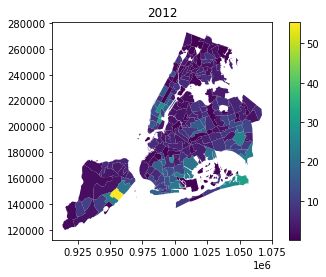

In [120]:
print('Indexing for year 2012 (2nd position starting at 0) in our list. Here, I index for', years[2])

year_nta[year_nta['year'] == years[2]].plot(column='count_sq_mi', 
                                            cmap='viridis',
                                            legend=True)
plt.title(years[2])

In [121]:
year_nta.to_csv('data-output/count-complaints-by-year-nta.csv', index=False)

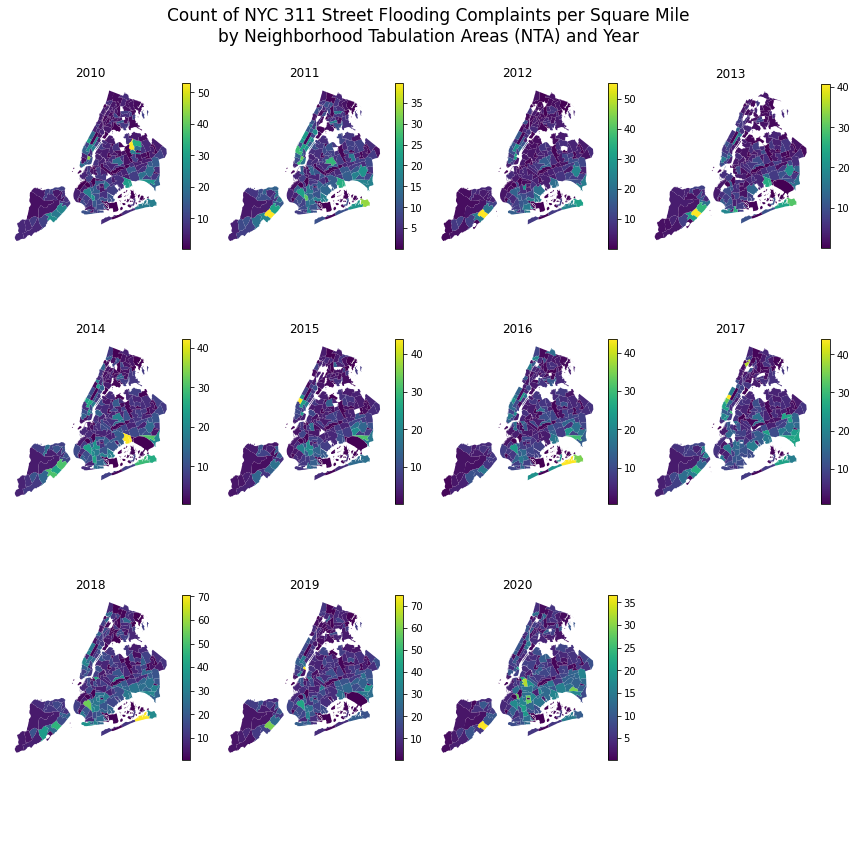

In [122]:
indx = 0

fig, axes = plt.subplots(3, 4, figsize=(12, 12))

for ax in axes.flat:
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    
    year_nta[year_nta['year'] == years[indx]].plot(column='count_sq_mi', 
                                                   cmap='viridis',
                                                   legend=True,
                                                   ax=ax, 
                                                   cax=cax)

    ax.set_title(str(years[indx]), fontsize=12)
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    plt.tight_layout()
    
    indx += 1
    if indx == 11:
        break

    axes[2,3].set_axis_off()
    
# Figure Details
fig.suptitle('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) and Year', fontsize=17) 
plt.savefig('figures/example.png')    

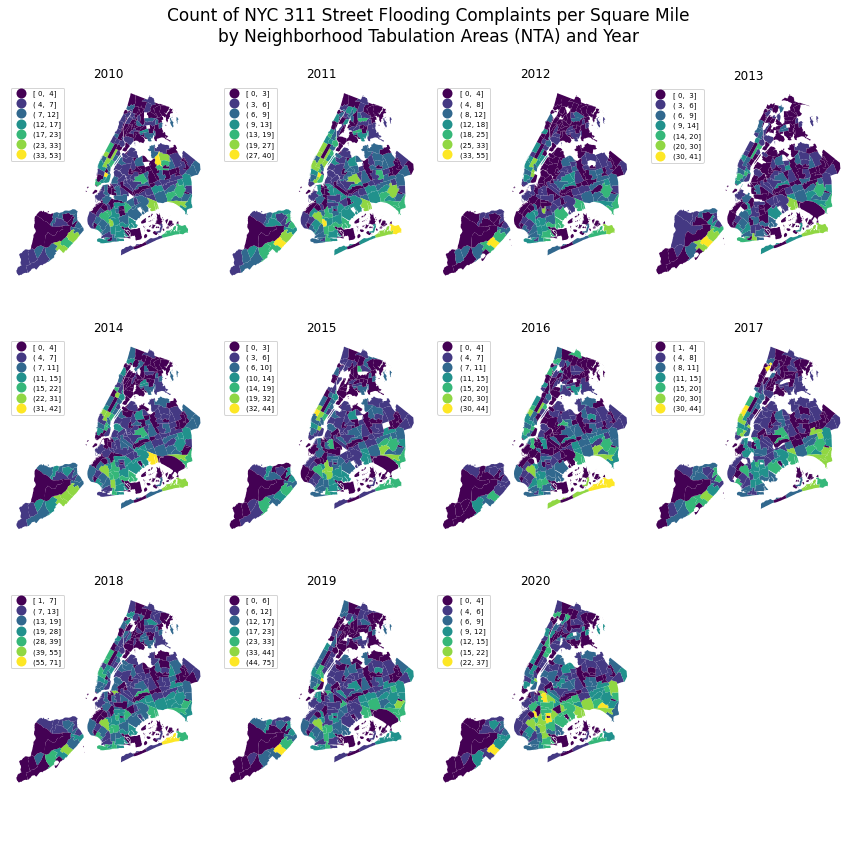

In [123]:
indx = 0

fig, axes = plt.subplots(3, 4, figsize=(12, 12))

for ax in axes.flat:
    year_nta[year_nta['year'] == years[indx]].plot(column='count_sq_mi', 
                                              cmap='viridis',
                                              legend=True, 
                                              figsize=(6,6),
                                              scheme='fisher_jenks',
                                              k=7,
                                              legend_kwds={'loc': "upper left", 
                                                           'fmt': "{:,.0f}",
                                                           'fontsize': "7"},
                                              ax=ax)

    
    ax.set_title(str(years[indx]), fontsize=12)
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    plt.tight_layout()
    
    indx += 1
    if indx == 11:
        break

    axes[2,3].set_axis_off()   

# Figure Details
fig.suptitle('Count of NYC 311 Street Flooding Complaints per Square Mile\nby Neighborhood Tabulation Areas (NTA) and Year', fontsize=17)
fig.subplots_adjust(top=0.95)
plt.savefig('figures/example.png', dpi=150) 

Text(0.5, 0.98, 'Hexbin Map of NYC 311 Street Flooding Complaints by Year')

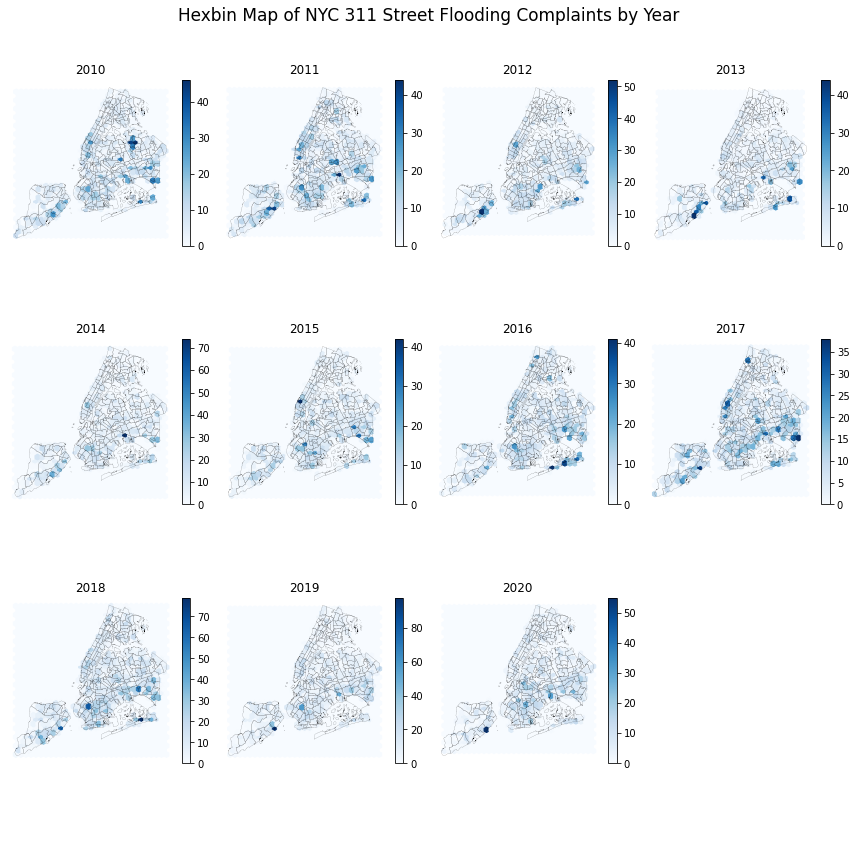

In [124]:
indx = 0

fig, axes = plt.subplots(3, 4, figsize=(12, 12))

for ax in axes.flat:
    
    df = flooding_311[flooding_311['year'] == years[indx]]

    hb = ax.hexbin(df.x_coordinate_state_plane, 
                   df.y_coordinate_state_plane, 
                   gridsize=30, 
                   cmap='Blues')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    plt.colorbar(hb, cax=cax)

    nta_shape.to_crs(2263).plot(facecolor="none", 
                                edgecolor="black", 
                                ax=ax,
                                zorder=1,
                                linewidth=.1)

    
    ax.set_title(str(years[indx]), fontsize=12)
    ax.set_aspect('equal', 'box')
    ax.axis('off')
    plt.tight_layout()
    
    indx += 1
    if indx == 11:
        break

    axes[2,3].set_axis_off()   
    
# Figure Details
fig.suptitle('Hexbin Map of NYC 311 Street Flooding Complaints by Year', fontsize=17) 
# plt.savefig('figures/example.png')     

## 5.2 By Borough

In [125]:
flooding_311.borough.value_counts()

QUEENS           11043
BROOKLYN          7118
STATEN ISLAND     5025
MANHATTAN         2618
BRONX             2081
Unspecified         21
Name: borough, dtype: int64

In [126]:
nta_shape.boro_name.value_counts()

Queens           58
Brooklyn         51
Bronx            38
Manhattan        29
Staten Island    19
Name: boro_name, dtype: int64

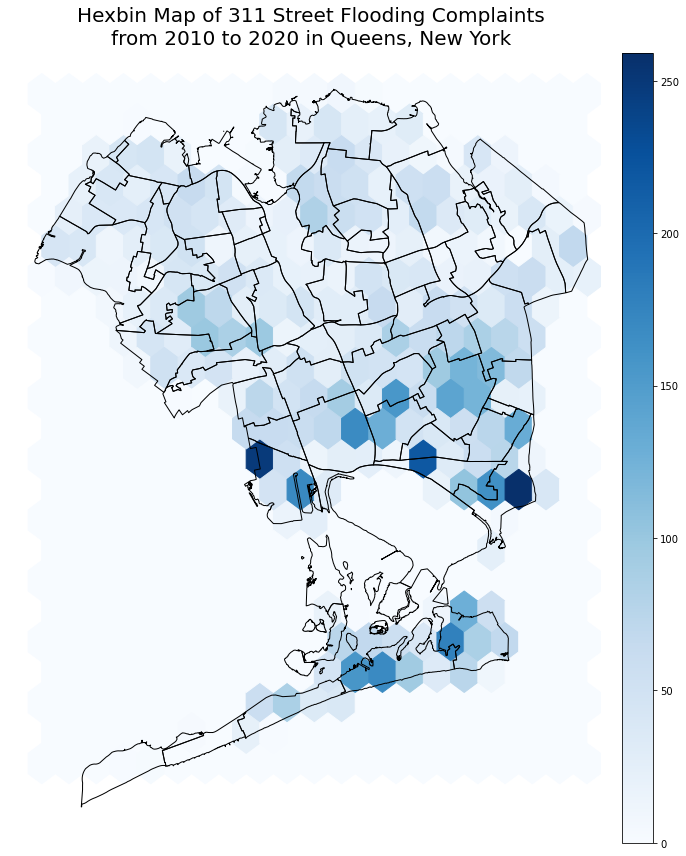

In [127]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'QUEENS']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'QUEENS']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Queens'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Queens, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

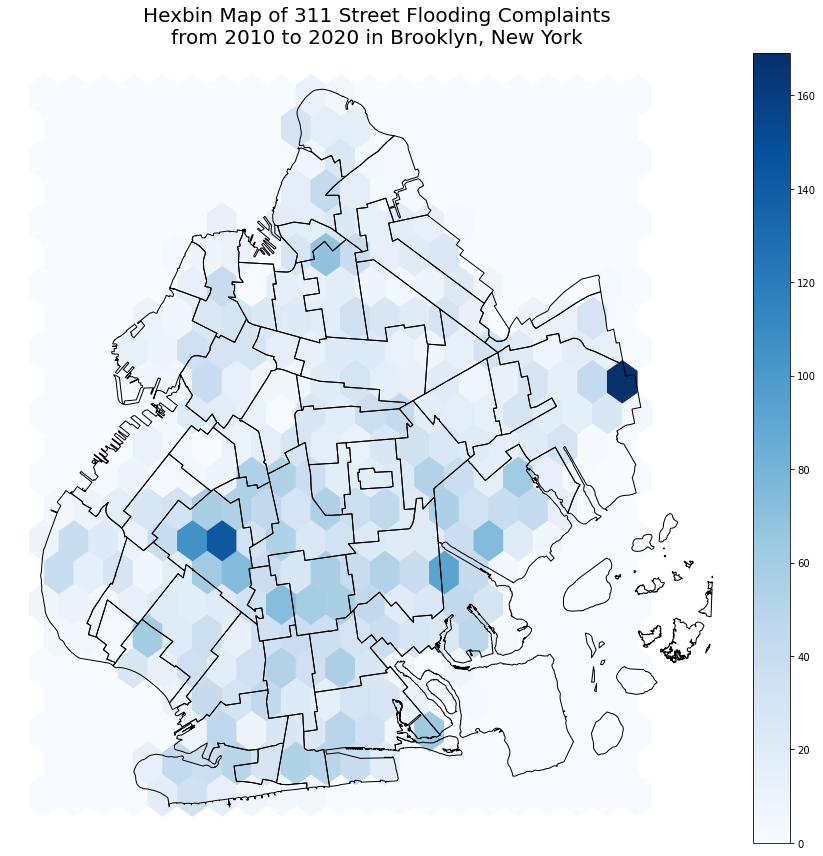

In [128]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'BROOKLYN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BROOKLYN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Brooklyn'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Brooklyn, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

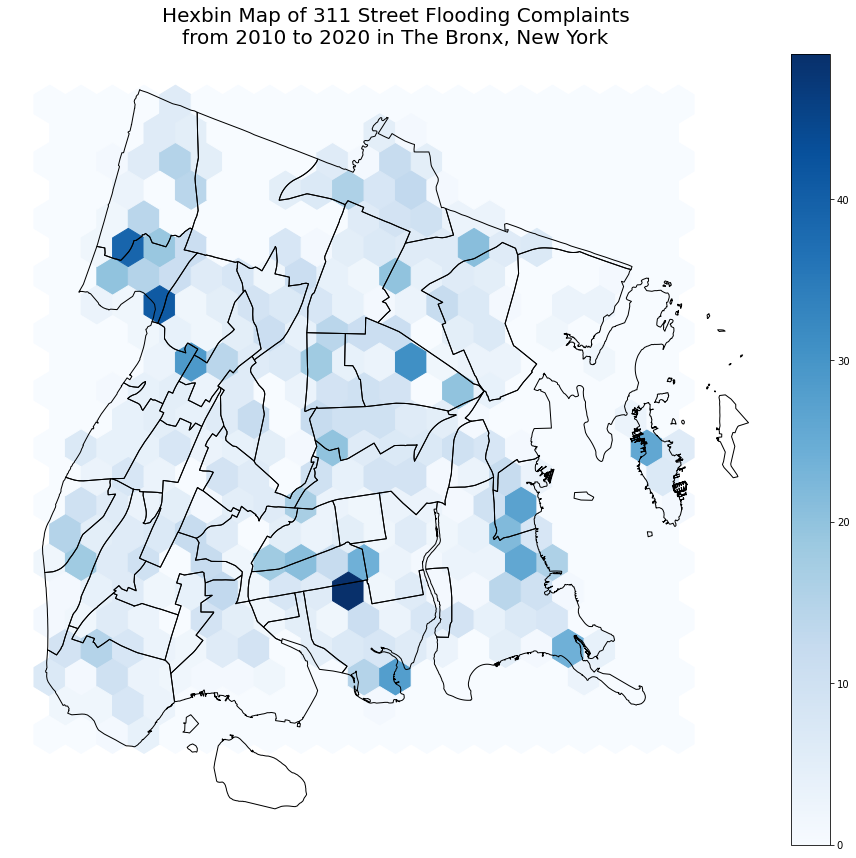

In [129]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'BRONX']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BRONX']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Bronx'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in The Bronx, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

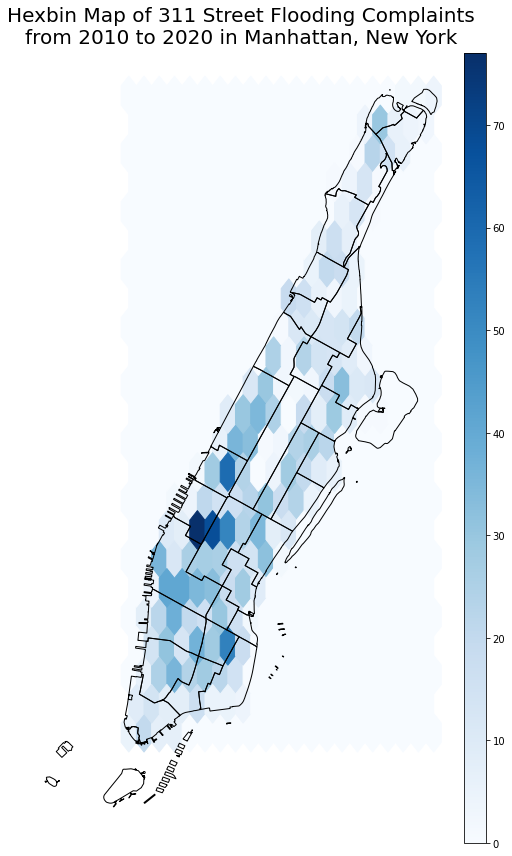

In [130]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'MANHATTAN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'MANHATTAN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Manhattan'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Manhattan, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

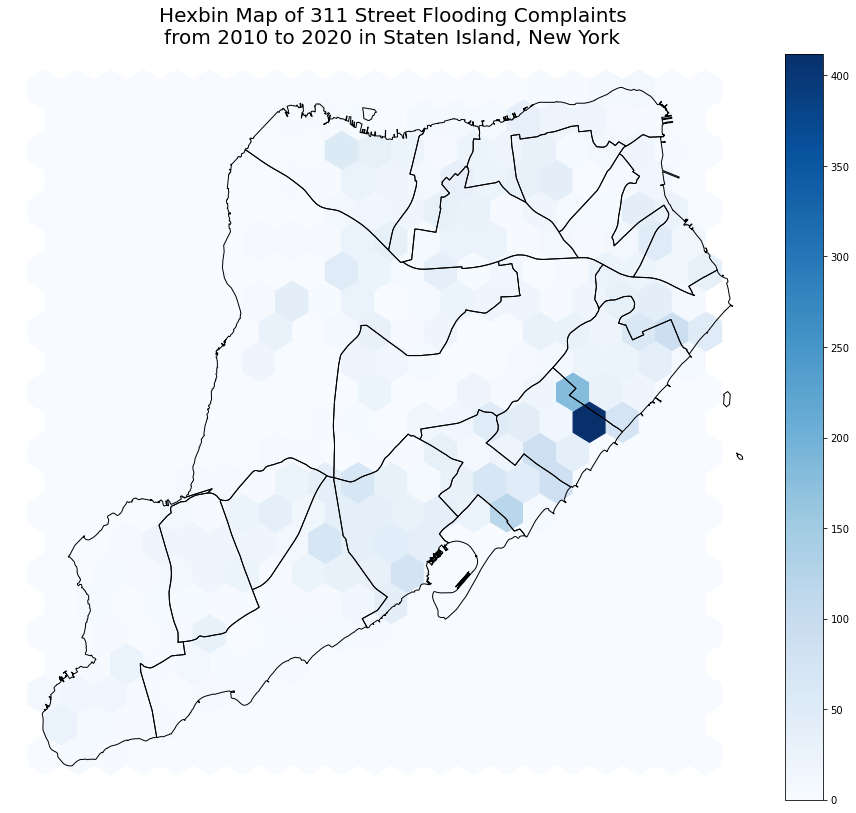

In [131]:
fig, ax = plt.subplots(figsize=(12, 12))

hb = ax.hexbin(flooding_311[flooding_311.borough == 'STATEN ISLAND']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'STATEN ISLAND']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Staten Island'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=ax)

ax.set_aspect('equal', 'box')
ax.axis('off')
ax.set_title('Hexbin Map of 311 Street Flooding Complaints\nfrom 2010 to 2020 in Staten Island, New York', 
             fontsize=20, 
             pad=10)
plt.tight_layout()

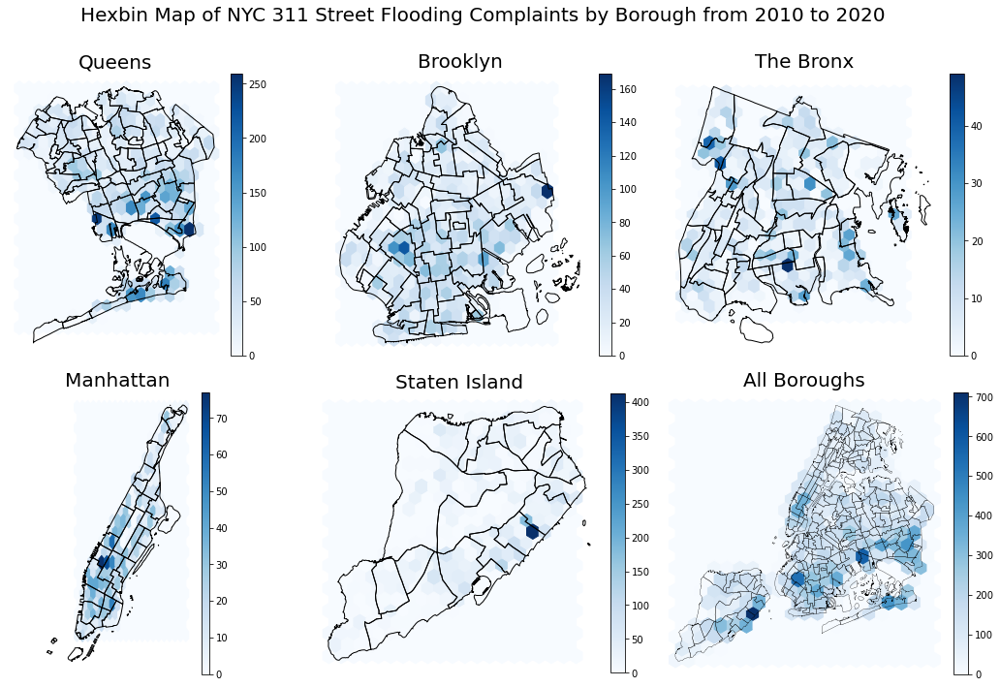

In [132]:
fig, axs = plt.subplots(2, 3, sharey=False, figsize=(15, 10))


# first plot
hb = axs[0,0].hexbin(flooding_311[flooding_311.borough == 'QUEENS']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'QUEENS']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[0,0])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Queens'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[0,0])

axs[0,0].set_aspect('equal', 'box')
axs[0,0].axis('off')
axs[0,0].set_title('Queens', fontsize=20)

# second plot
hb = axs[0,1].hexbin(flooding_311[flooding_311.borough == 'BROOKLYN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BROOKLYN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[0,1])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Brooklyn'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[0,1])

axs[0,1].set_aspect('equal', 'box')
axs[0,1].axis('off')
axs[0,1].set_title('Brooklyn', fontsize=20)

# third plot
hb = axs[0,2].hexbin(flooding_311[flooding_311.borough == 'BRONX']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'BRONX']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[0,2])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Bronx'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[0,2])

axs[0,2].set_aspect('equal', 'box')
axs[0,2].axis('off')
axs[0,2].set_title('The Bronx', fontsize=20)

# fourth plot
hb = axs[1,0].hexbin(flooding_311[flooding_311.borough == 'MANHATTAN']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'MANHATTAN']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[1,0])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Manhattan'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[1,0])

axs[1,0].set_aspect('equal', 'box')
axs[1,0].axis('off')
axs[1,0].set_title('Manhattan', fontsize=20)


# fifth plot
hb = axs[1,1].hexbin(flooding_311[flooding_311.borough == 'STATEN ISLAND']['x_coordinate_state_plane'], 
               flooding_311[flooding_311.borough == 'STATEN ISLAND']['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[1,1])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape[nta_shape.boro_name == 'Staten Island'].to_crs(2263).plot(facecolor="none", 
                                                             edgecolor="black", 
                                                             ax=axs[1,1])

axs[1,1].set_aspect('equal', 'box')
axs[1,1].axis('off')
axs[1,1].set_title('Staten Island', fontsize=20)



# sixth plot
hb = axs[1,2].hexbin(flooding_311['x_coordinate_state_plane'], 
               flooding_311['y_coordinate_state_plane'], 
               gridsize=20, 
               cmap='Blues')

divider = make_axes_locatable(axs[1,2])
cax = divider.append_axes("right", size="5%", pad=0.1)
plt.colorbar(hb, cax=cax)

nta_shape.to_crs(2263).plot(facecolor="none", 
                            edgecolor="black", 
                            linewidth=.3,
                            ax=axs[1,2])

axs[1,2].set_aspect('equal', 'box')
axs[1,2].axis('off')
axs[1,2].set_title('All Boroughs', fontsize=20)

# Figure Details
fig.suptitle("Hexbin Map of NYC 311 Street Flooding Complaints by Borough from 2010 to 2020\n", fontsize=20)
plt.tight_layout()
plt.savefig('figures/boroughs.png')

## 5.3 Bar Charts by Neighborhood Tabulation Areas (NTA)

In [133]:
flooding_complaints_with_nta.sort_values(by='count_sq_mi', ascending=False).head(10)

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,count,count_sq_mi
94,SI45,55429451.22,085,New Dorp-Midland Beach,34336.52,Staten Island,5,"MULTIPOLYGON (((960721.678 147492.705, 960370....",763,383.75
130,QN12,61895482.14,081,Hammels-Arverne-Edgemere,83797.48,Queens,4,"MULTIPOLYGON (((1048650.179 157173.329, 104869...",697,313.94
133,QN15,54159776.79,081,Far Rockaway-Bayswater,48674.16,Queens,4,"MULTIPOLYGON (((1049860.888 154842.594, 104983...",540,277.96
0,BK88,54005019.05,047,Borough Park,39247.23,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",537,277.21
176,QN03,43288698.09,081,Springfield Gardens South-Brookville,45322.17,Queens,4,"MULTIPOLYGON (((1051488.015 182175.831, 105150...",415,267.26
160,QN57,64560809.01,081,Lindenwood-Howard Beach,79085.71,Queens,4,"MULTIPOLYGON (((1023868.796 176222.945, 102336...",606,261.68
70,MN22,10894242.60,061,East Village,13555.23,Manhattan,1,"MULTIPOLYGON (((989084.477 205727.827, 989108....",94,240.55
58,MN17,30191534.33,061,Midtown-Midtown South,27032.70,Manhattan,1,"MULTIPOLYGON (((991725.183 217725.502, 992169....",245,226.23
192,SI36,67011968.25,085,Old Town-Dongan Hills-South Beach,41973.14,Staten Island,5,"MULTIPOLYGON (((966187.529 153868.497, 966187....",523,217.58
57,MN14,15805586.31,061,Lincoln Square,19869.91,Manhattan,1,"MULTIPOLYGON (((991173.587 222552.343, 991046....",123,216.95


In [134]:
flooding_complaints_with_nta['nta_borough'] = flooding_complaints_with_nta['ntaname'] + ' - ' + flooding_complaints_with_nta['boro_name']

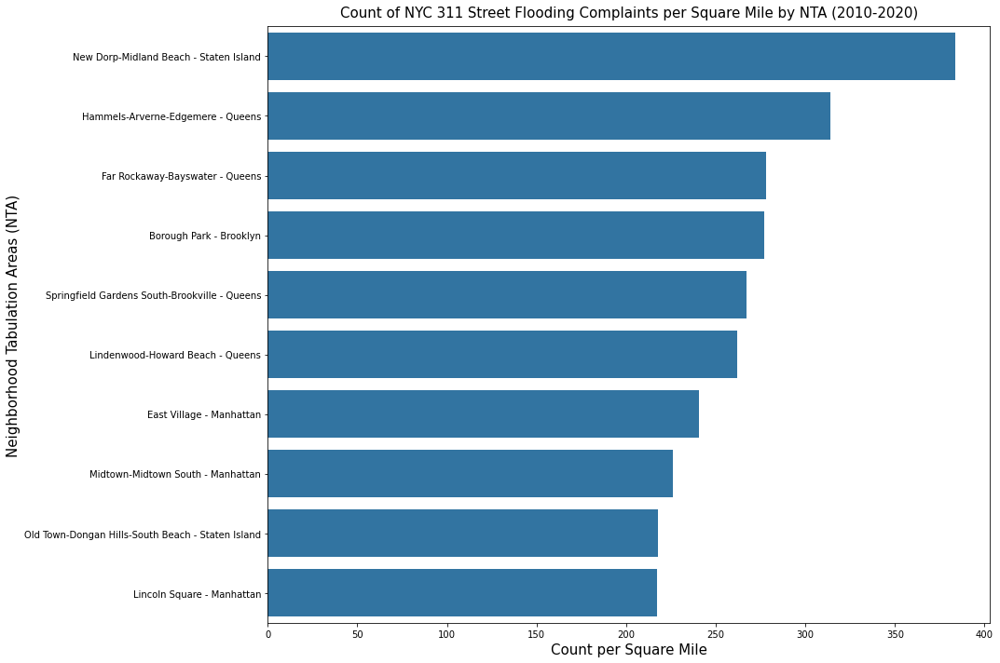

In [135]:
plt.figure(figsize=(15,10))

sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count_sq_mi', ascending=False).head(10),
            y='nta_borough',
            x='count_sq_mi',
            color='#1f77b4')

plt.title('Count of NYC 311 Street Flooding Complaints per Square Mile by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
plt.xlabel('Count per Square Mile', fontsize=15)
plt.ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=15)
plt.tight_layout()

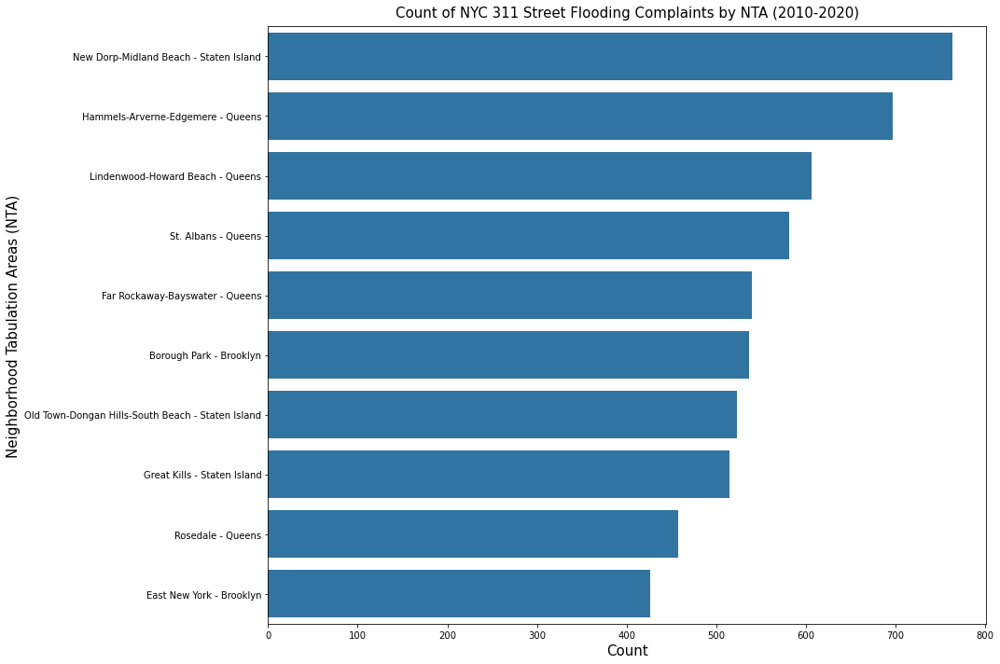

In [136]:
plt.figure(figsize=(15,10))

sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count', ascending=False).head(10),
            y='nta_borough',
            x='count',
            color='#1f77b4')

plt.title('Count of NYC 311 Street Flooding Complaints by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
plt.xlabel('Count', fontsize=15)
plt.ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=15)
plt.tight_layout()

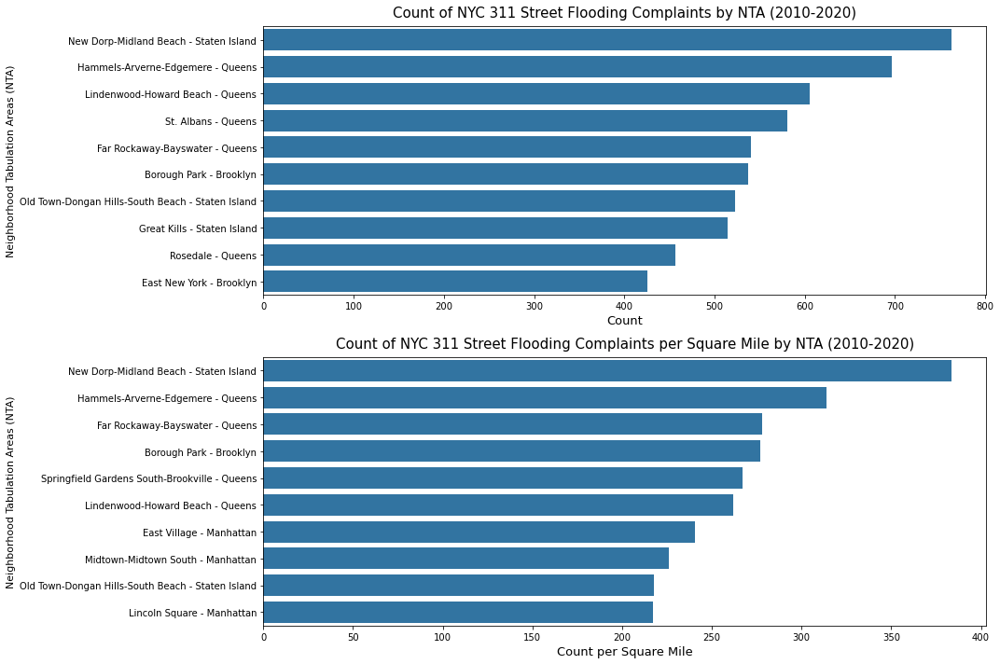

In [137]:
fig, axs = plt.subplots(2, 1, sharey=False, figsize=(15, 10))

# first plot
sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count', ascending=False).head(10),
            y='nta_borough',
            x='count',
            color='#1f77b4',
            ax=axs[0])

axs[0].set_title('Count of NYC 311 Street Flooding Complaints by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
axs[0].set_xlabel('Count', fontsize=13)
axs[0].set_ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=11)

# second plot
sns.barplot(data=flooding_complaints_with_nta.sort_values(by='count_sq_mi', ascending=False).head(10),
            y='nta_borough',
            x='count_sq_mi',
            color='#1f77b4',
            ax=axs[1])

axs[1].set_title('Count of NYC 311 Street Flooding Complaints per Square Mile by NTA (2010-2020)', 
          fontsize=15,
          pad=10)
axs[1].set_xlabel('Count per Square Mile', fontsize=13)
axs[1].set_ylabel('Neighborhood Tabulation Areas (NTA)', fontsize=11)

plt.tight_layout()

# 6. Time Series Analysis

In [138]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27906 entries, 0 to 27905
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      27906 non-null  int64         
 1   created_date                    27906 non-null  datetime64[ns]
 2   closed_date                     27895 non-null  object        
 3   agency                          27906 non-null  object        
 4   agency_name                     27906 non-null  object        
 5   complaint_type                  27906 non-null  object        
 6   descriptor                      27906 non-null  object        
 7   incident_zip                    27048 non-null  float64       
 8   intersection_street_1           10098 non-null  object        
 9   intersection_street_2           10098 non-null  object        
 10  address_type                    27900 non-null  object        
 11  ci

In [139]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,STATEN ISLAND,40.63,-74.11,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,BROOKLYN,40.68,-73.90,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,QUEENS,40.74,-73.70,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,BROOKLYN,40.63,-73.90,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,BROOKLYN,40.67,-73.86,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020


## 6.1 By Year and Borough

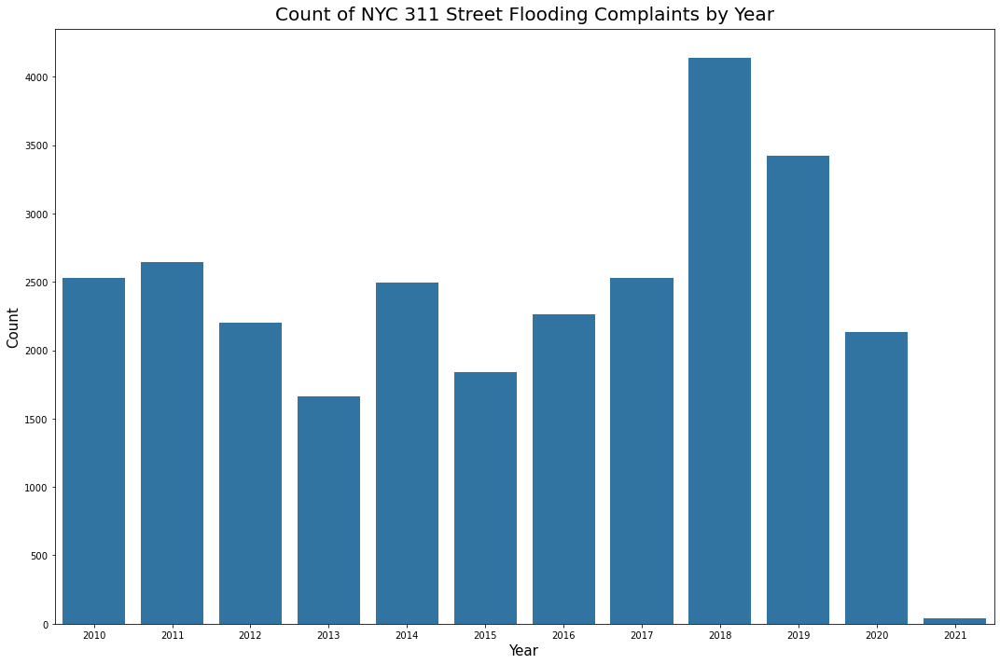

In [140]:
plt.figure(figsize=(15,10))

sns.countplot(x=flooding_311['year'],
              color='#1f77b4')

plt.title('Count of NYC 311 Street Flooding Complaints by Year', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [141]:
flooding_311.borough.value_counts()

QUEENS           11043
BROOKLYN          7118
STATEN ISLAND     5025
MANHATTAN         2618
BRONX             2081
Unspecified         21
Name: borough, dtype: int64

In [142]:
flooding_311.loc[flooding_311.borough != 'Unspecified'].borough.value_counts()

QUEENS           11043
BROOKLYN          7118
STATEN ISLAND     5025
MANHATTAN         2618
BRONX             2081
Name: borough, dtype: int64

In [143]:
flooding_311 = flooding_311.loc[flooding_311.borough != 'Unspecified']

flooding_311.borough.value_counts()

QUEENS           11043
BROOKLYN          7118
STATEN ISLAND     5025
MANHATTAN         2618
BRONX             2081
Name: borough, dtype: int64

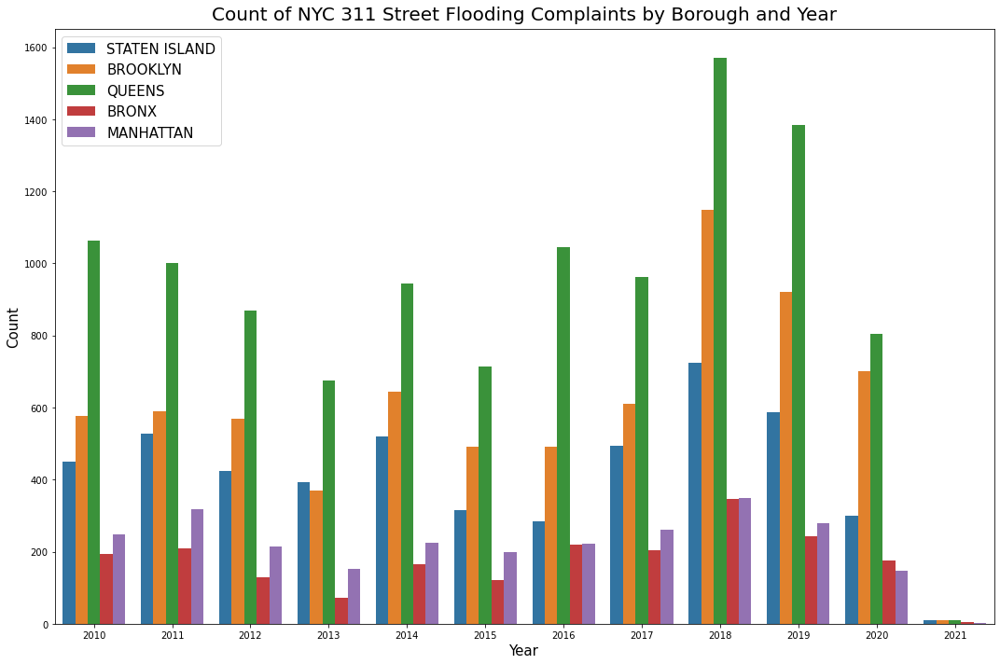

In [144]:
plt.figure(figsize=(15,10))

sns.countplot(x="year", 
              data=flooding_311,
              hue='borough')


plt.title('Count of NYC 311 Street Flooding Complaints by Borough and Year', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

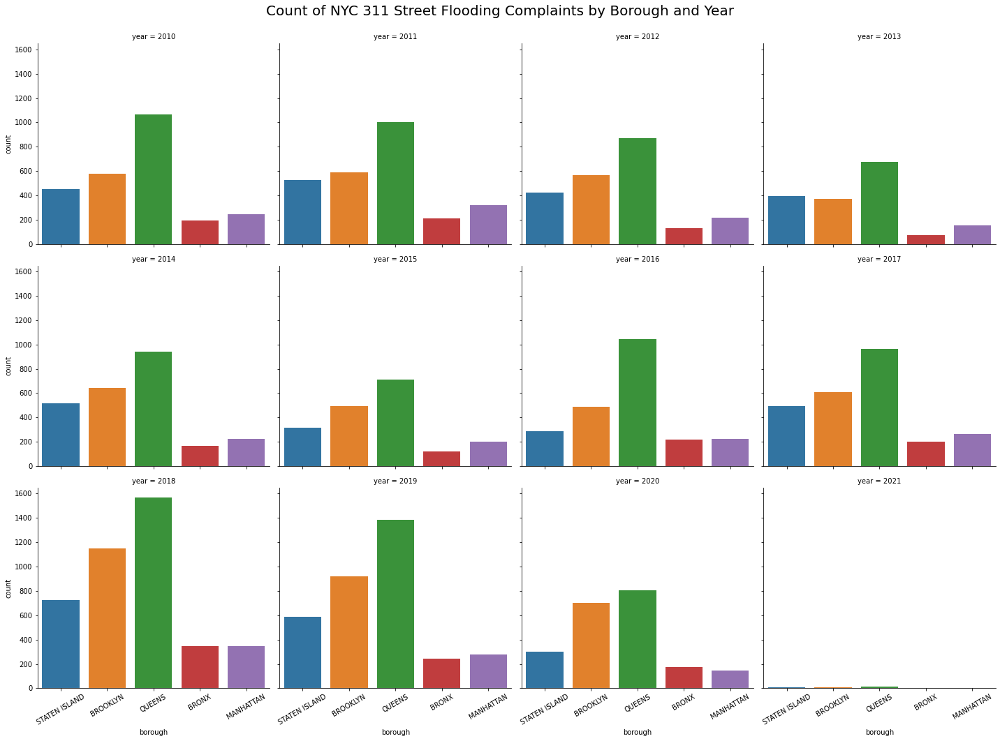

In [145]:
g = sns.catplot(x="borough",
                col="year",
                data=flooding_311,
                kind='count',
                col_wrap=4)

g.set_xticklabels(rotation=30)

plt.suptitle('Count of NYC 311 Street Flooding Complaints by Borough and Year\n', 
          fontsize=20)
plt.subplots_adjust(top=0.9)
plt.tight_layout()

In [146]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,park_borough,latitude,longitude,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,STATEN ISLAND,40.63,-74.11,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,BROOKLYN,40.68,-73.90,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,QUEENS,40.74,-73.70,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,BROOKLYN,40.63,-73.90,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,BROOKLYN,40.67,-73.86,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020


In [147]:
stacked_bar = pd.pivot_table(flooding_311, 
                             values='unique_key', 
                             index=['year'], 
                             columns = ['borough'], 
                             aggfunc=pd.Series.nunique)

stacked_bar.rename({'unique_key': 'count'}, 
                   axis=1, 
                   inplace=True)

stacked_bar.index = stacked_bar.index.astype('int64')

print(stacked_bar.index.dtype)

int64


In [148]:
stacked_bar.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,208,589,317,1000,527
2012,128,568,215,869,423
2013,72,370,152,676,394
2014,166,644,225,944,519


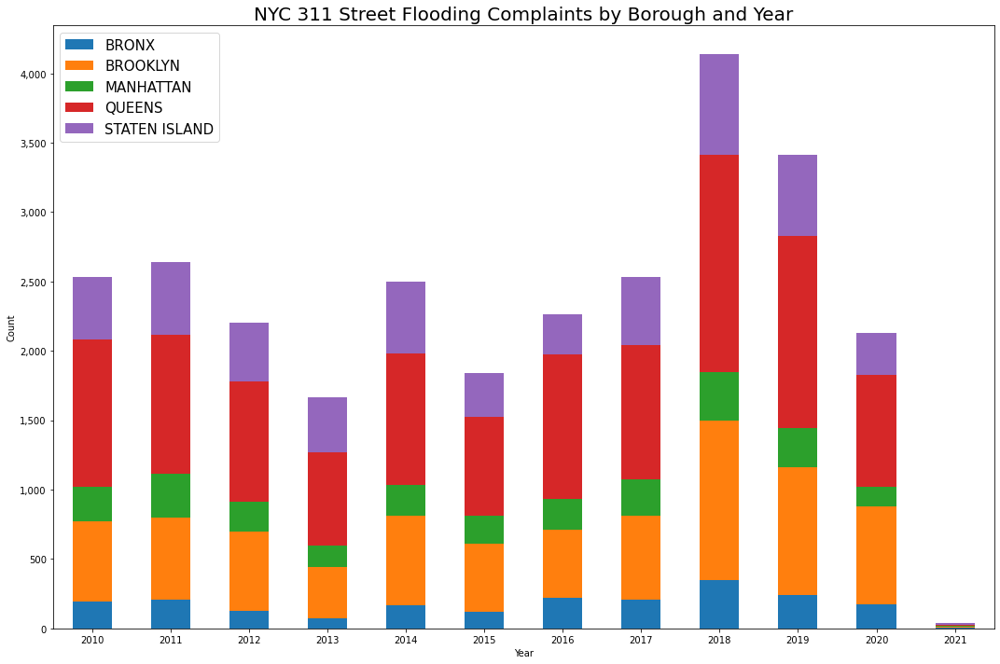

In [149]:
fig, ax = plt.subplots(figsize=(15,10))

stacked_bar.plot.bar(stacked=True, ax=ax)

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

plt.xticks(rotation=0)
plt.ylabel('Count')
plt.xlabel('Year')
plt.title('NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

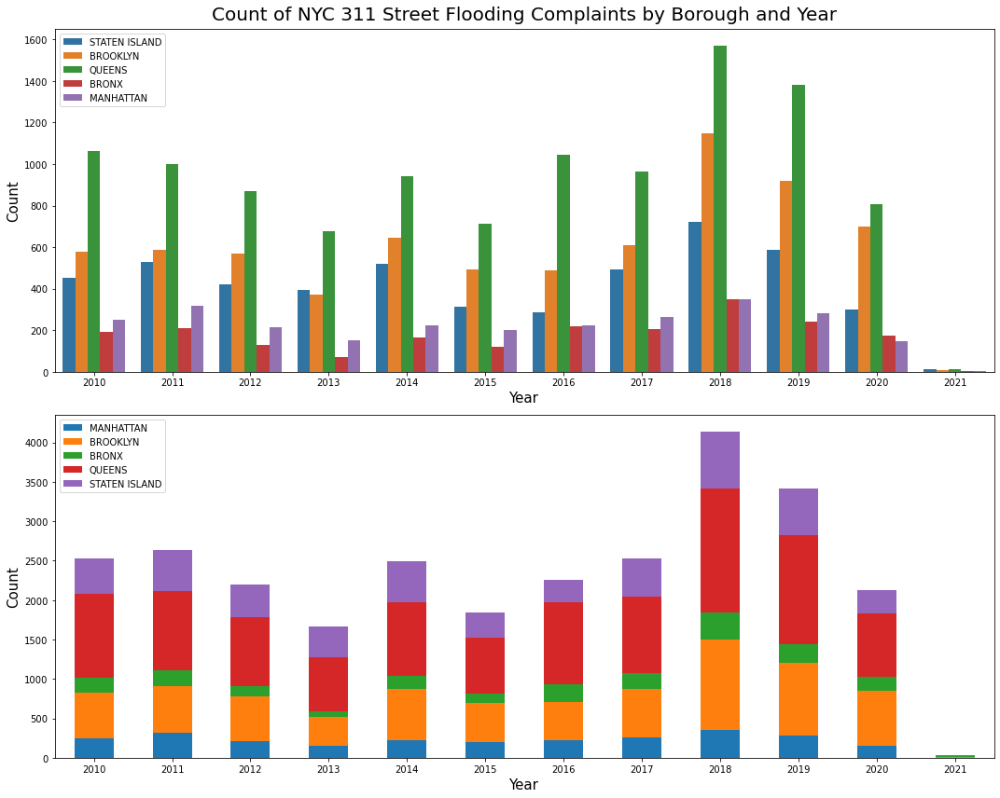

In [150]:
fig, axs = plt.subplots(2, 1, sharey=False, figsize=(15, 12))

sns.countplot(x="year", 
              data=flooding_311,
              hue='borough',
              ax=axs[0])


axs[0].set_title('Count of NYC 311 Street Flooding Complaints by Borough and Year', 
          fontsize=20,
          pad=10)
axs[0].set_ylabel('Count', fontsize=15)
axs[0].set_xlabel('Year', fontsize=15)
axs[0].legend(loc=2, fontsize=10)


stacked_bar = stacked_bar[['MANHATTAN', 'BROOKLYN', 'BRONX', 'QUEENS', 'STATEN ISLAND']]
stacked_bar.plot.bar(stacked=True, 
                     ax=axs[1])

# axs[1].set_title('CountNYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.xticks(rotation=0)
axs[1].set_ylabel('Count', fontsize=15)
axs[1].set_xlabel('Year', fontsize=15)
axs[1].legend(loc=2, fontsize=10)

plt.tight_layout()

In [151]:
pivot_table = pd.pivot_table(flooding_311, 
                             values='unique_key', 
                             index=['year'], 
                             columns = ['borough'], 
                             aggfunc=pd.Series.nunique)

pivot_table.rename({'unique_key': 'count'}, axis=1, inplace=True)
pivot_table.index = pivot_table.index.astype('int64')

print(pivot_table.index.dtype)

int64


In [152]:
pivot_table.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,208,589,317,1000,527
2012,128,568,215,869,423
2013,72,370,152,676,394
2014,166,644,225,944,519


In [153]:
pivot_table.columns

Index(['BRONX', 'BROOKLYN', 'MANHATTAN', 'QUEENS', 'STATEN ISLAND'], dtype='object', name='borough')

In [154]:
pivot_table = pivot_table[['BRONX', 'BROOKLYN', 'MANHATTAN', 'QUEENS', 'STATEN ISLAND']]

pivot_table.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,208,589,317,1000,527
2012,128,568,215,869,423
2013,72,370,152,676,394
2014,166,644,225,944,519


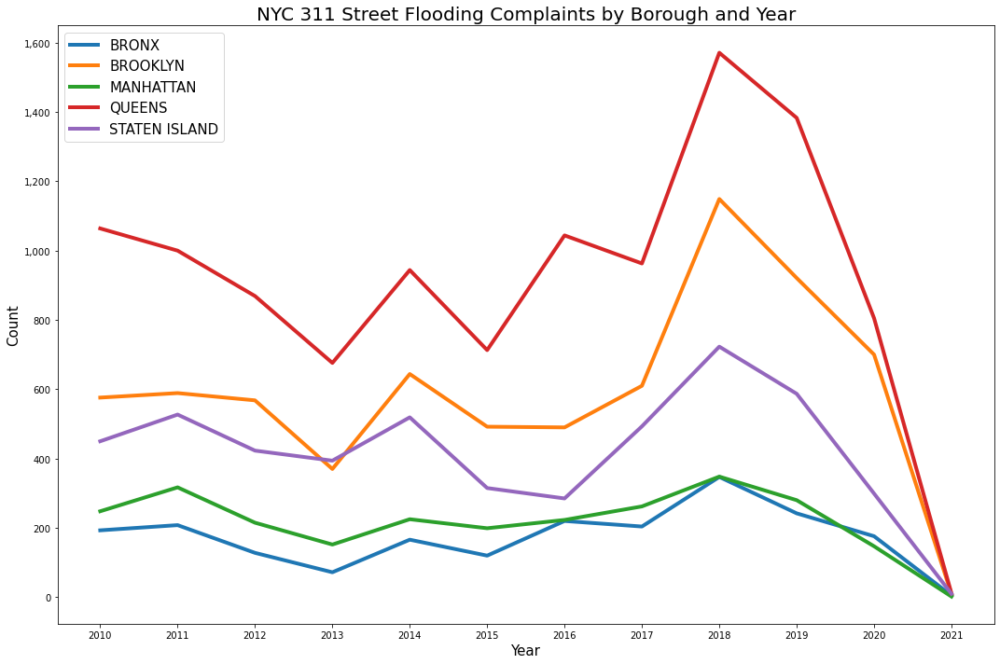

In [155]:
fig, ax = plt.subplots(figsize=(15,10))

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

pivot_table.plot.line(ax=ax, linewidth=4)

plt.xticks(rotation=0)
plt.ylabel('Count', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

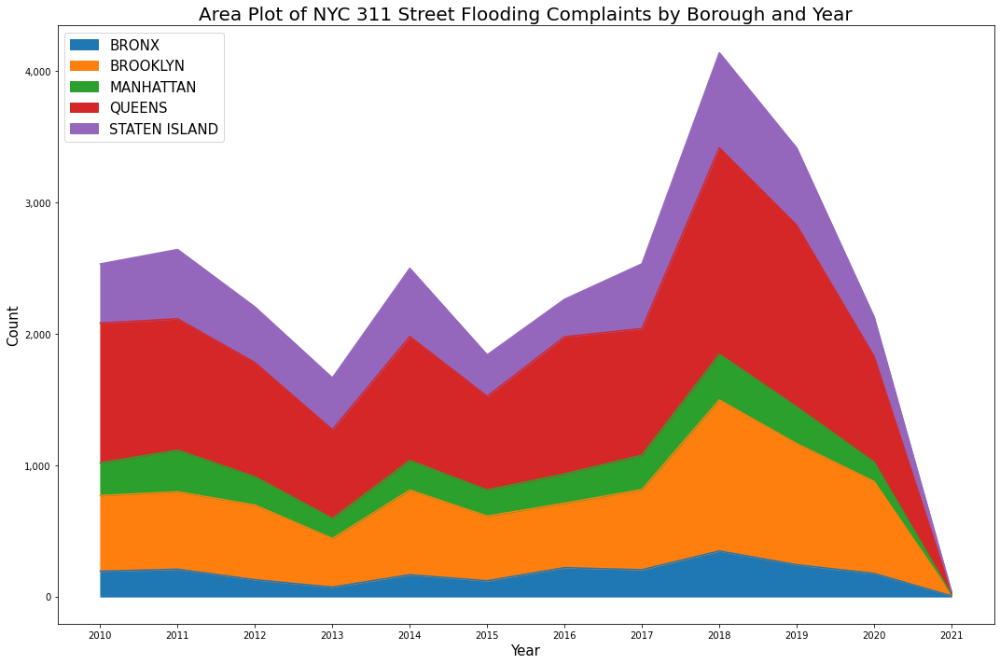

In [156]:
fig, ax = plt.subplots(figsize=(15,10))

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

pivot_table.plot.area(ax=ax)

plt.ylabel('Count', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('Area Plot of NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

In [157]:
pivot_table_cumsum = pivot_table.cumsum()
pivot_table_cumsum.head()

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,193,576,248,1064,450
2011,401,1165,565,2064,977
2012,529,1733,780,2933,1400
2013,601,2103,932,3609,1794
2014,767,2747,1157,4553,2313


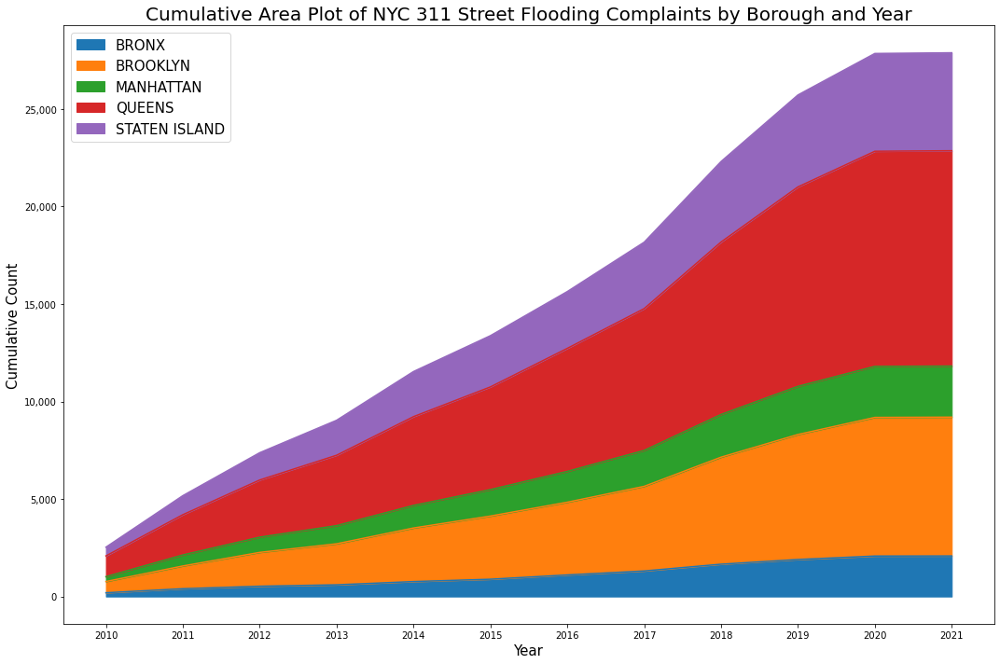

In [158]:
fig, ax = plt.subplots(figsize=(15,10))

ax.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

pivot_table_cumsum.plot.area(ax=ax)

plt.xticks(rotation=0)
plt.ylabel('Cumulative Count', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('Cumulative Area Plot of NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

In [159]:
data_perc = pivot_table.divide(pivot_table.sum(axis=0), axis=1)

data_perc.head(len(data_perc))

borough,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
year,,,,,
2010,0.09,0.08,0.09,0.10,0.09
2011,0.10,0.08,0.12,0.09,0.10
2012,0.06,0.08,0.08,0.08,0.08
2013,0.03,0.05,0.06,0.06,0.08
2014,0.08,0.09,0.09,0.09,0.10
2015,0.06,0.07,0.08,0.06,0.06
2016,0.11,0.07,0.09,0.09,0.06
2017,0.10,0.09,0.10,0.09,0.10
2018,0.17,0.16,0.13,0.14,0.14


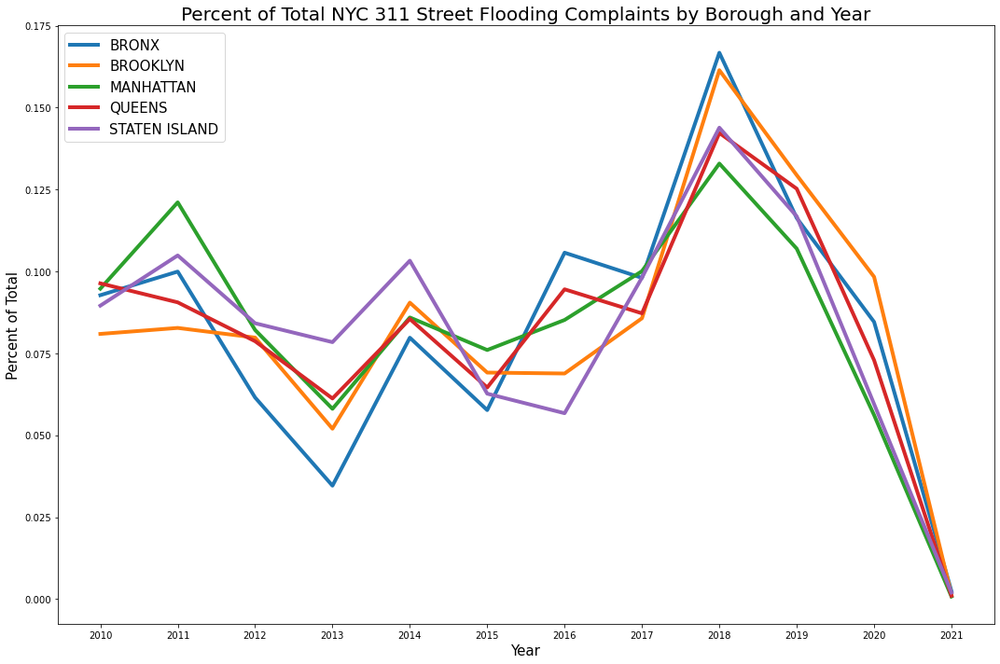

In [160]:
fig, ax = plt.subplots(figsize=(15,10))

ax.xaxis.set_major_locator(plt.MultipleLocator(1))

data_perc.plot(ax=ax, 
               linewidth=4)

plt.xticks(rotation=0)
plt.ylabel('Percent of Total', fontsize=15)
plt.xlabel('Year', fontsize=15)
plt.title('Percent of Total NYC 311 Street Flooding Complaints by Borough and Year', fontsize=20)
plt.legend(loc=2, fontsize=15)
plt.tight_layout()

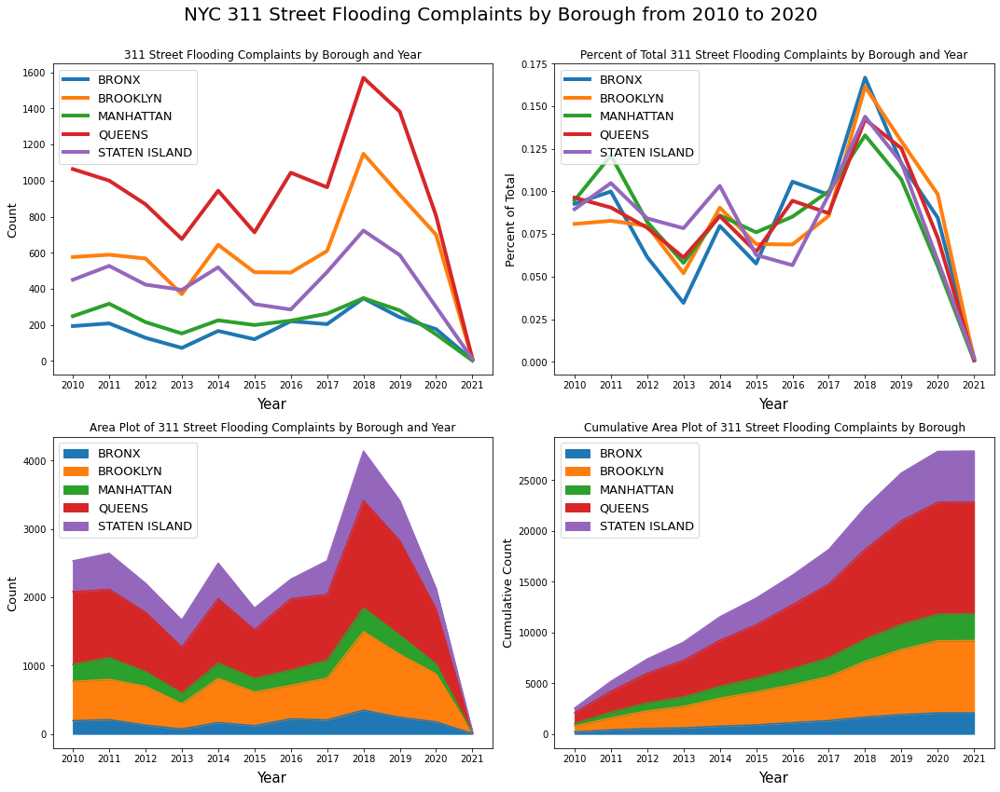

In [161]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))


pivot_table.plot.line(linewidth=4, ax=axs[0,0])
axs[0,0].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[0,0].set_ylabel('Count', fontsize=13)
axs[0,0].set_title('311 Street Flooding Complaints by Borough and Year', fontsize=12)

data_perc.plot(ax=axs[0,1], linewidth=4)
axs[0,1].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[0,1].tick_params(labelrotation=0)
axs[0,1].legend(loc=2, title='borough')
axs[0,1].set_ylabel('Percent of Total', fontsize=13)
axs[0,1].set_title('Percent of Total 311 Street Flooding Complaints by Borough and Year', fontsize=12)

pivot_table.plot.area(ax=axs[1,0])
axs[1,0].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[1,0].set_ylabel('Count', fontsize=13)
axs[1,0].set_title('Area Plot of 311 Street Flooding Complaints by Borough and Year', fontsize=12)
    
pivot_table_cumsum.plot.area(ax=axs[1,1])
axs[1,1].xaxis.set_major_locator(plt.MultipleLocator(1))
axs[1,1].set_ylabel('Cumulative Count', fontsize=13)
axs[1,1].set_title('Cumulative Area Plot of 311 Street Flooding Complaints by Borough', fontsize=12)


for ax in axs.flat:
    ax.set_xlabel('Year', fontsize=15, labelpad=8) 
    ax.legend(loc=2, fontsize=13)

fig.suptitle('NYC 311 Street Flooding Complaints by Borough from 2010 to 2020\n', fontsize=20) 

plt.tight_layout()

In [162]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27885 entries, 0 to 27905
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      27885 non-null  int64         
 1   created_date                    27885 non-null  datetime64[ns]
 2   closed_date                     27874 non-null  object        
 3   agency                          27885 non-null  object        
 4   agency_name                     27885 non-null  object        
 5   complaint_type                  27885 non-null  object        
 6   descriptor                      27885 non-null  object        
 7   incident_zip                    27032 non-null  float64       
 8   intersection_street_1           10083 non-null  object        
 9   intersection_street_2           10083 non-null  object        
 10  address_type                    27882 non-null  object        
 11  ci

In [163]:
flooding_311['year_month_day'] = flooding_311['created_date'].dt.strftime('%Y-%m-%d')
flooding_311['year_month'] = flooding_311['created_date'].dt.strftime('%Y-%m')
flooding_311['year_month_week'] = flooding_311['created_date'].dt.strftime('%Y-%W')

flooding_311.year_month_day = pd.to_datetime(flooding_311.year_month_day)
flooding_311['year_month'] = pd.to_datetime(flooding_311.year_month)
flooding_311['year_month_week'] = pd.to_datetime(flooding_311.year_month_week + '0', format='%Y-%W%w')

In [164]:
create_date = [flooding_311.columns[1]]
print('Preview our original date column\n', create_date)

new_cols = list(flooding_311.iloc[:, -3:].columns)
print('Preview new columns\n', new_cols)

new_cols = create_date + new_cols 
print('Preview original and new columns\n', new_cols)

Preview our original date column
 ['created_date']
Preview new columns
 ['year_month_day', 'year_month', 'year_month_week']
Preview original and new columns
 ['created_date', 'year_month_day', 'year_month', 'year_month_week']


In [165]:
flooding_311[new_cols].head(10)

,created_date,year_month_day,year_month,year_month_week
0,2020-04-12 14:14:00,2020-04-12,2020-04-01,2020-04-12
1,2019-12-16 07:48:00,2019-12-16,2019-12-01,2019-12-22
2,2020-09-01 09:58:00,2020-09-01,2020-09-01,2020-09-06
3,2020-11-12 16:23:00,2020-11-12,2020-11-01,2020-11-15
4,2020-11-12 14:19:00,2020-11-12,2020-11-01,2020-11-15
5,2020-08-14 14:54:00,2020-08-14,2020-08-01,2020-08-16
6,2020-08-17 09:43:00,2020-08-17,2020-08-01,2020-08-23
7,2020-08-18 08:29:00,2020-08-18,2020-08-01,2020-08-23
8,2020-10-29 15:50:00,2020-10-29,2020-10-01,2020-11-01
9,2020-10-29 12:39:00,2020-10-29,2020-10-01,2020-11-01


In [166]:
flooding_311[new_cols].tail(10)

,created_date,year_month_day,year_month,year_month_week
27896,2020-10-29 13:10:00,2020-10-29,2020-10-01,2020-11-01
27897,2020-10-30 12:44:00,2020-10-30,2020-10-01,2020-11-01
27898,2020-10-30 09:26:00,2020-10-30,2020-10-01,2020-11-01
27899,2020-08-27 21:19:00,2020-08-27,2020-08-01,2020-08-30
27900,2019-12-14 02:44:00,2019-12-14,2019-12-01,2019-12-15
27901,2019-11-19 09:59:00,2019-11-19,2019-11-01,2019-11-24
27902,2020-11-01 19:49:00,2020-11-01,2020-11-01,2020-11-01
27903,2020-11-01 18:17:00,2020-11-01,2020-11-01,2020-11-01
27904,2020-11-01 16:52:00,2020-11-01,2020-11-01,2020-11-01
27905,2020-11-02 10:27:00,2020-11-02,2020-11-01,2020-11-08


In [167]:
flooding_311.iloc[:, -3:].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27885 entries, 0 to 27905
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   year_month_day   27885 non-null  datetime64[ns]
 1   year_month       27885 non-null  datetime64[ns]
 2   year_month_week  27885 non-null  datetime64[ns]
dtypes: datetime64[ns](3)
memory usage: 1.9 MB


In [168]:
flooding_311.iloc[:, -3:].describe().T

<ipython-input-168-92e9b03b4fbb>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  flooding_311.iloc[:, -3:].describe().T
<ipython-input-168-92e9b03b4fbb>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  flooding_311.iloc[:, -3:].describe().T
<ipython-input-168-92e9b03b4fbb>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  flooding_311.iloc[:, -3:].describe().T


,count,unique,top,freq,first,last
year_month_day,27885,3481,2017-05-05,247,2010-01-02,2021-01-08
year_month,27885,133,2018-11-01,710,2010-01-01,2021-01-01
year_month_week,27885,575,2014-05-04,336,2010-01-03,2021-01-10


In [169]:
flooding_311.iloc[:, -3:].isna().sum()

year_month_day     0
year_month         0
year_month_week    0
dtype: int64

In [170]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,year_month_day,year_month,year_month_week
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020,2020-04-12,2020-04-01,2020-04-12
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019,2019-12-16,2019-12-01,2019-12-22
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020,2020-09-01,2020-09-01,2020-09-06
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020,2020-11-12,2020-11-01,2020-11-15
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020,2020-11-12,2020-11-01,2020-11-15


In [171]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27885 entries, 0 to 27905
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   unique_key                      27885 non-null  int64         
 1   created_date                    27885 non-null  datetime64[ns]
 2   closed_date                     27874 non-null  object        
 3   agency                          27885 non-null  object        
 4   agency_name                     27885 non-null  object        
 5   complaint_type                  27885 non-null  object        
 6   descriptor                      27885 non-null  object        
 7   incident_zip                    27032 non-null  float64       
 8   intersection_street_1           10083 non-null  object        
 9   intersection_street_2           10083 non-null  object        
 10  address_type                    27882 non-null  object        
 11  ci

## 6.2 Frequencies

In [172]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2021-01-04    7
2021-01-05    7
2021-01-06    3
2021-01-07    1
2021-01-08    1
Name: count, Length: 3481, dtype: int64

In [173]:
flooding_311_daily.isna().sum()

0

In [174]:
flooding_311_daily = flooding_311_daily.asfreq('D')

In [175]:
flooding_311_daily

year_month_day
2010-01-02   3.00
2010-01-03    NaN
2010-01-04   1.00
2010-01-05   1.00
2010-01-06   4.00
             ... 
2021-01-04   7.00
2021-01-05   7.00
2021-01-06   3.00
2021-01-07   1.00
2021-01-08   1.00
Freq: D, Name: count, Length: 4025, dtype: float64

In [176]:
flooding_311_daily.isna().sum()

544

Text(0.5, 1.0, 'Histogram of 311 Street Flooding Complaints per Day')

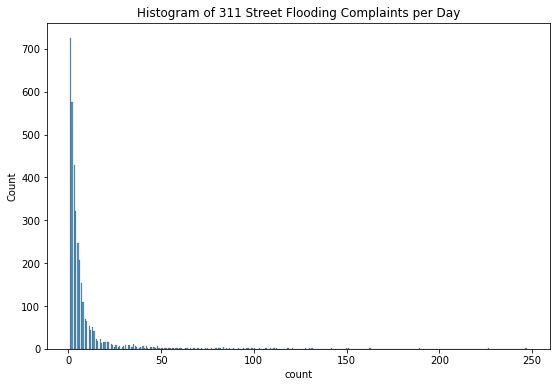

In [177]:
plt.figure(figsize=(9,6))

sns.histplot(flooding_311_daily)
plt.title('Histogram of 311 Street Flooding Complaints per Day')

In [178]:
flooding_311_daily.describe()

count   3481.00
mean       8.01
std       15.83
min        1.00
25%        2.00
50%        4.00
75%        7.00
max      247.00
Name: count, dtype: float64

In [179]:
flooding_311_daily.sort_values(ascending=False)

year_month_day
2017-05-05   247.00
2014-12-09   226.00
2014-04-30   189.00
2018-04-16   163.00
2013-05-08   162.00
              ...  
2020-10-25      NaN
2020-11-04      NaN
2020-11-08      NaN
2020-12-12      NaN
2020-12-19      NaN
Name: count, Length: 4025, dtype: float64

In [180]:
flooding_311_daily.value_counts(dropna=False)

1.00      725
2.00      575
NaN       544
3.00      429
4.00      321
         ... 
107.00      1
74.00       1
99.00       1
79.00       1
54.00       1
Name: count, Length: 106, dtype: int64

## 6.3 Resampling

A better way to extract different frequencies is to resample data based on daily observations. This is how I'll plot the subsequent figures.

In [181]:
print(flooding_311.shape)
flooding_311.head()

(27885, 34)


,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,location,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,year_month_day,year_month,year_month_week
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,"{'latitude': '40.6285987', 'longitude': '-74.1...",204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020,2020-04-12,2020-04-01,2020-04-12
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,"{'latitude': '40.6765736', 'longitude': '-73.9...",NaN,NaN,NaN,NaN,NaN,2019,2019-12-16,2019-12-01,2019-12-22
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,"{'latitude': '40.737832829634904', 'longitude'...",84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020,2020-09-01,2020-09-01,2020-09-06
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,"{'latitude': '40.62981582525854', 'longitude':...",8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020,2020-11-12,2020-11-01,2020-11-15
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,"{'latitude': '40.66860317832641', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2020,2020-11-12,2020-11-01,2020-11-15


In [182]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2021-01-04    7
2021-01-05    7
2021-01-06    3
2021-01-07    1
2021-01-08    1
Name: count, Length: 3481, dtype: int64

In [183]:
flooding_311_daily.resample('D').sum()

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
             ..
2021-01-04    7
2021-01-05    7
2021-01-06    3
2021-01-07    1
2021-01-08    1
Freq: D, Name: count, Length: 4025, dtype: int64

In [184]:
# A one-liner but difficult to read the chained methods
flooding_311.groupby(by='year_month_day')['unique_key'].count().resample('D').sum()

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
             ..
2021-01-04    7
2021-01-05    7
2021-01-06    3
2021-01-07    1
2021-01-08    1
Freq: D, Name: unique_key, Length: 4025, dtype: int64

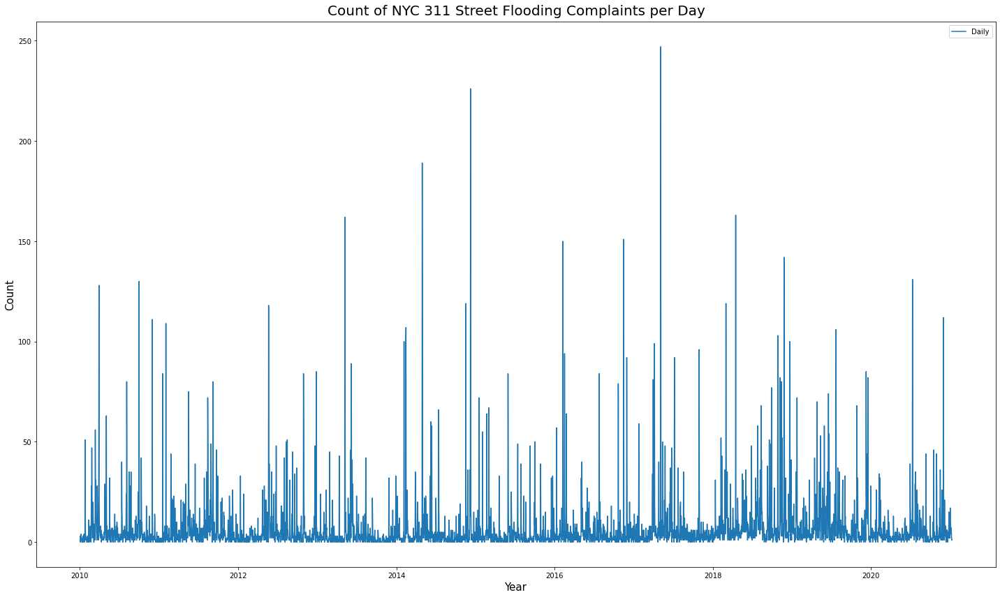

In [185]:
plt.figure(figsize=(20,12))

sns.lineplot(data=flooding_311_daily.resample('D').sum(), 
             label='Daily')

plt.title('Count of NYC 311 Street Flooding Complaints per Day', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [186]:
flooding_311_daily.resample('Y').sum()

year_month_day
2010-12-31    2531
2011-12-31    2641
2012-12-31    2203
2013-12-31    1664
2014-12-31    2498
2015-12-31    1839
2016-12-31    2262
2017-12-31    2532
2018-12-31    4138
2019-12-31    3413
2020-12-31    2127
2021-12-31      37
Freq: A-DEC, Name: count, dtype: int64

In [187]:
flooding_311_daily.resample('YS').sum()

year_month_day
2010-01-01    2531
2011-01-01    2641
2012-01-01    2203
2013-01-01    1664
2014-01-01    2498
2015-01-01    1839
2016-01-01    2262
2017-01-01    2532
2018-01-01    4138
2019-01-01    3413
2020-01-01    2127
2021-01-01      37
Freq: AS-JAN, Name: count, dtype: int64

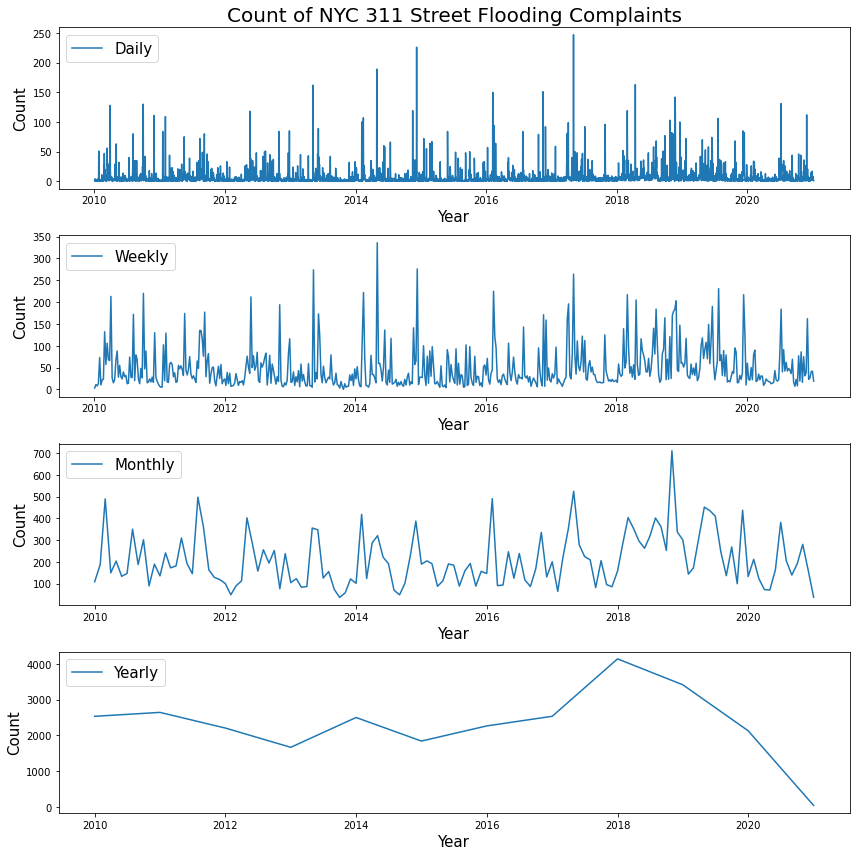

In [188]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharey=False, figsize=(12,12))

years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month

sns.lineplot(data=flooding_311_daily.resample('D').sum(), 
             label='Daily', 
             ax=ax1)
sns.lineplot(data=flooding_311_daily.resample('W').sum(), 
             label='Weekly', 
             ax=ax2)

sns.lineplot(data=flooding_311_daily.resample('MS').sum(), 
             label='Monthly', 
             ax=ax3)

sns.lineplot(data=flooding_311_daily.resample('YS').sum(), 
             label='Yearly', 
             ax=ax4) 

ax1.set_title('Count of NYC 311 Street Flooding Complaints', 
              fontsize=20)

lst = [ax1, ax2, ax3, ax4]
for i in range(len(lst)):
    lst[i].set_ylabel('Count', fontsize=15) 
    lst[i].set_xlabel('Year', fontsize=15)
    lst[i].legend(loc=2, fontsize=15)

plt.tight_layout()

## 6.4 Seasonality

In [189]:
flooding_311['month'] = flooding_311['created_date'].dt.month

In [190]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,incident_address,street_name,cross_street_1,cross_street_2,bbl,year,year_month_day,year_month,year_month_week,month
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,204 MORRISON AVENUE,MORRISON AVENUE,BEMENT AVE,N BURGHER AVE,5003000147.00,2020,2020-04-12,2020-04-01,2020-04-12,4
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,NaN,NaN,NaN,NaN,NaN,2019,2019-12-16,2019-12-01,2019-12-22,12
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,84-17 265 STREET,265 STREET,HILLSIDE AVE,E WILLISTON AVE,4087950010.00,2020,2020-09-01,2020-09-01,2020-09-06,9
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,8518 AVENUE N,AVENUE N,E 85 ST,E 86 ST,3080820008.00,2020,2020-11-12,2020-11-01,2020-11-15,11
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,NaN,NaN,NaN,NaN,NaN,2020,2020-11-12,2020-11-01,2020-11-15,11


In [191]:
flooding_311['month'].describe()

count   27885.00
mean        6.53
std         3.32
min         1.00
25%         4.00
50%         6.00
75%         9.00
max        12.00
Name: month, dtype: float64

In [192]:
flooding_311.groupby(by=['year_month_day'])['unique_key'].count()

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2021-01-04    7
2021-01-05    7
2021-01-06    3
2021-01-07    1
2021-01-08    1
Name: unique_key, Length: 3481, dtype: int64

In [193]:
seasonality_month = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_month.rename(index="count", inplace=True)

seasonality_month = seasonality_month.reset_index().set_index('year_month_day')
seasonality_month.head()

,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [194]:
seasonality_month = seasonality_month.resample('MS').sum()

seasonality_month.head()

,count
year_month_day,
2010-01-01,108
2010-02-01,187
2010-03-01,489
2010-04-01,149
2010-05-01,203


In [195]:
seasonality_month = seasonality_month.reset_index()
seasonality_month['month'] = seasonality_month['year_month_day'].dt.month

seasonality_month.head()

,year_month_day,count,month
0,2010-01-01,108,1
1,2010-02-01,187,2
2,2010-03-01,489,3
3,2010-04-01,149,4
4,2010-05-01,203,5


In [196]:
seasonality_month.tail()

,year_month_day,count,month
128,2020-09-01,139,9
129,2020-10-01,190,10
130,2020-11-01,280,11
131,2020-12-01,163,12
132,2021-01-01,37,1


In [197]:
seasonality_month[['month']].describe()

,month
count,133.00
mean,6.46
std,3.48
min,1.00
25%,3.00
50%,6.00
75%,9.00
max,12.00


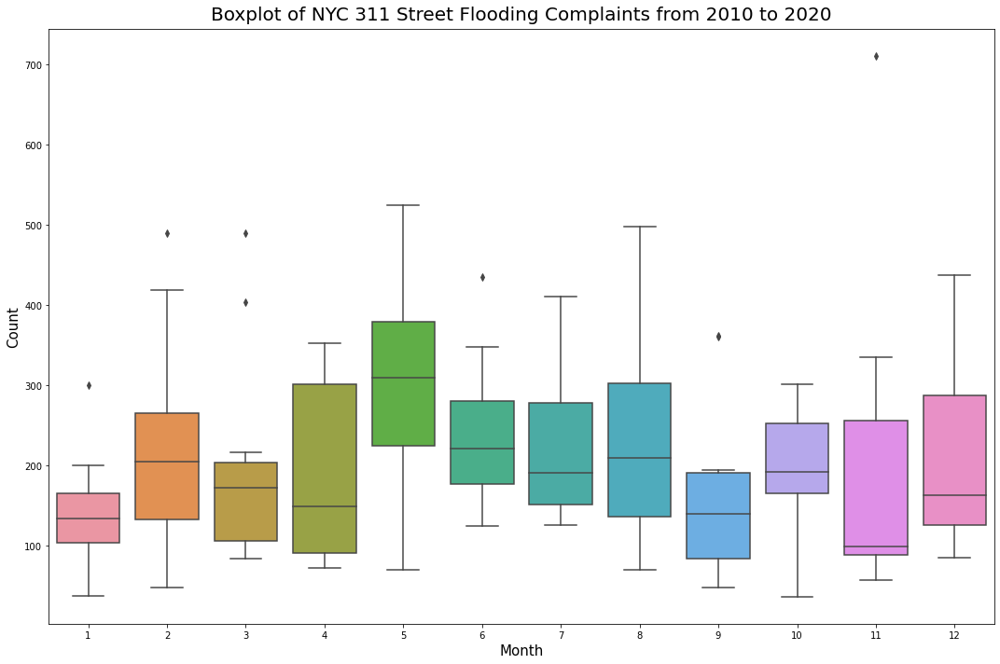

In [198]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_month,
            x='month',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)

plt.xlabel('Month', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [199]:
flooding_311['quarter'] = flooding_311['created_date'].dt.quarter

seasonality_quarter = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_quarter.rename(index="count", inplace=True)

seasonality_quarter = seasonality_quarter.reset_index().set_index('year_month_day')
seasonality_quarter.head()

,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [200]:
seasonality_quarter = seasonality_quarter.resample('QS').sum()

seasonality_quarter.head()

,count
year_month_day,
2010-01-01,784
2010-04-01,485
2010-07-01,683
2010-10-01,579
2011-01-01,548


In [201]:
seasonality_quarter = seasonality_quarter.reset_index()
seasonality_quarter['quarter'] = seasonality_quarter['year_month_day'].dt.quarter

seasonality_quarter.head()

,year_month_day,count,quarter
0,2010-01-01,784,1
1,2010-04-01,485,2
2,2010-07-01,683,3
3,2010-10-01,579,4
4,2011-01-01,548,1


In [202]:
seasonality_quarter[['quarter']].describe()

,quarter
count,45.00
mean,2.47
std,1.14
min,1.00
25%,1.00
50%,2.00
75%,3.00
max,4.00


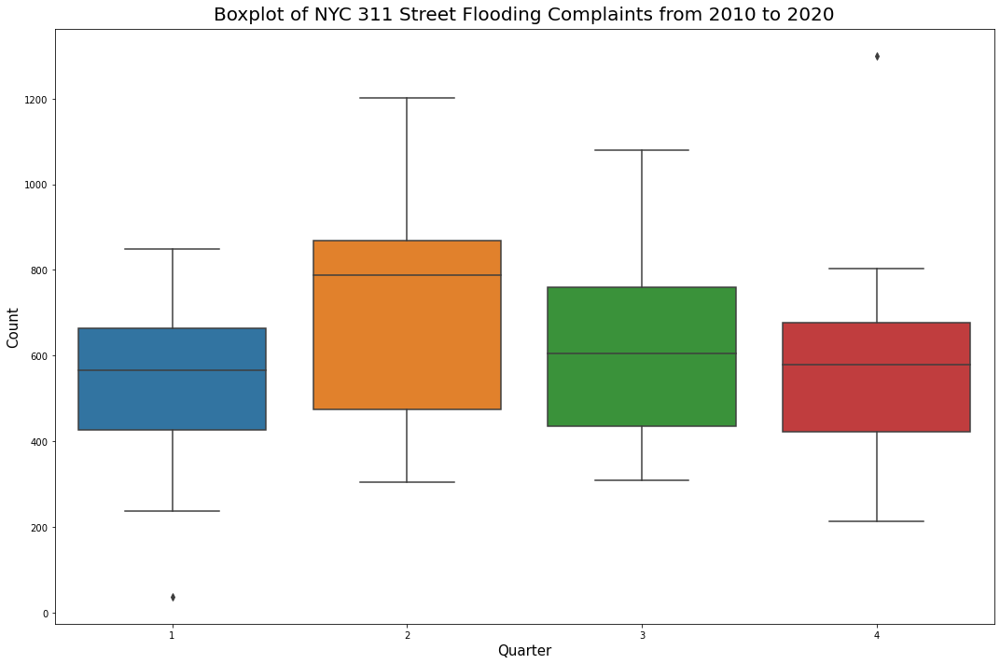

In [203]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_quarter,
            x='quarter',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)
plt.xlabel('Quarter', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [204]:
flooding_311['week_of_year'] = flooding_311['created_date'].dt.weekofyear

seasonality_week = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_week.rename(index="count", inplace=True)

seasonality_week = seasonality_week.reset_index().set_index('year_month_day')
seasonality_week.head()

<ipython-input-204-bc147684ce2d>:1: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  flooding_311['week_of_year'] = flooding_311['created_date'].dt.weekofyear


,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [205]:
seasonality_week = seasonality_week.resample('W').sum()

seasonality_week.head()

,count
year_month_day,
2010-01-03,3
2010-01-10,11
2010-01-17,8
2010-01-24,13
2010-01-31,73


In [206]:
seasonality_week = seasonality_week.reset_index()
seasonality_week['week_of_year'] = seasonality_week['year_month_day'].dt.weekofyear

seasonality_week.head()

<ipython-input-206-2e79c19b7768>:2: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  seasonality_week['week_of_year'] = seasonality_week['year_month_day'].dt.weekofyear


,year_month_day,count,week_of_year
0,2010-01-03,3,53
1,2010-01-10,11,1
2,2010-01-17,8,2
3,2010-01-24,13,3
4,2010-01-31,73,4


In [207]:
seasonality_week[['week_of_year']].describe()

,week_of_year
count,576.00
mean,26.59
std,15.13
min,1.00
25%,13.75
50%,27.00
75%,40.00
max,53.00


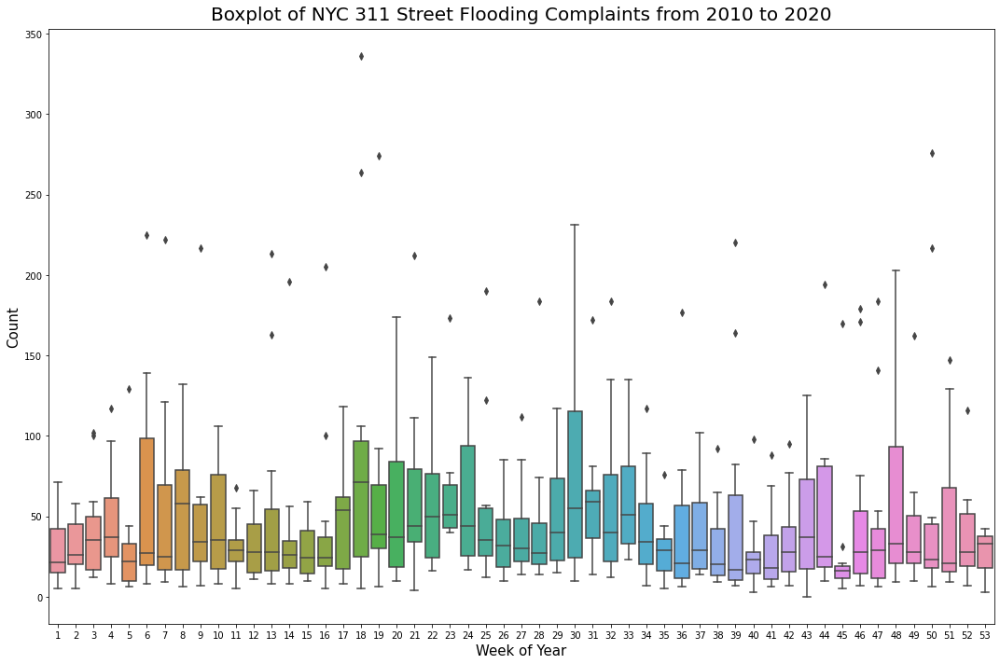

In [208]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_week,
            x='week_of_year',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)
plt.xlabel('Week of Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [209]:
flooding_311['day'] = flooding_311['created_date'].dt.day 

seasonality_day = flooding_311.groupby(by=['year_month_day'])['unique_key'].count()
seasonality_day.rename(index="count", inplace=True)

seasonality_day = seasonality_day.reset_index().set_index('year_month_day')
seasonality_day.head()

,count
year_month_day,
2010-01-02,3
2010-01-04,1
2010-01-05,1
2010-01-06,4
2010-01-07,3


In [210]:
seasonality_day = seasonality_day.resample('d').sum()

seasonality_day.head()

,count
year_month_day,
2010-01-02,3
2010-01-03,0
2010-01-04,1
2010-01-05,1
2010-01-06,4


In [211]:
seasonality_day = seasonality_day.reset_index()
seasonality_day['day'] = seasonality_day['year_month_day'].dt.day

seasonality_day.head()

,year_month_day,count,day
0,2010-01-02,3,2
1,2010-01-03,0,3
2,2010-01-04,1,4
3,2010-01-05,1,5
4,2010-01-06,4,6


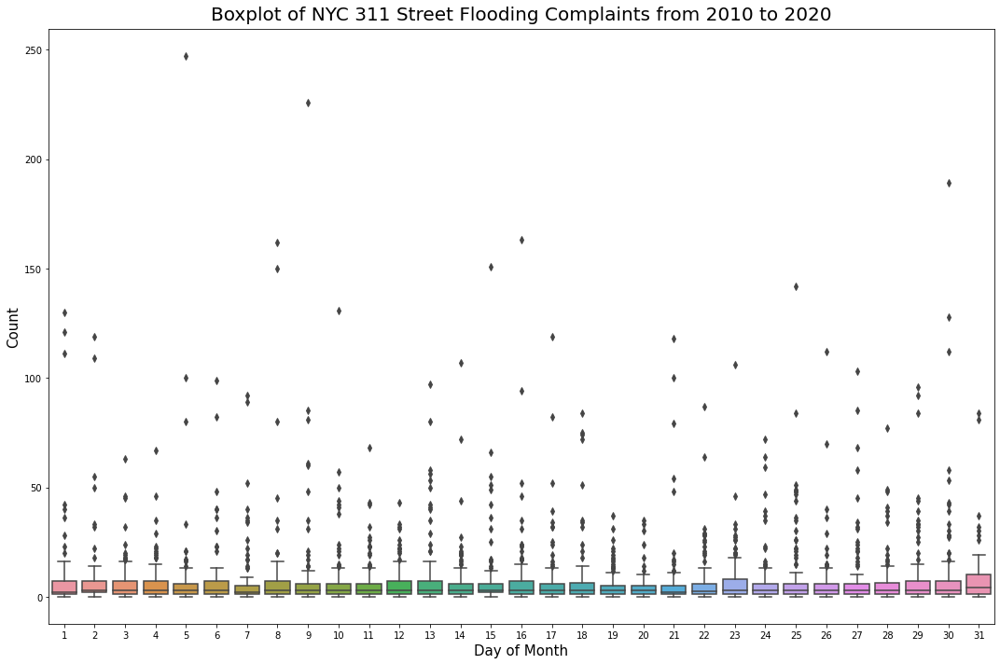

In [212]:
plt.figure(figsize=(15,10))

sns.boxplot(data=seasonality_day,
            x='day',
            y='count')

plt.title('Boxplot of NYC 311 Street Flooding Complaints from 2010 to 2020', 
          fontsize=20,
          pad=10)
plt.xlabel('Day of Month', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

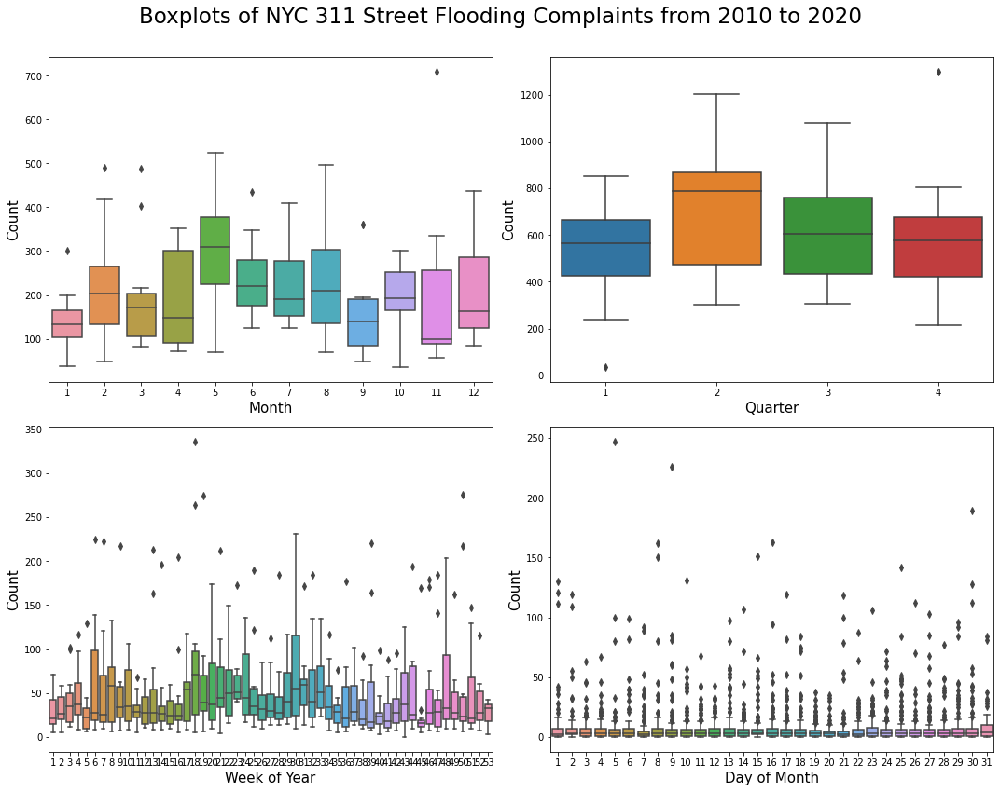

In [213]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))

sns.boxplot(data=seasonality_month,
            x='month',
            y='count',
            ax=axs[0,0])
axs[0,0].set_xlabel('Month', fontsize=15)

sns.boxplot(data=seasonality_quarter,
            x='quarter',
            y='count',
            ax=axs[0,1])
axs[0,1].set_xlabel('Quarter', fontsize=15)

sns.boxplot(data=seasonality_week,
            x='week_of_year',
            y='count',
            ax=axs[1,0])
axs[1,0].set_xlabel('Week of Year', fontsize=15)
sns.boxplot(data=seasonality_day,
            x='day',
            y='count',
            ax=axs[1,1])
axs[1,1].set_xlabel('Day of Month', fontsize=15)

for ax in axs.flat:
    ax.set_ylabel('Count', fontsize=15)

fig.suptitle('Boxplots of NYC 311 Street Flooding Complaints from 2010 to 2020\n', fontsize=23)

plt.tight_layout()

# 6.5 Resampling for Frequency Average

In [214]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily = flooding_311_daily.resample('D').sum()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily.head(10)

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
2010-01-08    1
2010-01-09    1
2010-01-10    0
2010-01-11    0
Freq: D, Name: count, dtype: int64

In [215]:
weekly_mean = flooding_311_daily.resample('W').mean()
monthly_mean = flooding_311_daily.resample('MS').mean()
yearly_mean = flooding_311_daily.resample('YS').mean()

In [216]:
weekly_mean.head()

year_month_day
2010-01-03    1.50
2010-01-10    1.57
2010-01-17    1.14
2010-01-24    1.86
2010-01-31   10.43
Freq: W-SUN, Name: count, dtype: float64

In [217]:
monthly_mean.head()

year_month_day
2010-01-01    3.60
2010-02-01    6.68
2010-03-01   15.77
2010-04-01    4.97
2010-05-01    6.55
Freq: MS, Name: count, dtype: float64

In [218]:
yearly_mean.head()

year_month_day
2010-01-01   6.95
2011-01-01   7.24
2012-01-01   6.02
2013-01-01   4.56
2014-01-01   6.84
Freq: AS-JAN, Name: count, dtype: float64

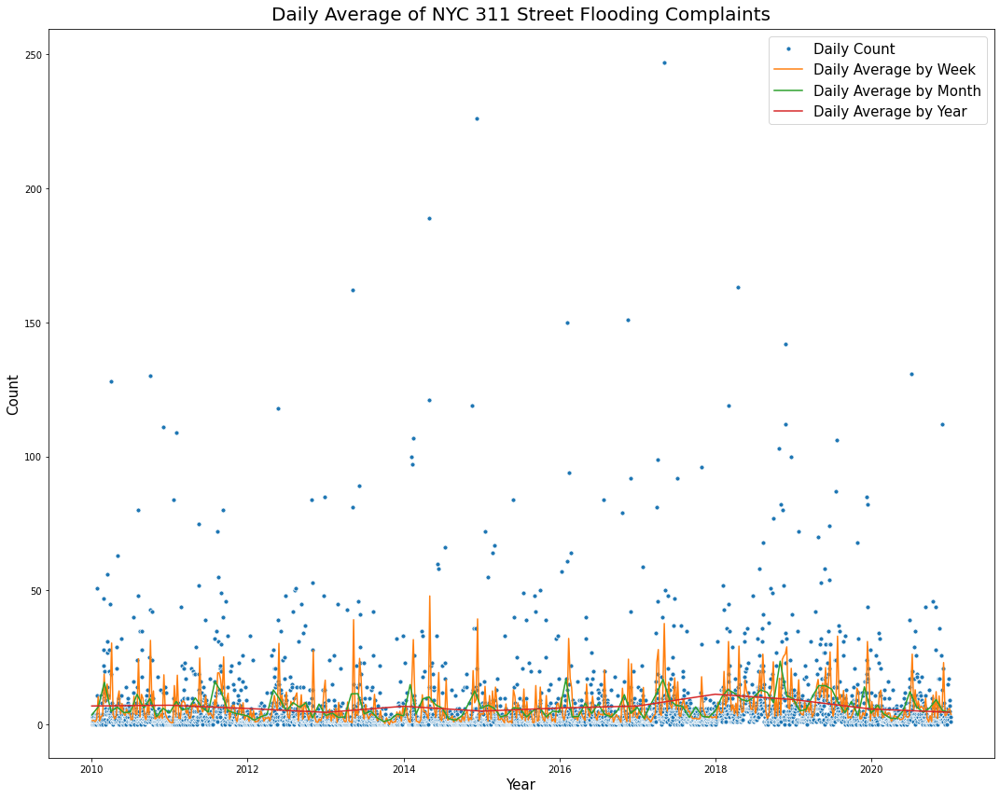

In [219]:
plt.figure(figsize=(15, 12))

sns.lineplot(data=flooding_311_daily, marker='.', markersize=10, linewidth=0, label='Daily Count')
sns.lineplot(data=weekly_mean, label='Daily Average by Week')
sns.lineplot(data=monthly_mean, label='Daily Average by Month')
sns.lineplot(data=yearly_mean, label='Daily Average by Year')

plt.title('Daily Average of NYC 311 Street Flooding Complaints', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.legend(fontsize=15)
plt.tight_layout()

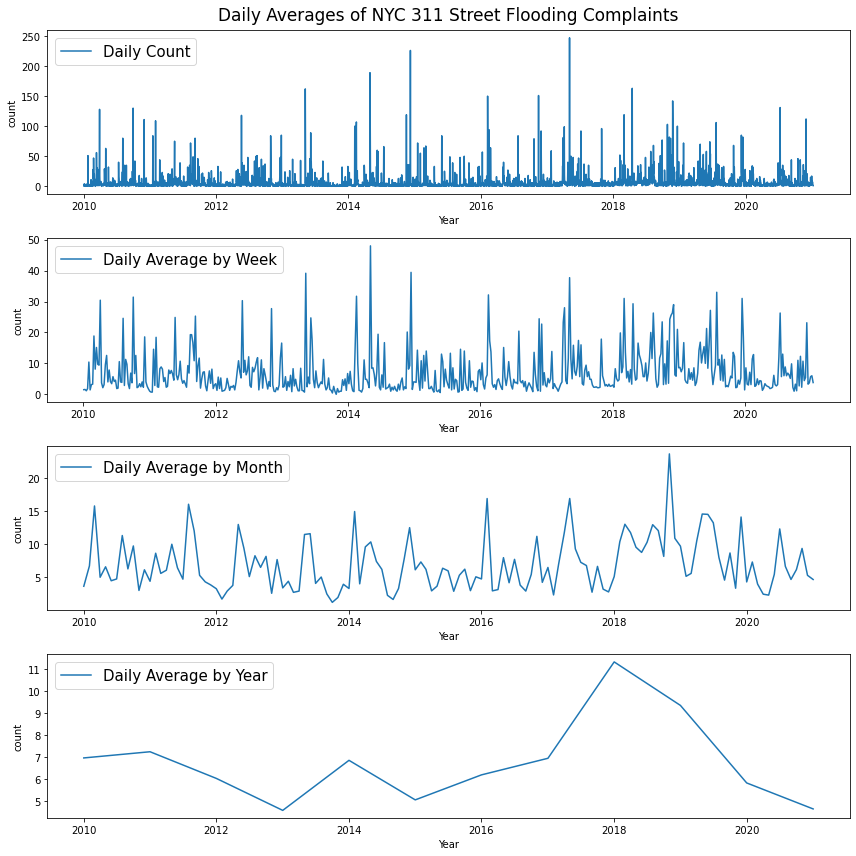

In [220]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharey=False, figsize=(12,12))

sns.lineplot(data=flooding_311_daily, 
             label='Daily Count', 
             ax=ax1)
sns.lineplot(data=weekly_mean, 
             label='Daily Average by Week', 
             ax=ax2)
sns.lineplot(data=monthly_mean, 
             label='Daily Average by Month', 
             ax=ax3)
sns.lineplot(data=yearly_mean, 
             label='Daily Average by Year', 
             ax=ax4)

ax1.set_title('Daily Averages of NYC 311 Street Flooding Complaints', 
              fontsize=17, 
              pad=10)

lst = [ax1, ax2, ax3, ax4]
for i in range(len(lst)):
    lst[i].set_xlabel('Year')
    lst[i].legend(loc=2, fontsize=15)
    
plt.tight_layout()

# 6.6 Rolling Averages

In [221]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily = flooding_311_daily.resample('D').sum()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily.head(10)

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
2010-01-08    1
2010-01-09    1
2010-01-10    0
2010-01-11    0
Freq: D, Name: count, dtype: int64

In [222]:
flooding_311_daily.rolling(7).mean().head(10)

year_month_day
2010-01-02    NaN
2010-01-03    NaN
2010-01-04    NaN
2010-01-05    NaN
2010-01-06    NaN
2010-01-07    NaN
2010-01-08   1.86
2010-01-09   1.57
2010-01-10   1.57
2010-01-11   1.43
Freq: D, Name: count, dtype: float64

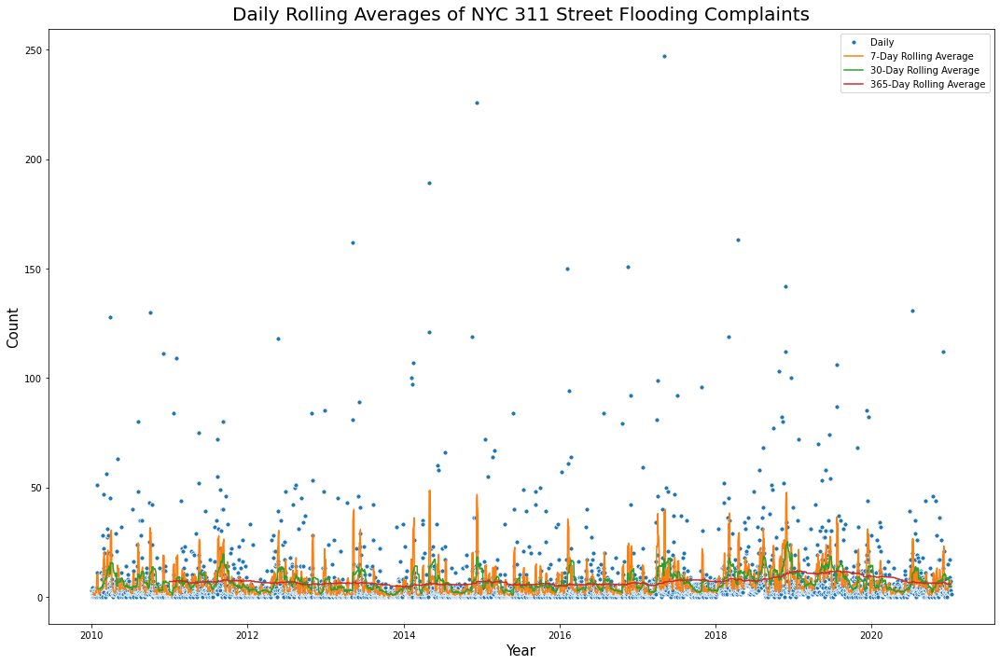

In [223]:
plt.figure(figsize=(15,10))

sns.lineplot(data=flooding_311_daily, marker='.', markersize=10, linewidth=0, label='Daily')
sns.lineplot(data=flooding_311_daily.rolling(7).mean(), label='7-Day Rolling Average')
sns.lineplot(data=flooding_311_daily.rolling(30).mean(), label='30-Day Rolling Average')
sns.lineplot(data=flooding_311_daily.rolling(365).mean(), label='365-Day Rolling Average')

plt.title('Daily Rolling Averages of NYC 311 Street Flooding Complaints', 
          fontsize=20,
          pad=10)
plt.xlabel('Year', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

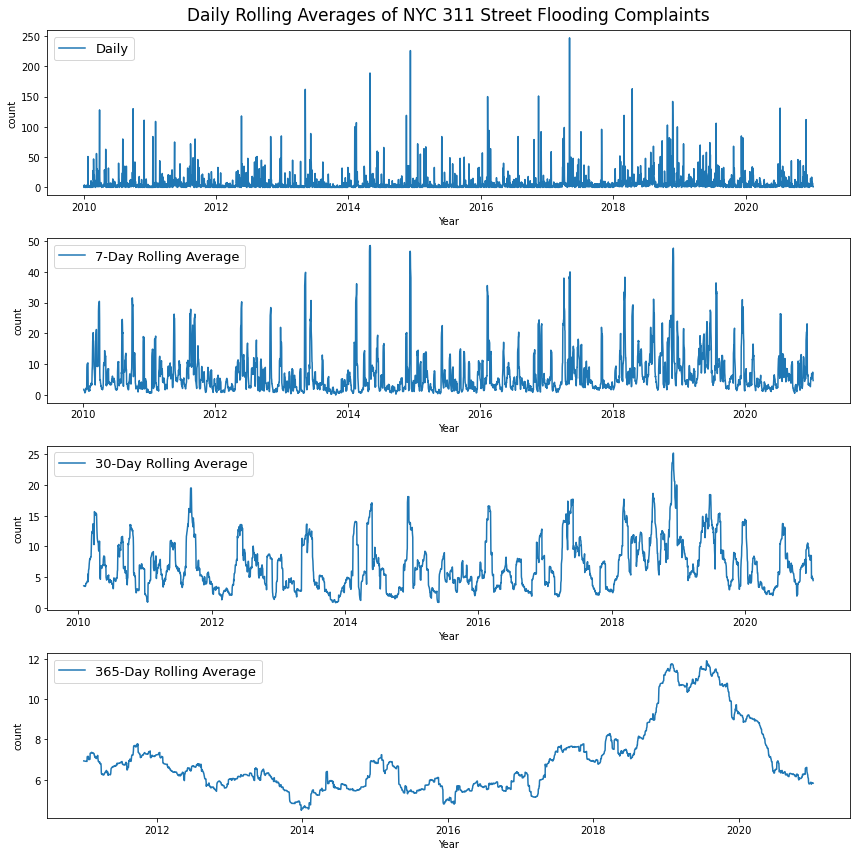

In [224]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, sharey=False, figsize=(12,12))

sns.lineplot(data=flooding_311_daily, 
             label='Daily', 
             ax=ax1)
sns.lineplot(data=flooding_311_daily.rolling(7).mean(), 
             label='7-Day Rolling Average', 
             ax=ax2)
sns.lineplot(data=flooding_311_daily.rolling(30).mean(), 
             label='30-Day Rolling Average', 
             ax=ax3)
sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax4)

ax1.set_title('Daily Rolling Averages of NYC 311 Street Flooding Complaints', 
              fontsize=17, 
              pad=10)

lst = [ax1, ax2, ax3, ax4]
for i in range(len(lst)):
    lst[i].set_xlabel('Year')  
    lst[i].legend(loc=2, fontsize=13)
    
plt.tight_layout()    

## 6.7 Additional Time Series Analysis

In [225]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,cross_street_2,bbl,year,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,N BURGHER AVE,5003000147.00,2020,2020-04-12,2020-04-01,2020-04-12,4,2,15,12
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,NaN,NaN,2019,2019-12-16,2019-12-01,2019-12-22,12,4,51,16
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,E WILLISTON AVE,4087950010.00,2020,2020-09-01,2020-09-01,2020-09-06,9,3,36,1
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,E 86 ST,3080820008.00,2020,2020-11-12,2020-11-01,2020-11-15,11,4,46,12
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,NaN,NaN,2020,2020-11-12,2020-11-01,2020-11-15,11,4,46,12


In [226]:
flooding_311['day_name'] = flooding_311['created_date'].dt.day_name()

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,bbl,year,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day,day_name
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,5003000147.00,2020,2020-04-12,2020-04-01,2020-04-12,4,2,15,12,Sunday
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,NaN,2019,2019-12-16,2019-12-01,2019-12-22,12,4,51,16,Monday
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,4087950010.00,2020,2020-09-01,2020-09-01,2020-09-06,9,3,36,1,Tuesday
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,3080820008.00,2020,2020-11-12,2020-11-01,2020-11-15,11,4,46,12,Thursday
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,NaN,2020,2020-11-12,2020-11-01,2020-11-15,11,4,46,12,Thursday


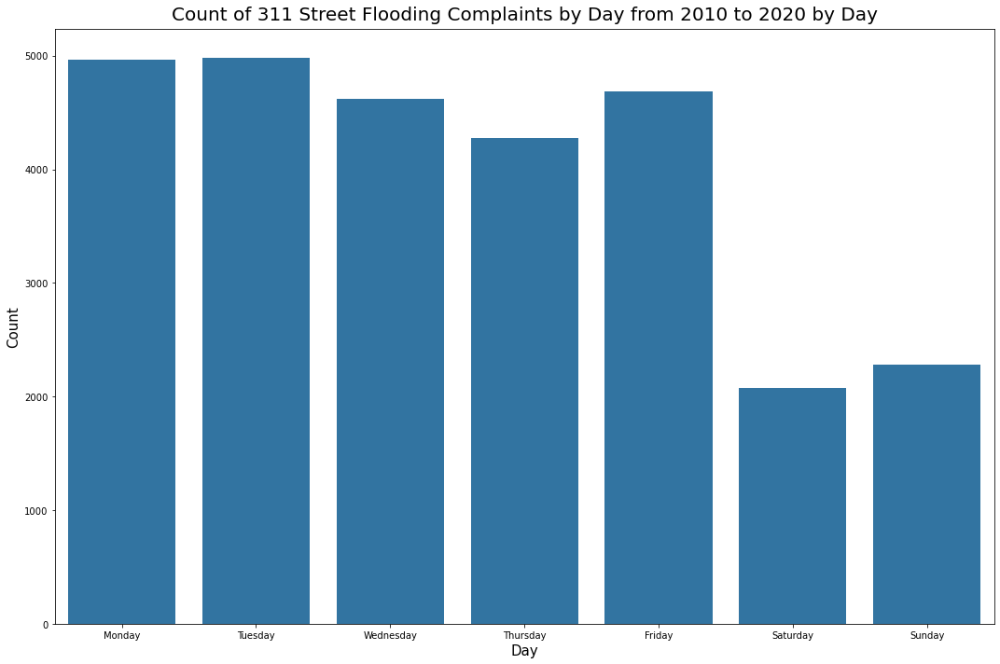

In [227]:
plt.figure(figsize=(15,10))

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

sns.countplot(x=flooding_311['day_name'],
              color='#1f77b4',
              order=order)

plt.title('Count of 311 Street Flooding Complaints by Day from 2010 to 2020 by Day', 
          fontsize=20,
          pad=10)
plt.xlabel('Day', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [228]:
flooding_311['hour'] = flooding_311['created_date'].dt.hour

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020,2020-04-12,2020-04-01,2020-04-12,4,2,15,12,Sunday,14
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,2019,2019-12-16,2019-12-01,2019-12-22,12,4,51,16,Monday,7
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,2020,2020-09-01,2020-09-01,2020-09-06,9,3,36,1,Tuesday,9
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,2020,2020-11-12,2020-11-01,2020-11-15,11,4,46,12,Thursday,16
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,2020,2020-11-12,2020-11-01,2020-11-15,11,4,46,12,Thursday,14


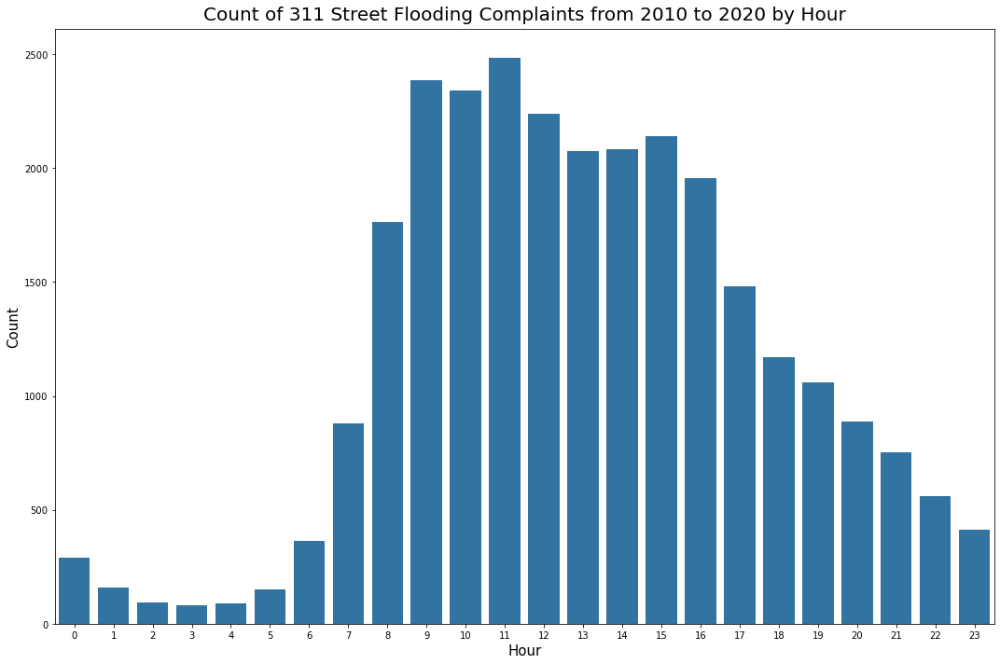

In [229]:
plt.figure(figsize=(15,10))

sns.countplot(x=flooding_311['hour'],
              color='#1f77b4')

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by Hour', 
          fontsize=20,
          pad=10)
plt.xlabel('Hour', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [230]:
flooding_311['time'] = flooding_311['created_date'].dt.time

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month_day,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020-04-12,2020-04-01,2020-04-12,4,2,15,12,Sunday,14,14:14:00
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,2019-12-16,2019-12-01,2019-12-22,12,4,51,16,Monday,7,07:48:00
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,2020-09-01,2020-09-01,2020-09-06,9,3,36,1,Tuesday,9,09:58:00
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,2020-11-12,2020-11-01,2020-11-15,11,4,46,12,Thursday,16,16:23:00
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,2020-11-12,2020-11-01,2020-11-15,11,4,46,12,Thursday,14,14:19:00


In [231]:
flooding_time = flooding_311.groupby(by='time')['unique_key'].count()
flooding_time.rename(index="count", inplace=True)
flooding_time = flooding_time.reset_index()

flooding_time.head()

,time,count
0,00:00:00,73
1,00:01:00,6
2,00:02:00,6
3,00:03:00,4
4,00:04:00,6


In [232]:
flooding_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1383 entries, 0 to 1382
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   time    1383 non-null   object
 1   count   1383 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 21.7+ KB


In [233]:
flooding_time.time = pd.to_datetime(flooding_time.time, format='%H:%M:%S')
flooding_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1383 entries, 0 to 1382
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    1383 non-null   datetime64[ns]
 1   count   1383 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 21.7 KB


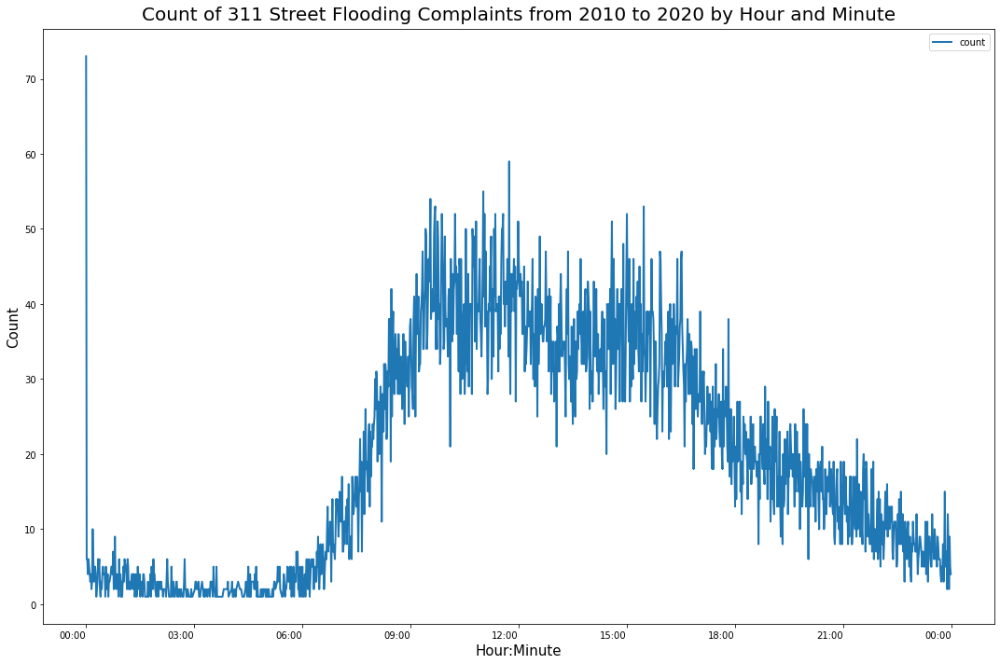

In [234]:
fig, ax = plt.subplots(figsize=(15,10))

myFmt = matplotlib.dates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(myFmt)

flooding_time.plot(x='time',
                   y='count',
                   ax=ax, 
                   rot=0,
                   color='#1f77b4', 
                   linewidth=2)

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by Hour and Minute', 
          fontsize=20,
          pad=10)
plt.xlabel('Hour:Minute', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [235]:
flooding_time.set_index('time', inplace=True)
flooding_time = flooding_time['count'].rolling(15).mean()
flooding_time

time
1900-01-01 00:00:00    NaN
1900-01-01 00:01:00    NaN
1900-01-01 00:02:00    NaN
1900-01-01 00:03:00    NaN
1900-01-01 00:04:00    NaN
                      ... 
1900-01-01 23:55:00   6.27
1900-01-01 23:56:00   6.00
1900-01-01 23:57:00   6.33
1900-01-01 23:58:00   6.47
1900-01-01 23:59:00   6.40
Name: count, Length: 1383, dtype: float64

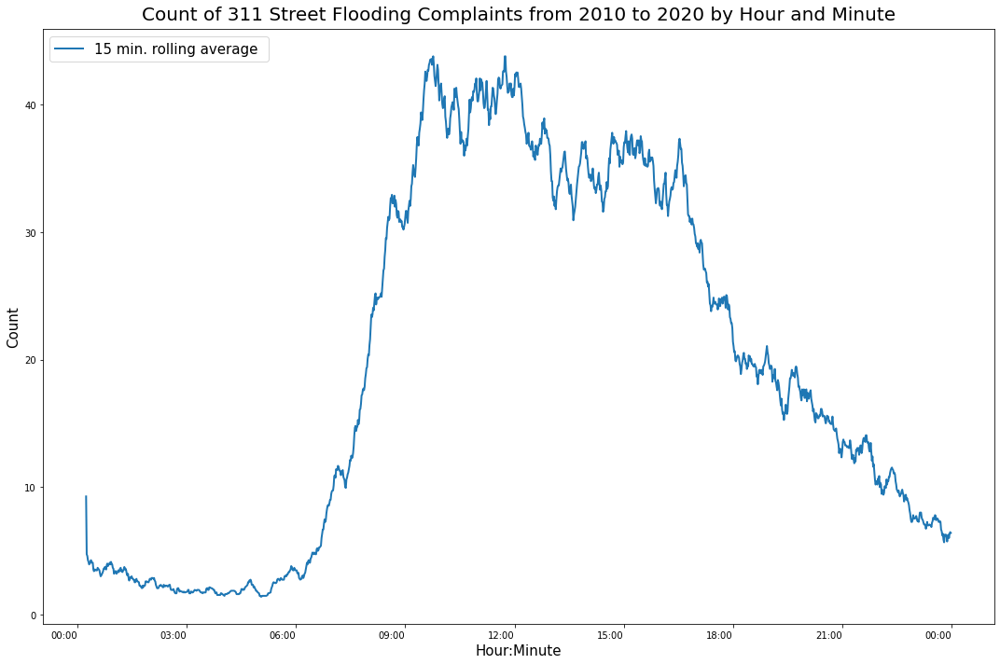

In [236]:
fig, ax = plt.subplots(figsize=(15,10))

myFmt = matplotlib.dates.DateFormatter('%H:%M')
ax.xaxis.set_major_formatter(myFmt)

flooding_time.plot(y='count',
                   ax=ax, 
                   rot=0,
                   color='#1f77b4', 
                   linewidth=2,
                   label='15 min. rolling average ', 
                   legend=True)

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by Hour and Minute', 
          fontsize=20,
          pad=10)
plt.legend(loc=2, fontsize=15)
plt.xlabel('Hour:Minute', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

In [237]:
flooding_311['am_pm'] = flooding_311['created_date'].dt.strftime('%p')

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time,am_pm
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020-04-01,2020-04-12,4,2,15,12,Sunday,14,14:14:00,PM
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,2019-12-01,2019-12-22,12,4,51,16,Monday,7,07:48:00,AM
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,2020-09-01,2020-09-06,9,3,36,1,Tuesday,9,09:58:00,AM
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,2020-11-01,2020-11-15,11,4,46,12,Thursday,16,16:23:00,PM
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,2020-11-01,2020-11-15,11,4,46,12,Thursday,14,14:19:00,PM


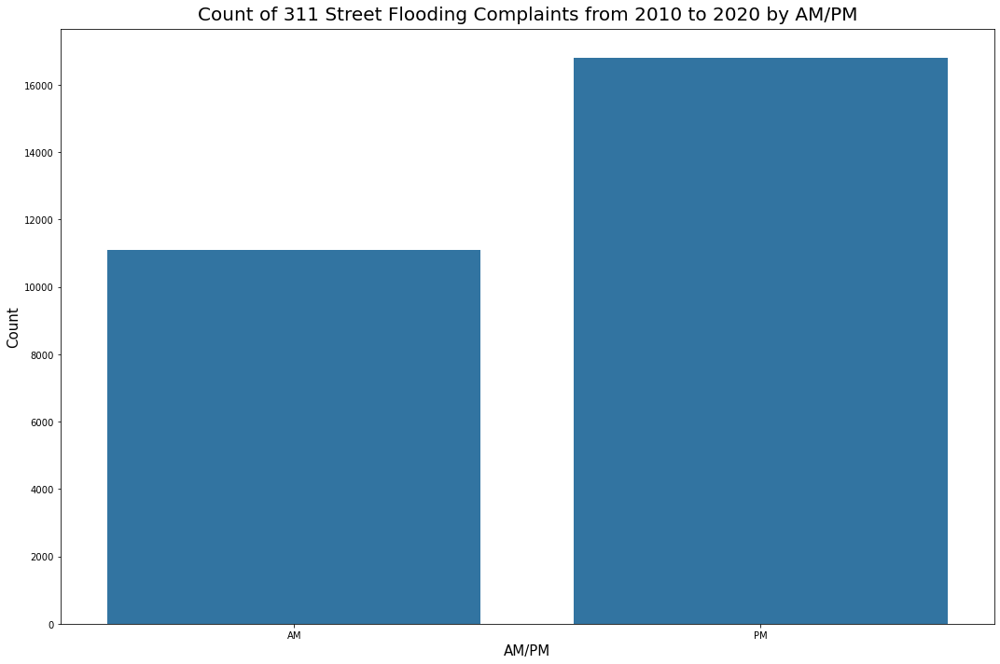

In [238]:
plt.figure(figsize=(15,10))

order = ['AM', 'PM']

sns.countplot(x=flooding_311['am_pm'],
              color='#1f77b4',
              order=order)

plt.title('Count of 311 Street Flooding Complaints from 2010 to 2020 by AM/PM', 
          fontsize=20,
          pad=10)
plt.xlabel('AM/PM', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.tight_layout()

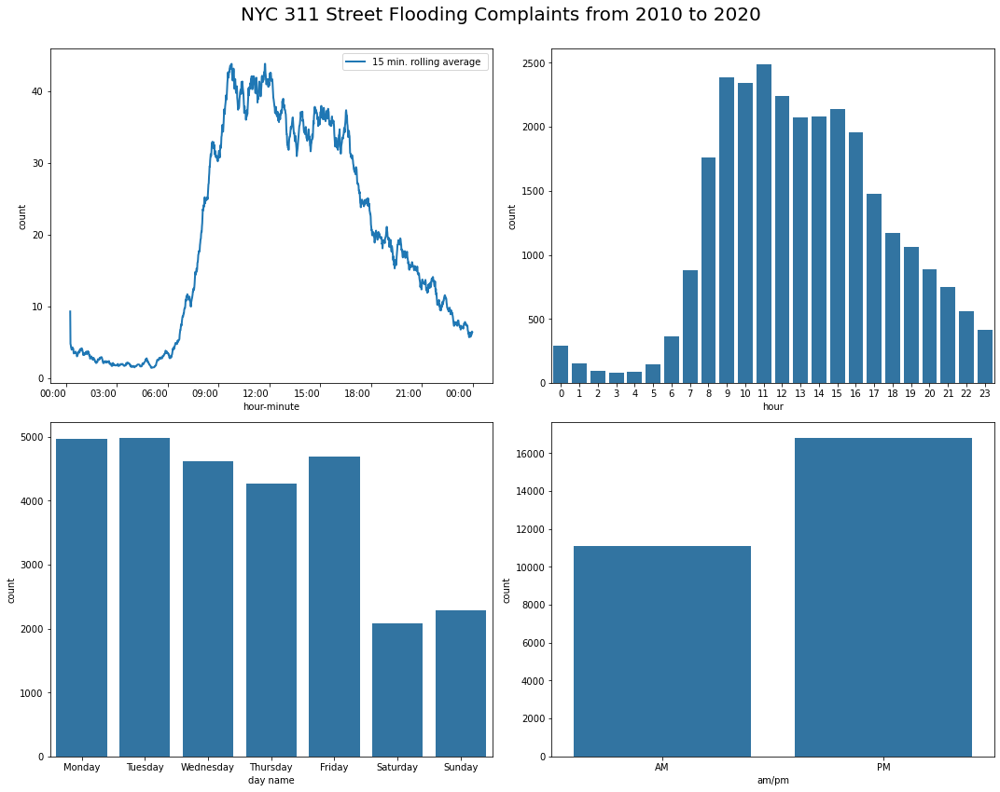

In [239]:
fig, axs = plt.subplots(2, 2, sharey=False, figsize=(15, 12))

myFmt = matplotlib.dates.DateFormatter('%H:%M')
axs[0,0].xaxis.set_major_formatter(myFmt)
flooding_time.plot(x='time',
                   y='count',
                   ax=axs[0,0], 
                   rot=0,
                   color='#1f77b4', 
                   linewidth=2,
                   legend=True,
                   label='15 min. rolling average ')
axs[0,0].set_ylabel('count') 
axs[0,0].set_xlabel('hour-minute')

sns.countplot(x=flooding_311['hour'],
              color='#1f77b4',
              ax=axs[0,1])

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(x=flooding_311['day_name'],
              color='#1f77b4',
              order=order,
              ax=axs[1,0])
axs[1,0].set_xlabel('day name')

order = ['AM', 'PM']
sns.countplot(x=flooding_311['am_pm'],
              color='#1f77b4',
              order=order,
              ax=axs[1,1])
axs[1,1].set_xlabel('am/pm')

fig.suptitle('NYC 311 Street Flooding Complaints from 2010 to 2020\n', fontsize=20) 

plt.tight_layout()
# plt.savefig('figures/sample.png')

In [240]:
flooding_311.to_csv('data-output/complaints-with-timeseries-info.csv', index=False)

# 7. Anomoly Detection

Count per Frequency Ranked

In [241]:
flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time,am_pm
0,45989680,2020-04-12 14:14:00,2020-04-13T08:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020-04-01,2020-04-12,4,2,15,12,Sunday,14,14:14:00,PM
1,45178597,2019-12-16 07:48:00,2020-01-16T13:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,2019-12-01,2019-12-22,12,4,51,16,Monday,7,07:48:00,AM
2,47428465,2020-09-01 09:58:00,2020-09-01T18:05:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,2020-09-01,2020-09-06,9,3,36,1,Tuesday,9,09:58:00,AM
3,48133312,2020-11-12 16:23:00,2020-11-13T14:10:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,2020-11-01,2020-11-15,11,4,46,12,Thursday,16,16:23:00,PM
4,48135671,2020-11-12 14:19:00,2020-11-16T08:35:00.000,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,2020-11-01,2020-11-15,11,4,46,12,Thursday,14,14:19:00,PM


In [242]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()

flooding_311_daily.resample('D').sum().sort_values(ascending=False).head(10).reset_index()

,year_month_day,unique_key
0,2017-05-05,247
1,2014-12-09,226
2,2014-04-30,189
3,2018-04-16,163
4,2013-05-08,162
5,2016-11-15,151
6,2016-02-08,150
7,2018-11-25,142
8,2020-07-10,131
9,2010-10-01,130


In [243]:
flooding_311_daily.resample('D').sum().sort_values(ascending=False).head(10).reset_index().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year_month_day  10 non-null     datetime64[ns]
 1   unique_key      10 non-null     int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 288.0 bytes


In [244]:
daily = flooding_311_daily.resample('D').sum().sort_values(ascending=False).head(10).reset_index()
daily.rename(columns={"unique_key": "count"}, 
             inplace=True)

daily['date_formatted'] = daily['year_month_day'].dt.strftime('%Y-%m-%d')

daily.head(10)

,year_month_day,count,date_formatted
0,2017-05-05,247,2017-05-05
1,2014-12-09,226,2014-12-09
2,2014-04-30,189,2014-04-30
3,2018-04-16,163,2018-04-16
4,2013-05-08,162,2013-05-08
5,2016-11-15,151,2016-11-15
6,2016-02-08,150,2016-02-08
7,2018-11-25,142,2018-11-25
8,2020-07-10,131,2020-07-10
9,2010-10-01,130,2010-10-01


In [245]:
daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year_month_day  10 non-null     datetime64[ns]
 1   count           10 non-null     int64         
 2   date_formatted  10 non-null     object        
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 368.0+ bytes


In [246]:
weekly = flooding_311_daily.resample('W').sum().sort_values(ascending=False).head(10).reset_index()
weekly.rename(columns={"unique_key": "count"}, 
              inplace=True)

weekly['date_formatted'] = weekly.year_month_day.astype(str)

weekly.head(10)

,year_month_day,count,date_formatted
0,2014-05-04,336,2014-05-04
1,2014-12-14,276,2014-12-14
2,2013-05-12,274,2013-05-12
3,2017-05-07,264,2017-05-07
4,2019-07-28,231,2019-07-28
5,2016-02-14,225,2016-02-14
6,2014-02-16,222,2014-02-16
7,2010-10-03,220,2010-10-03
8,2019-12-15,217,2019-12-15
9,2018-03-04,217,2018-03-04


In [247]:
# sanity check - checking when the weekly frequency stops (Sunday?)

In [248]:
flooding_311_daily.resample('D').sum().head(10).reset_index()

,year_month_day,unique_key
0,2010-01-02,3
1,2010-01-03,0
2,2010-01-04,1
3,2010-01-05,1
4,2010-01-06,4
5,2010-01-07,3
6,2010-01-08,1
7,2010-01-09,1
8,2010-01-10,0
9,2010-01-11,0


In [249]:
weekly_sanity_check  = flooding_311_daily.resample('W').sum().head(10).reset_index()

weekly_sanity_check['day_name'] = weekly_sanity_check.year_month_day.dt.day_name()

weekly_sanity_check.head()

,year_month_day,unique_key,day_name
0,2010-01-03,3,Sunday
1,2010-01-10,11,Sunday
2,2010-01-17,8,Sunday
3,2010-01-24,13,Sunday
4,2010-01-31,73,Sunday


In [250]:
# sanity check - approved. Bins weekly from Monday to Sunday

In [251]:
monthly = flooding_311_daily.resample('MS').sum().sort_values(ascending=False).head(10).reset_index()
monthly.rename(columns={"unique_key": "count"}, 
               inplace=True)

monthly['date_formatted'] = monthly['year_month_day'].dt.strftime('%Y-%b')

monthly.head()

,year_month_day,count,date_formatted
0,2018-11-01,710,2018-Nov
1,2017-05-01,524,2017-May
2,2011-08-01,497,2011-Aug
3,2016-02-01,490,2016-Feb
4,2010-03-01,489,2010-Mar


In [252]:
yearly = flooding_311_daily.resample('YS').sum().sort_values(ascending=False).head(10).reset_index()
yearly.rename(columns={"unique_key": "count"}, 
              inplace=True)

yearly['date_formatted'] = yearly['year_month_day'].dt.strftime('%Y')

yearly.head()

,year_month_day,count,date_formatted
0,2018-01-01,4138,2018
1,2019-01-01,3413,2019
2,2011-01-01,2641,2011
3,2017-01-01,2532,2017
4,2010-01-01,2531,2010


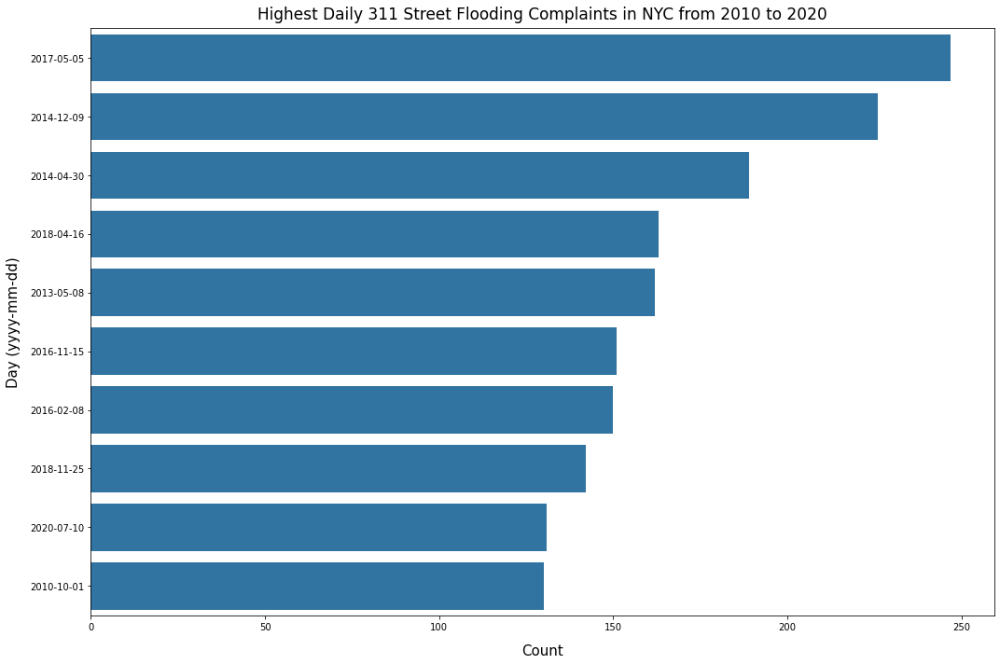

In [253]:
plt.figure(figsize=(15,10))

sns.barplot(data=daily,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Daily 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Day (yyyy-mm-dd)', fontsize=15, labelpad=10)
plt.tight_layout()

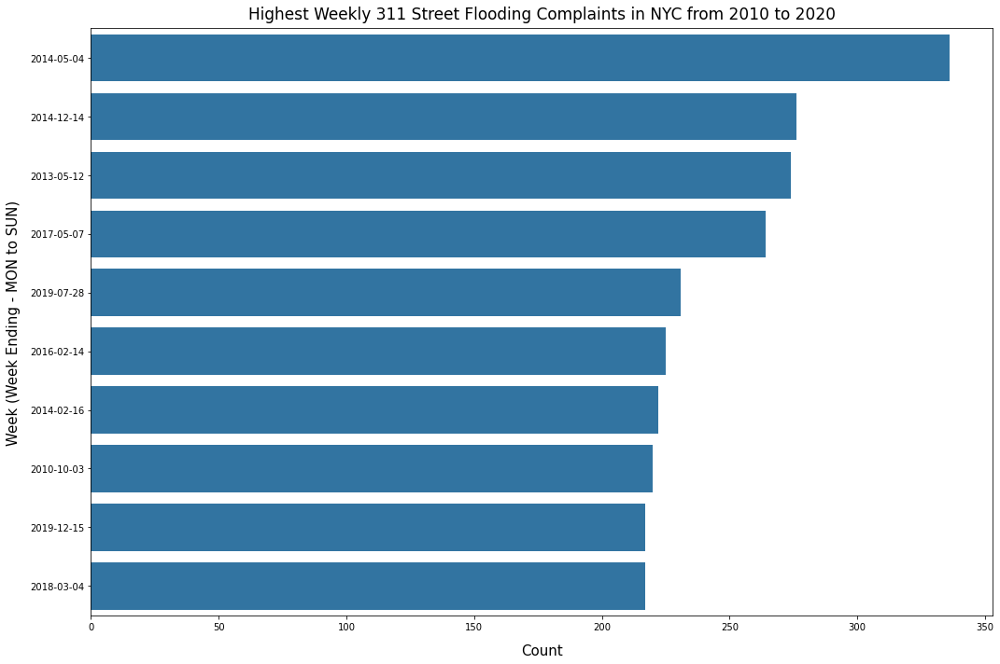

In [254]:
plt.figure(figsize=(15,10))

sns.barplot(data=weekly,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Weekly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Week (Week Ending - MON to SUN)', fontsize=15, labelpad=10)
plt.tight_layout()

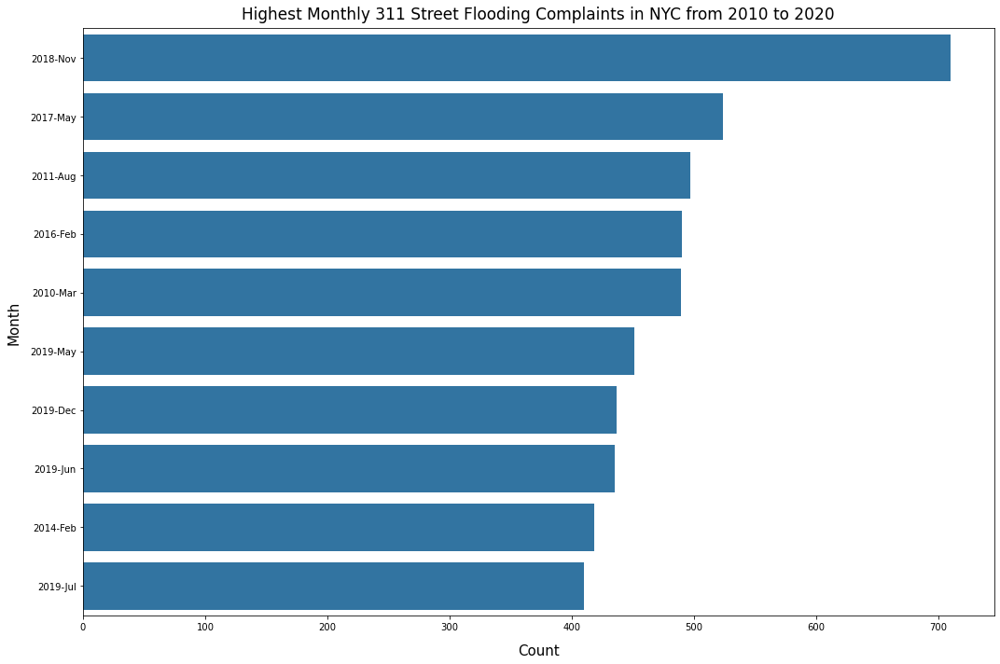

In [255]:
plt.figure(figsize=(15,10))

sns.barplot(data=monthly,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Monthly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Month', fontsize=15, labelpad=10)
plt.tight_layout()

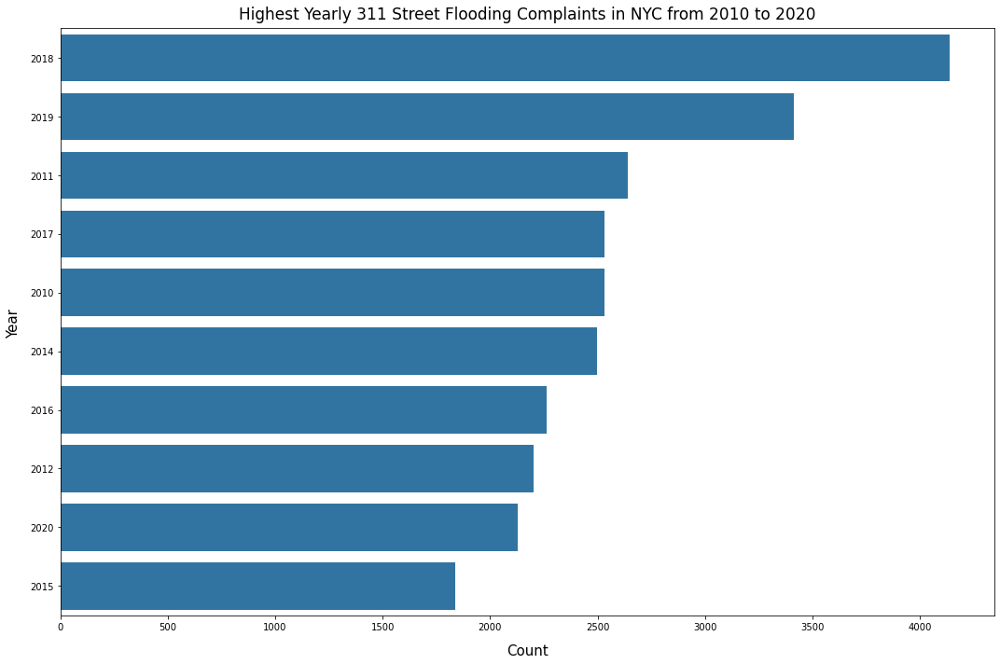

In [256]:
plt.figure(figsize=(15,10))

sns.barplot(data=yearly,
            y='date_formatted',
            x='count',
            color='#1f77b4')

plt.title('Highest Yearly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
          fontsize=17,
          pad=10)
plt.xlabel('Count', fontsize=15, labelpad=13)
plt.ylabel('Year', fontsize=15, labelpad=10)
plt.tight_layout()

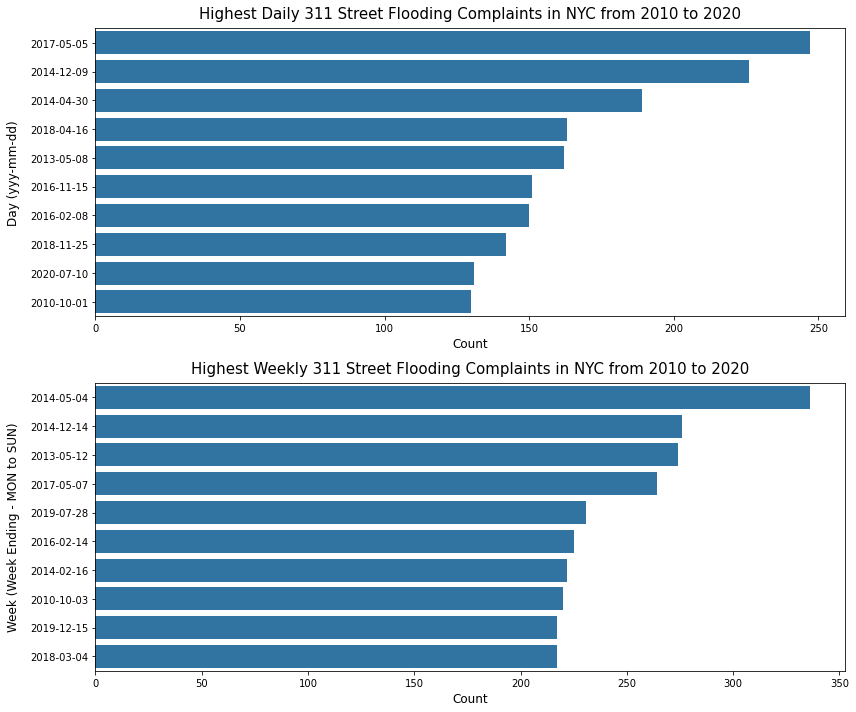

In [257]:
fig, axs = plt.subplots(2, 1, sharey=False, figsize=(12, 10))

# first plot
sns.barplot(data=daily,
            y='date_formatted',
            x='count',
            color='#1f77b4',
            ax=axs[0])

axs[0].set_title('Highest Daily 311 Street Flooding Complaints in NYC from 2010 to 2020', 
                  fontsize=15,
                  pad=10)
axs[0].set_xlabel('Count', fontsize=12)
axs[0].set_ylabel('Day (yyy-mm-dd)', fontsize=12, labelpad=10)

# second plot
sns.barplot(data=weekly,
            y='date_formatted',
            x='count',
            color='#1f77b4',
            ax=axs[1])

axs[1].set_title('Highest Weekly 311 Street Flooding Complaints in NYC from 2010 to 2020', 
                  fontsize=15,
                  pad=10)
axs[1].set_xlabel('Count', fontsize=12)
axs[1].set_ylabel('Week (Week Ending - MON to SUN)', fontsize=12, labelpad=10)

plt.tight_layout()

In [258]:
flooding_311_daily.resample('D').sum().sort_values(ascending=False).reset_index().to_csv('data-output/daily-street-flooding-counts.csv', index=False)

flooding_311_daily.resample('W').sum().sort_values(ascending=False).reset_index().to_csv('data-output/weekly-street-flooding-counts.csv', index=False)

# 8. Manually Formatting Date Tick Labels

In [259]:
flooding_311_daily

year_month_day
2010-01-02    3
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
             ..
2021-01-04    7
2021-01-05    7
2021-01-06    3
2021-01-07    1
2021-01-08    1
Name: unique_key, Length: 3481, dtype: int64

In [260]:
flooding_311_daily = flooding_311.groupby(by='year_month_day')['unique_key'].count()
flooding_311_daily = flooding_311_daily.resample('D').sum()
flooding_311_daily.rename(index="count", inplace=True)

flooding_311_daily.head(10)

year_month_day
2010-01-02    3
2010-01-03    0
2010-01-04    1
2010-01-05    1
2010-01-06    4
2010-01-07    3
2010-01-08    1
2010-01-09    1
2010-01-10    0
2010-01-11    0
Freq: D, Name: count, dtype: int64

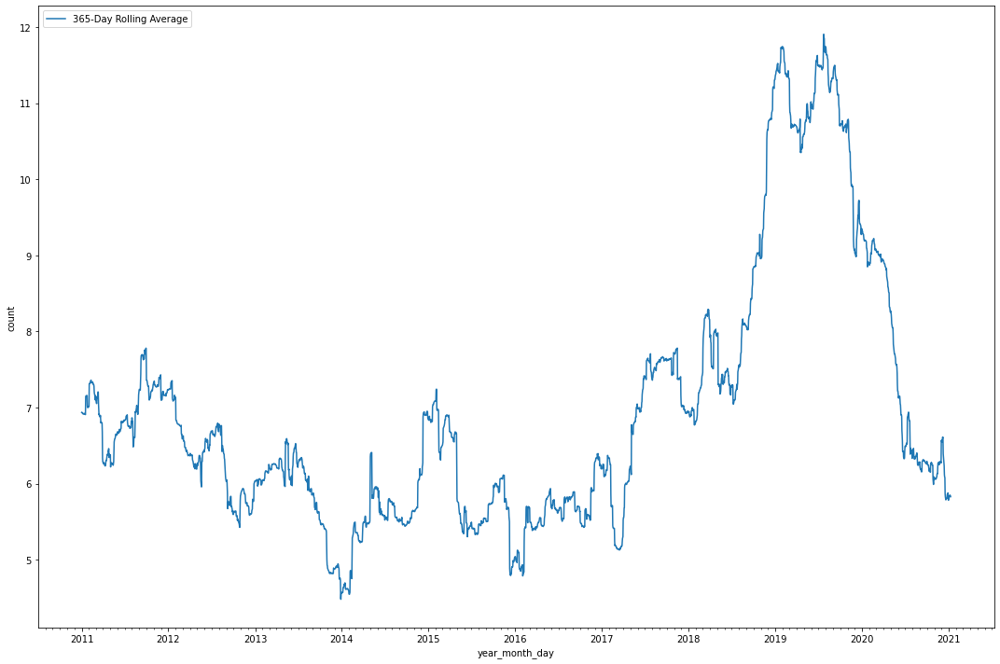

In [261]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
years_fmt = mdates.DateFormatter('%Y')

# format the ticks
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)
ax.xaxis.set_minor_locator(months)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_1.png')

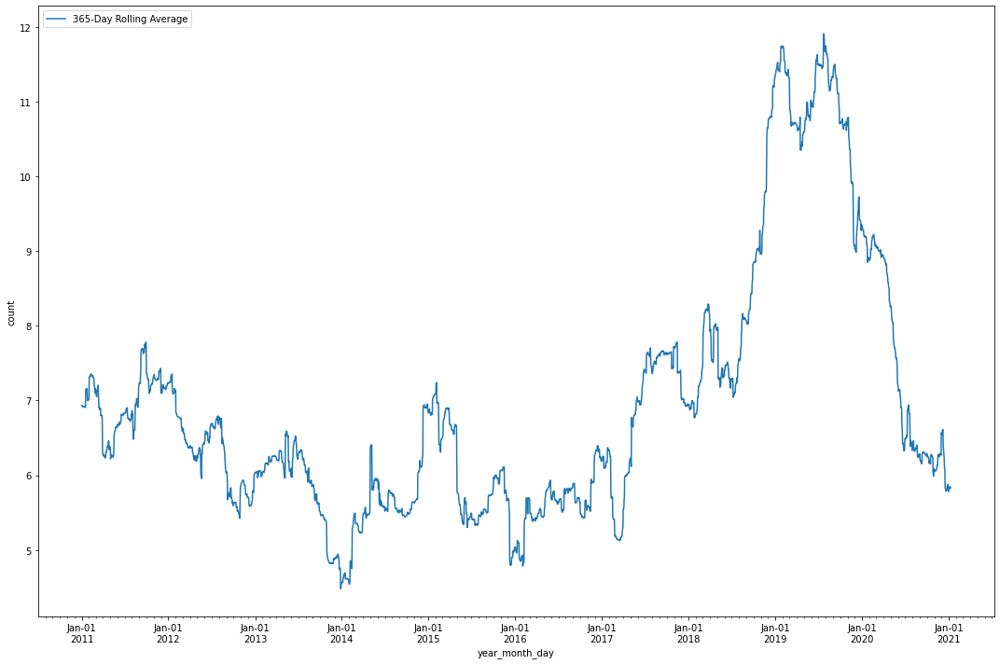

In [262]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator() # every year
months = mdates.MonthLocator() # every month
years_fmt = mdates.DateFormatter('%b-%d\n%Y')

# format the ticks
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)
ax.xaxis.set_minor_locator(months)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_2.png')

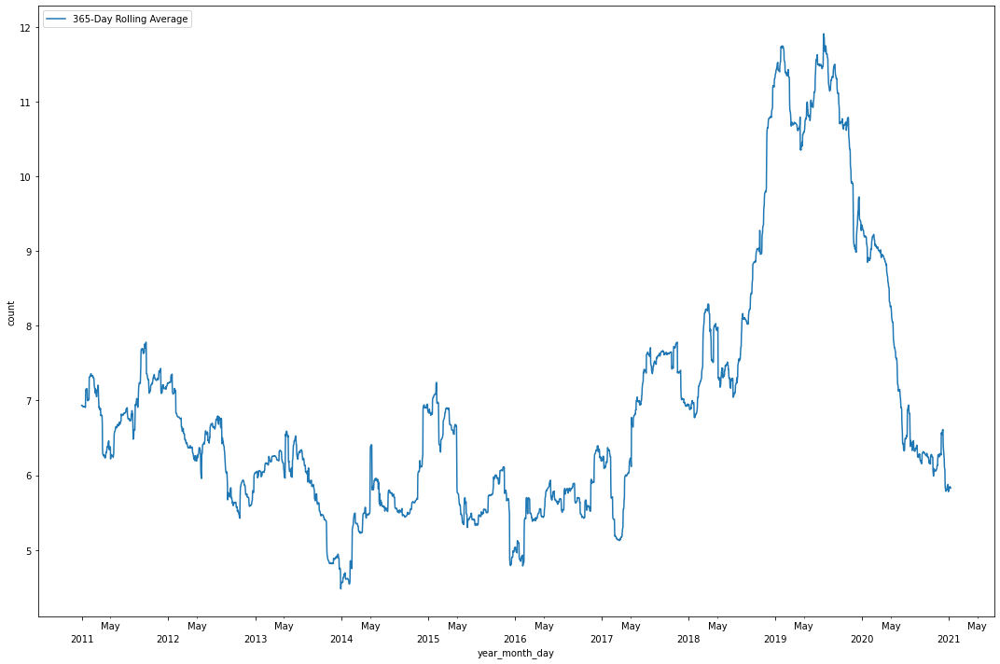

In [263]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator() # every year
months = mdates.MonthLocator(5) # display on May (5)
monthsFmt = mdates.DateFormatter('%b') 
yearsFmt = mdates.DateFormatter('\n%Y')

ax.xaxis.set_minor_locator(months)
ax.xaxis.set_minor_formatter(monthsFmt)
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_3.png')

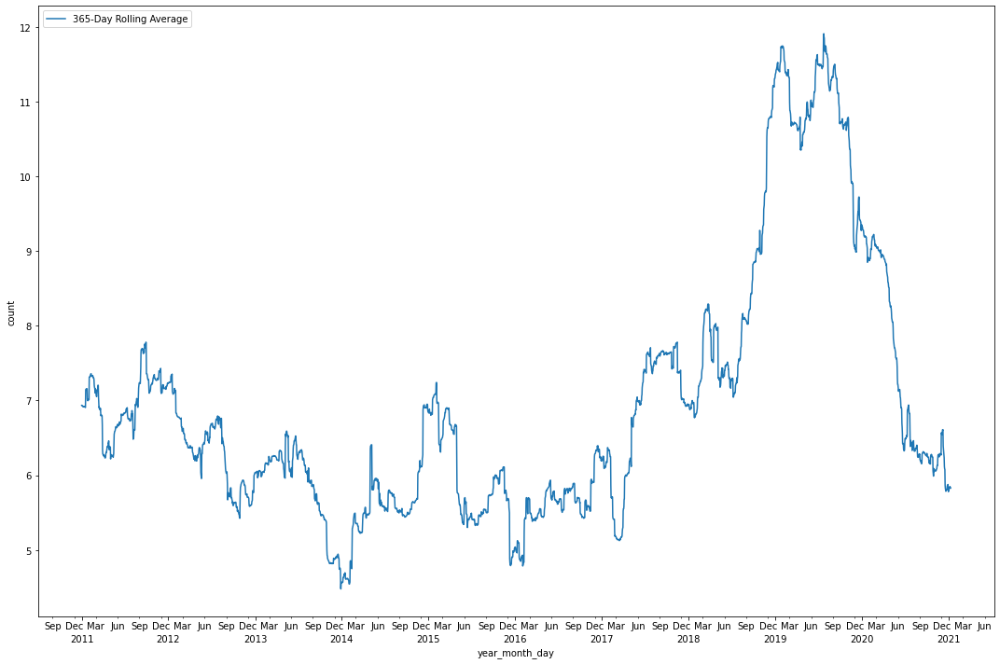

In [264]:
fig, ax = plt.subplots(figsize=(15,10))

years = mdates.YearLocator()  # every year
months = mdates.MonthLocator(interval=3) # every 3 months
monthsFmt = mdates.DateFormatter('%b') 
yearsFmt = mdates.DateFormatter('\n%Y')

ax.xaxis.set_minor_locator(months)
ax.xaxis.set_minor_formatter(monthsFmt)
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(yearsFmt)

sns.lineplot(data=flooding_311_daily.rolling(365).mean(), 
             label='365-Day Rolling Average', 
             ax=ax)

plt.legend(loc=2)
plt.tight_layout()
plt.savefig('figures/x_axis_label_4.png')

# 9. Timedelta of Complaints

In [265]:
flooding_311.closed_date = pd.to_datetime(flooding_311.closed_date)

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,year_month,year_month_week,month,quarter,week_of_year,day,day_name,hour,time,am_pm
0,45989680,2020-04-12 14:14:00,2020-04-13 08:10:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,2020-04-01,2020-04-12,4,2,15,12,Sunday,14,14:14:00,PM
1,45178597,2019-12-16 07:48:00,2020-01-16 13:35:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,2019-12-01,2019-12-22,12,4,51,16,Monday,7,07:48:00,AM
2,47428465,2020-09-01 09:58:00,2020-09-01 18:05:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,2020-09-01,2020-09-06,9,3,36,1,Tuesday,9,09:58:00,AM
3,48133312,2020-11-12 16:23:00,2020-11-13 14:10:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,2020-11-01,2020-11-15,11,4,46,12,Thursday,16,16:23:00,PM
4,48135671,2020-11-12 14:19:00,2020-11-16 08:35:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,2020-11-01,2020-11-15,11,4,46,12,Thursday,14,14:19:00,PM


In [266]:
flooding_311.iloc[:, :3].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27885 entries, 0 to 27905
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   unique_key    27885 non-null  int64         
 1   created_date  27885 non-null  datetime64[ns]
 2   closed_date   27874 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1)
memory usage: 1.9 MB


In [267]:
flooding_311['complaint_duration'] = flooding_311.closed_date - flooding_311.created_date

flooding_311[['created_date', 'closed_date', 'complaint_duration']].head(10)

,created_date,closed_date,complaint_duration
0,2020-04-12 14:14:00,2020-04-13 08:10:00,0 days 17:56:00
1,2019-12-16 07:48:00,2020-01-16 13:35:00,31 days 05:47:00
2,2020-09-01 09:58:00,2020-09-01 18:05:00,0 days 08:07:00
3,2020-11-12 16:23:00,2020-11-13 14:10:00,0 days 21:47:00
4,2020-11-12 14:19:00,2020-11-16 08:35:00,3 days 18:16:00
5,2020-08-14 14:54:00,2020-08-18 11:00:00,3 days 20:06:00
6,2020-08-17 09:43:00,2020-08-17 12:30:00,0 days 02:47:00
7,2020-08-18 08:29:00,2020-08-18 09:55:00,0 days 01:26:00
8,2020-10-29 15:50:00,2020-11-02 07:45:00,3 days 15:55:00
9,2020-10-29 12:39:00,2020-10-30 11:40:00,0 days 23:01:00


In [268]:
flooding_311[['created_date', 'closed_date', 'complaint_duration']].tail(10)

,created_date,closed_date,complaint_duration
27896,2020-10-29 13:10:00,2020-10-29 13:55:00,0 days 00:45:00
27897,2020-10-30 12:44:00,2020-10-30 14:00:00,0 days 01:16:00
27898,2020-10-30 09:26:00,2020-10-30 11:15:00,0 days 01:49:00
27899,2020-08-27 21:19:00,2020-09-02 10:25:00,5 days 13:06:00
27900,2019-12-14 02:44:00,2019-12-14 14:30:00,0 days 11:46:00
27901,2019-11-19 09:59:00,2019-12-15 10:00:00,26 days 00:01:00
27902,2020-11-01 19:49:00,2020-11-01 21:25:00,0 days 01:36:00
27903,2020-11-01 18:17:00,2020-11-01 21:00:00,0 days 02:43:00
27904,2020-11-01 16:52:00,2020-11-02 01:30:00,0 days 08:38:00
27905,2020-11-02 10:27:00,2020-11-02 11:15:00,0 days 00:48:00


In [269]:
flooding_311[['complaint_duration']].describe()

,complaint_duration
count,27874
mean,2 days 14:35:23.439047140
std,13 days 12:13:00.774586598
min,-10 days +16:41:00
25%,0 days 03:02:00
50%,0 days 17:12:00
75%,1 days 18:40:00
max,709 days 10:34:00


In [270]:
flooding_311.sort_values(by='complaint_duration', 
                         ascending=True)[['created_date', 
                                           'closed_date', 
                                           'complaint_duration']].head()

,created_date,closed_date,complaint_duration
27734,2020-08-12 16:39:00,2020-08-03 09:20:00,-10 days +16:41:00
27213,2020-03-25 10:52:00,2020-03-20 08:45:00,-6 days +21:53:00
23624,2020-06-12 11:39:00,2020-06-10 10:20:00,-3 days +22:41:00
26795,2020-07-13 15:18:00,2020-07-12 09:10:00,-2 days +17:52:00
9450,2014-05-13 17:49:00,2014-05-13 17:49:00,0 days 00:00:00


In [271]:
flooding_311.sort_values(by='complaint_duration', 
                         ascending=False)[['created_date', 
                                           'closed_date', 
                                           'complaint_duration']].head()

,created_date,closed_date,complaint_duration
27223,2017-01-24 08:11:00,2019-01-03 18:45:00,709 days 10:34:00
27060,2019-01-20 18:14:00,2020-08-12 11:00:00,569 days 16:46:00
342,2018-11-16 15:30:00,2020-03-19 11:20:00,488 days 19:50:00
20053,2019-01-11 12:45:00,2020-02-23 13:30:00,408 days 00:45:00
20139,2019-01-28 16:19:00,2020-02-26 09:15:00,393 days 16:56:00


In [272]:
flooding_311['complaint_duration_days'] = flooding_311['complaint_duration'].dt.days
flooding_311['complaint_duration_seconds'] = flooding_311['complaint_duration'].dt.seconds
flooding_311['complaint_duration_hours'] = flooding_311['complaint_duration_days'] * 24 + flooding_311['complaint_duration_seconds'] / 3600

flooding_311.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,week_of_year,day,day_name,hour,time,am_pm,complaint_duration,complaint_duration_days,complaint_duration_seconds,complaint_duration_hours
0,45989680,2020-04-12 14:14:00,2020-04-13 08:10:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,15,12,Sunday,14,14:14:00,PM,0 days 17:56:00,0.00,64560.00,17.93
1,45178597,2019-12-16 07:48:00,2020-01-16 13:35:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11207.00,WILLIAMS AVENUE,EAST NEW YORK AVENUE,...,51,16,Monday,7,07:48:00,AM,31 days 05:47:00,31.00,20820.00,749.78
2,47428465,2020-09-01 09:58:00,2020-09-01 18:05:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11001.00,NaN,NaN,...,36,1,Tuesday,9,09:58:00,AM,0 days 08:07:00,0.00,29220.00,8.12
3,48133312,2020-11-12 16:23:00,2020-11-13 14:10:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11236.00,NaN,NaN,...,46,12,Thursday,16,16:23:00,PM,0 days 21:47:00,0.00,78420.00,21.78
4,48135671,2020-11-12 14:19:00,2020-11-16 08:35:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),11208.00,SAPPHIRE STREET,LORING AVENUE,...,46,12,Thursday,14,14:19:00,PM,3 days 18:16:00,3.00,65760.00,90.27


In [273]:
flooding_311[['complaint_duration_days', 'complaint_duration_hours']].describe()

,complaint_duration_days,complaint_duration_hours
count,27874.00,27874.00
mean,2.20,62.59
std,13.49,324.22
min,-10.00,-223.32
25%,0.00,3.03
50%,0.00,17.20
75%,1.00,42.67
max,709.00,17026.57


In [274]:
flooding_311.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27885 entries, 0 to 27905
Data columns (total 46 columns):
 #   Column                          Non-Null Count  Dtype          
---  ------                          --------------  -----          
 0   unique_key                      27885 non-null  int64          
 1   created_date                    27885 non-null  datetime64[ns] 
 2   closed_date                     27874 non-null  datetime64[ns] 
 3   agency                          27885 non-null  object         
 4   agency_name                     27885 non-null  object         
 5   complaint_type                  27885 non-null  object         
 6   descriptor                      27885 non-null  object         
 7   incident_zip                    27032 non-null  float64        
 8   intersection_street_1           10083 non-null  object         
 9   intersection_street_2           10083 non-null  object         
 10  address_type                    27882 non-null  object    

In [275]:
gdf = gpd.GeoDataFrame(flooding_311, 
                       geometry=gpd.points_from_xy(flooding_311.x_coordinate_state_plane, 
                                                   flooding_311.y_coordinate_state_plane))

gdf.set_crs(epsg=2263, inplace=True)
gdf.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: USA - New York - SPCS - Long Island
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [276]:
nta_shape.head()

,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588...."
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.497 221913.624, 103936..."
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.281 217531.059, 102305..."
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.351 171942.592, 998339...."
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.738 201007.310, 105192..."


In [277]:
flooding_complaints_with_nta = gpd.sjoin(gdf, 
                                         nta_shape.to_crs(2263), 
                                         how="inner", 
                                         op='within')

In [278]:
flooding_complaints_with_nta.head()

,unique_key,created_date,closed_date,agency,agency_name,complaint_type,descriptor,incident_zip,intersection_street_1,intersection_street_2,...,complaint_duration_hours,geometry,index_right,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code
0,45989680,2020-04-12 14:14:00,2020-04-13 08:10:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,17.93,POINT (952928.000 168312.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
66,45188341,2019-12-18 08:20:00,2019-12-20 09:30:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,BROADWAY,DELAFIELD AVENUE,...,49.17,POINT (951912.000 169099.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
83,46379956,2020-06-04 07:24:00,2020-06-04 14:40:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,7.27,POINT (954593.000 169517.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
185,46122447,2020-05-03 13:25:00,2020-05-03 14:20:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,0.92,POINT (954095.000 168394.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5
537,24452089,2012-11-21 09:58:00,2012-11-22 09:30:00,DEP,Department of Environmental Protection,Sewer,Street Flooding (SJ),10310.00,NaN,NaN,...,23.53,POINT (952928.000 168312.000),122,SI35,47137243.9922,085,New Brighton-Silver Lake,30320.3749453,Staten Island,5


In [279]:
flooding_complaints_with_nta = flooding_complaints_with_nta.groupby('ntaname').agg({'complaint_duration_hours': 
                                                                                    ['mean', 'median']}).reset_index()

flooding_complaints_with_nta.head()

ntaname complaint_duration_hours       
                                                                  mean median
0                                     Airport                    75.83   2.33
1                     Allerton-Pelham Gardens                    14.11   4.50
2  Annadale-Huguenot-Prince's Bay-Eltingville                    40.24  19.81
3                               Arden Heights                    31.21  20.17
4                                     Astoria                   155.79  16.12

In [280]:
flooding_complaints_with_nta = nta_shape.merge(flooding_complaints_with_nta, 
                                               left_on='ntaname', 
                                               right_on='ntaname')

flooding_complaints_with_nta.head()

C:\Users\datal\.conda\envs\mebauer-flood\lib\site-packages\pandas\core\reshape\merge.py:648: UserWarning: merging between different levels can give an unintended result (1 levels on the left,2 on the right)
  warnings.warn(msg, UserWarning)
C:\Users\datal\.conda\envs\mebauer-flood\lib\site-packages\pandas\core\generic.py:4150: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,ntacode,shape_area,county_fips,ntaname,shape_leng,boro_name,boro_code,geometry,"(complaint_duration_hours, mean)","(complaint_duration_hours, median)"
0,BK88,54005019.048,047,Borough Park,39247.2278309,Brooklyn,3,"MULTIPOLYGON (((990897.911 169268.253, 990588....",51.90,18.93
1,QN51,52488277.5915,081,Murray Hill,33266.9048721,Queens,4,"MULTIPOLYGON (((1038593.497 221913.624, 103936...",61.93,15.07
2,QN27,19726845.5925,081,East Elmhurst,19816.7121316,Queens,4,"MULTIPOLYGON (((1022728.281 217531.059, 102305...",72.26,13.85
3,BK95,14522603.5915,047,Erasmus,18756.7018646,Brooklyn,3,"MULTIPOLYGON (((998608.351 171942.592, 998339....",30.73,20.59
4,QN07,22887772.8087,081,Hollis,20976.3355996,Queens,4,"MULTIPOLYGON (((1051539.738 201007.310, 105192...",44.66,20.13


In [281]:
flooding_complaints_with_nta.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 194 entries, 0 to 193
Data columns (total 10 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   ntacode                             194 non-null    object  
 1   shape_area                          194 non-null    object  
 2   county_fips                         194 non-null    object  
 3   ntaname                             194 non-null    object  
 4   shape_leng                          194 non-null    object  
 5   boro_name                           194 non-null    object  
 6   boro_code                           194 non-null    object  
 7   geometry                            194 non-null    geometry
 8   (complaint_duration_hours, mean)    194 non-null    float64 
 9   (complaint_duration_hours, median)  194 non-null    float64 
dtypes: float64(2), geometry(1), object(7)
memory usage: 16.7+ KB


In [282]:
flooding_complaints_with_nta.columns

Index([                             'ntacode',
                                 'shape_area',
                                'county_fips',
                                    'ntaname',
                                 'shape_leng',
                                  'boro_name',
                                  'boro_code',
                                   'geometry',
         ('complaint_duration_hours', 'mean'),
       ('complaint_duration_hours', 'median')],
      dtype='object')

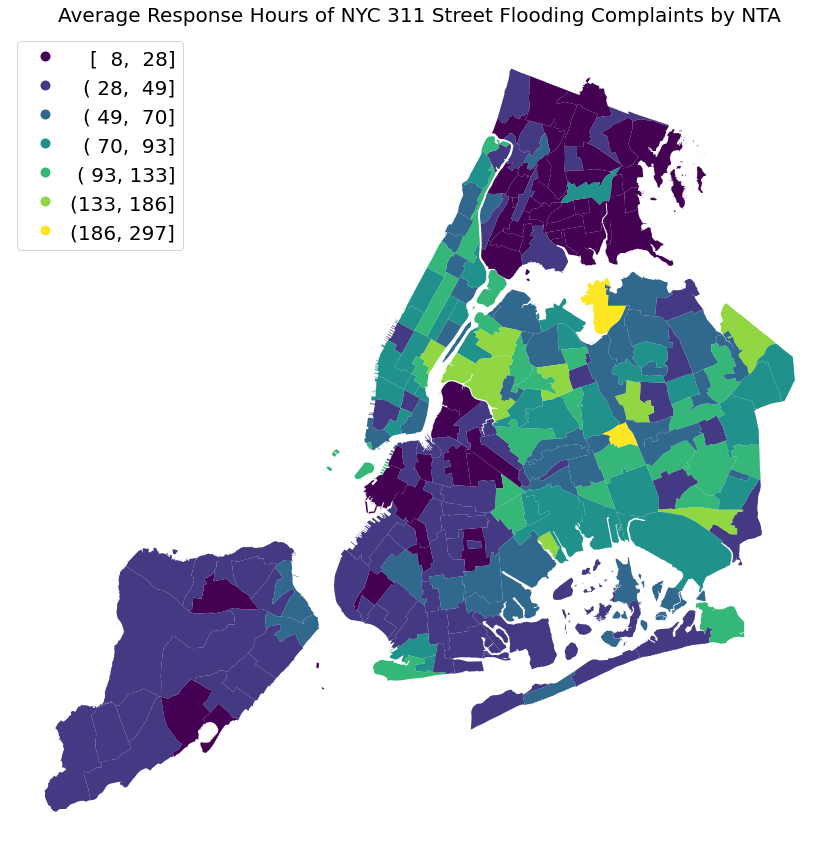

In [283]:
fig, ax = plt.subplots(figsize=(12,12))

flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'mean'), 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.0f}",
                                              'fontsize': "20"})
leg = ax.get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(150)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

ax.set_title('Average Response Hours of NYC 311 Street Flooding Complaints by NTA', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

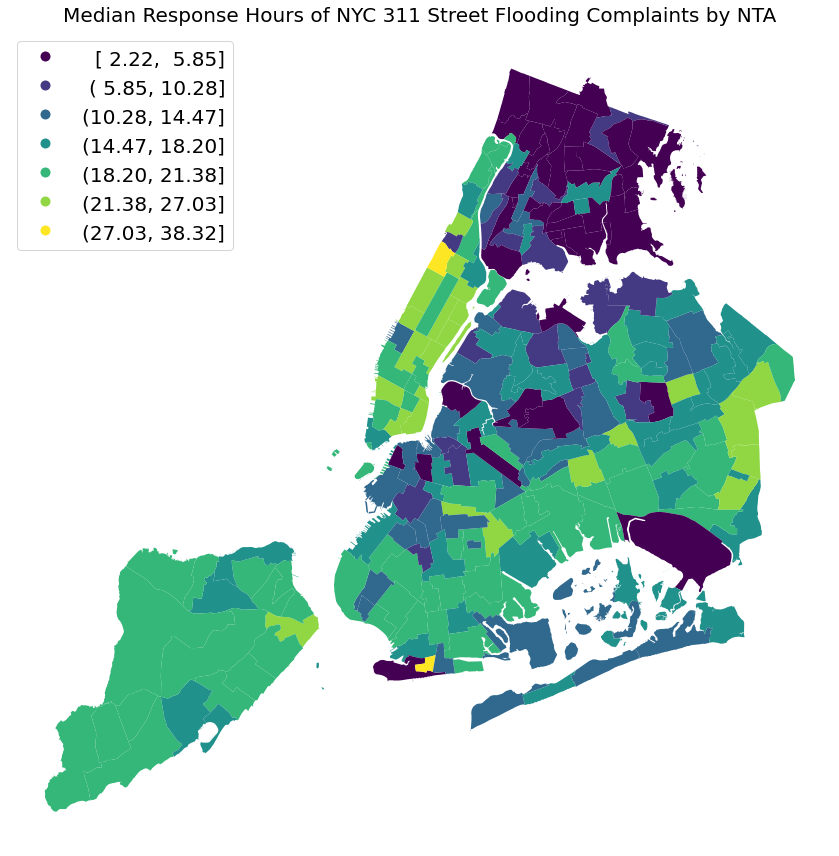

In [284]:
fig, ax = plt.subplots(figsize=(12,12))

flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'median'), 
                                  cmap='viridis',
                                  ax=ax, 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.2f}",
                                              'fontsize': "20"})
leg = ax.get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(200)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

ax.set_title('Median Response Hours of NYC 311 Street Flooding Complaints by NTA', 
             fontsize=20, 
             pad=10)

ax.set_aspect('equal', 'box')
ax.axis('off')
plt.tight_layout()

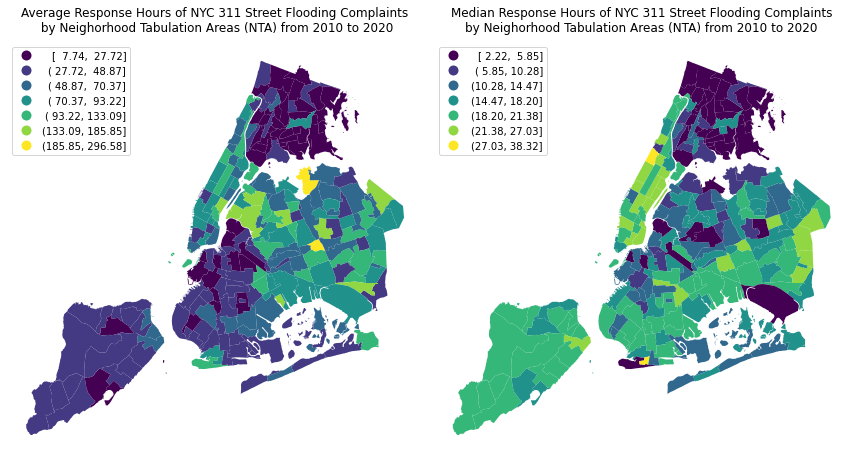

In [285]:
fig, axs = plt.subplots(1, 2, sharey=False, figsize=(12, 12))

flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'mean'), 
                                  cmap='viridis',
                                  ax=axs[0], 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.2f}",
                                              'fontsize': "10"})
leg = axs[0].get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(110)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

axs[0].set_title('Average Response Hours of NYC 311 Street Flooding Complaints\n by Neighorhood Tabulation Areas (NTA) from 2010 to 2020', 
             fontsize=12, 
             pad=10)

axs[0].set_aspect('equal', 'box')
axs[0].axis('off')



flooding_complaints_with_nta.plot(column=('complaint_duration_hours', 'median'), 
                                  cmap='viridis',
                                  ax=axs[1], 
                                  legend=True, 
                                  scheme='fisher_jenks',
                                  k=7,
                                  legend_kwds={'loc': "upper left", 
                                              'fmt': "{:,.2f}",
                                              'fontsize': "10"})
leg = axs[1].get_legend()

hp = leg._legend_box.get_children()[1]
for vp in hp.get_children():
    for row in vp.get_children():
        row.set_width(100)  # need to adapt this manually
        row.mode= "expand"
        row.align="right" 

axs[1].set_title('Median Response Hours of NYC 311 Street Flooding Complaints\nby Neighorhood Tabulation Areas (NTA) from 2010 to 2020', 
             fontsize=12, 
             pad=10)

axs[1].set_aspect('equal', 'box')
axs[1].axis('off')

plt.tight_layout()

In [286]:
flooding_complaints_with_nta.to_csv('data-output/complaints-timedelta-by-nta.csv', index=False)

# 10. Conclusion